<a href="https://colab.research.google.com/github/ssshendo3501/study-record/blob/main/Udemy_scikit_learn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# pythonの機械学習ライブラリscikit-learnを使って，識別の基本を徹底的にマスターしよう！

# Section3：学習から識別まで

In [ ]:
import warnings
warnings.filterwarnings('ignore')

## 3-1 2次元データの識別の例

In [ ]:
import numpy as np

In [ ]:
# 2D_example.csvの表示
!cat 2D_example.csv

1,-7.428476,1.509903
0,2.980693,1.960821
0,3.988255,4.636389
1,-5.789437,-4.621614
1,-4.894447,-3.269730
1,-1.933949,-0.047276
0,-1.611771,5.932201
1,-6.670152,-1.036282
1,-2.931415,-0.104475
0,-0.074762,1.070002
1,-2.691793,4.168774
0,0.461182,3.453438
0,-1.354135,3.751657
1,-6.229476,-1.209434
0,2.778594,7.582103
1,-5.719578,-0.243509
0,0.928322,3.208520
0,0.850475,2.908955
1,-6.029489,-1.831199
0,1.116025,3.353602


In [ ]:
#ファイルの表示は下記でもできる
with open('2D_example.csv') as f:
  print(f.read())

1,-7.428476,1.509903
0,2.980693,1.960821
0,3.988255,4.636389
1,-5.789437,-4.621614
1,-4.894447,-3.269730
1,-1.933949,-0.047276
0,-1.611771,5.932201
1,-6.670152,-1.036282
1,-2.931415,-0.104475
0,-0.074762,1.070002
1,-2.691793,4.168774
0,0.461182,3.453438
0,-1.354135,3.751657
1,-6.229476,-1.209434
0,2.778594,7.582103
1,-5.719578,-0.243509
0,0.928322,3.208520
0,0.850475,2.908955
1,-6.029489,-1.831199
0,1.116025,3.353602



In [ ]:
#データを作りたい場合はこちら
    # # making 2D_example.csv\n",
    # import numpy as np\n",
    # from sklearn.datasets import make_blobs\n",
    # X, y = make_blobs(n_samples=20, # 20個生成\n",
    #                   n_features=2, # 2次元\n",
    #                   centers=2,    # クラスタ中心2個\n",
    #                   cluster_std = 2, # クラスタの大きさ（標準偏差）\n",
    #                   random_state=3   # 乱数種（再現用）\n",
    #                  )\n",
    # np.savetxt(\"2D_example.csv\", np.hstack((y.reshape(20,1), X)), fmt=\"%d,%f,%f\")"

In [ ]:
# dataにデータをセット
data = np.loadtxt("2D_example.csv", delimiter=",")

In [ ]:
# 一番左の列を目的変数yとして設定する
# さらにyをint型に変更する
y = data[:, 0].astype(int)  # 1列目のラベルを整数に変換

In [ ]:
y

array([1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0])

In [ ]:
# 2列目以降を説明変数xに変換する
X = data[:, 1:3] #2列目3列目を持ってくる

In [ ]:
X

array([[-7.428476,  1.509903],
       [ 2.980693,  1.960821],
       [ 3.988255,  4.636389],
       [-5.789437, -4.621614],
       [-4.894447, -3.26973 ],
       [-1.933949, -0.047276],
       [-1.611771,  5.932201],
       [-6.670152, -1.036282],
       [-2.931415, -0.104475],
       [-0.074762,  1.070002],
       [-2.691793,  4.168774],
       [ 0.461182,  3.453438],
       [-1.354135,  3.751657],
       [-6.229476, -1.209434],
       [ 2.778594,  7.582103],
       [-5.719578, -0.243509],
       [ 0.928322,  3.20852 ],
       [ 0.850475,  2.908955],
       [-6.029489, -1.831199],
       [ 1.116025,  3.353602]])

In [ ]:
X[:, 0]

array([-7.428476,  2.980693,  3.988255, -5.789437, -4.894447, -1.933949,
       -1.611771, -6.670152, -2.931415, -0.074762, -2.691793,  0.461182,
       -1.354135, -6.229476,  2.778594, -5.719578,  0.928322,  0.850475,
       -6.029489,  1.116025])

In [ ]:
X[:, 1]

array([ 1.509903,  1.960821,  4.636389, -4.621614, -3.26973 , -0.047276,
        5.932201, -1.036282, -0.104475,  1.070002,  4.168774,  3.453438,
        3.751657, -1.209434,  7.582103, -0.243509,  3.20852 ,  2.908955,
       -1.831199,  3.353602])

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.set_cmap(plt.cm.Paired) #色設定

<Figure size 640x480 with 0 Axes>

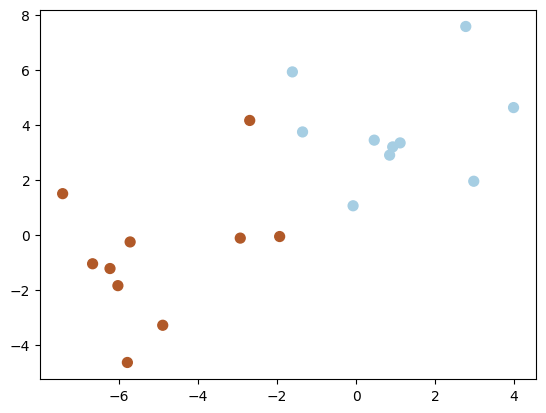

In [ ]:
# 2次元散布図でプロット
plt.scatter(X[:, 0], X[:, 1], c=y, s=50) # c(color)はy(0.1)のラベルに従う、s(サイズ)は50ぐらい

In [ ]:
# 境界線を引く関数の定義

def plotBoundary(X, clf, mesh=True, boundary=True, n_neighbors=1):

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    Z = clf.predict(np.c_[XX.ravel(), YY.ravel()]) # evaluate the value

    Z = Z.reshape(XX.shape) # just reshape

    if mesh:
        plt.pcolormesh(XX, YY, Z, zorder=-10) # paint in 2 colors, if Z > 0 or not

    if boundary:
        plt.contour(XX, YY, Z,
                    colors='k', linestyles='-', levels=[0.5])

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)


このコードは、機械学習モデルの境界線を可視化するための関数を定義しています。以下にその主要な部分を分かりやすく説明します。

1. `def plotBoundary(X, clf, mesh=True, boundary=True, n_neighbors=1):`:
   - `plotBoundary`という名前の関数を定義しています。この関数は以下の引数を受け取ります。
     - `X`: 学習データの特徴量行列。
     - `clf`: 分類器（機械学習モデル）。
     - `mesh`: メッシュグリッドを描画するかどうかを指定するフラグ（デフォルトでTrue）。
     - `boundary`: 境界線を描画するかどうかを指定するフラグ（デフォルトでTrue）。
     - `n_neighbors`: 境界線の詳細度を制御するための近傍点の数（デフォルトで1）。

2. `x_min`, `x_max`, `y_min`, `y_max`:
   - 学習データの特徴量の最小値と最大値を計算しています。これにより、プロットの範囲を設定します。

3. `XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j]`:
   - `np.mgrid`を使用して、2次元のメッシュグリッドを作成しています。これは境界線を描画するための格子状の点を生成します。`200j`は、各次元における格子点の数を指定しています。

4. `Z = clf.predict(np.c_[XX.ravel(), YY.ravel()])`:
   - メッシュグリッド上の各点で、与えられた分類器 (`clf`) を使用して予測を行っています。`XX.ravel()`および`YY.ravel()`は、格子点を1次元の配列に平坦化して、分類器に渡しています。

5. `Z = Z.reshape(XX.shape)`:
   - 分類器によって予測された結果 (`Z`) を元の2次元形状 (`XX`と`YY`の形状) に戻しています。

6. `if mesh:`:
   - `mesh`がTrueの場合、メッシュグリッドを描画します。メッシュグリッドは、境界線の背景として使用され、領域ごとに色分けされます。

7. `if boundary:`:
   - `boundary`がTrueの場合、境界線を描画します。境界線は、領域間の分離線を示します。境界線は黒色の実線で描画されます。

8. `plt.xlim(x_min, x_max)`および`plt.ylim(y_min, y_max)`:
   - プロットのx軸およびy軸の範囲を、計算した最小値と最大値に設定します。

この関数は、与えられた学習データと分類器に基づいて、境界線を可視化するのに便利です。メッシュグリッドを背景に描画し、境界線を重ねて表示します。この境界線は、分類器が学習データをどのように分割しているかを示すのに役立ちます。

In [ ]:
# 以下より、K平均法、ロジスティック回帰、SVMでラベルを分割する

In [ ]:
# モジュールの準備
from sklearn import neighbors

# オブジェクトの生成
clf = neighbors.KNeighborsClassifier(n_neighbors=1)

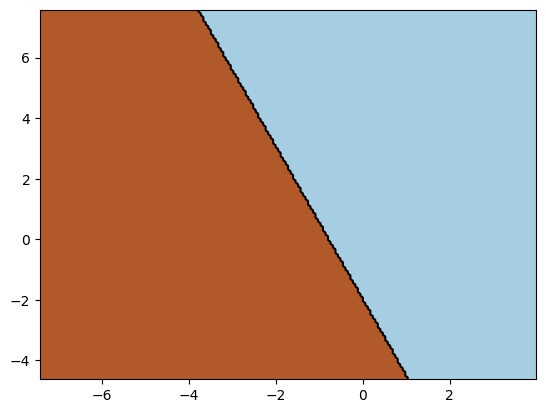

In [ ]:
# 学習
clf.fit(X, y)

#可視化
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y)

#境界線の描画
plotBoundary(X, clf)

# 下記によって、K平均法のモデルがどのように分割できるか示している。
# なぜかプロットが出ないので、あとで検討する

In [ ]:
# モジュールの準備
from sklearn import linear_model

# インスタンス生成（ロジスティック回帰）
clf = linear_model.LogisticRegression()

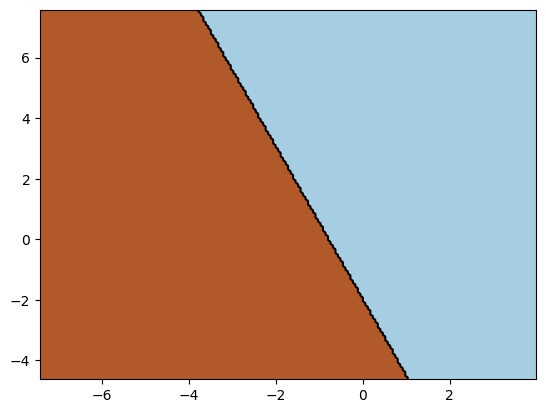

In [ ]:
# 学習
clf.fit(X, y)

#可視化
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y)

#境界線の描画
plotBoundary(X, clf)

In [ ]:
# モジュールの準備
from sklearn import svm

# インスタンス生成(線形SVM)
clf = svm.SVC(kernel='linear')

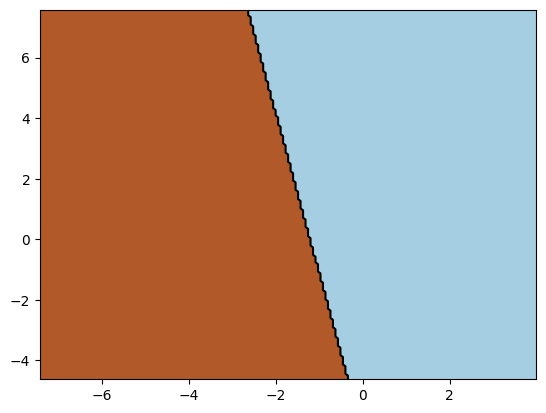

In [ ]:
# 学習
clf.fit(X, y)

#可視化
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y)

#境界線の描画
plotBoundary(X, clf)

In [ ]:
# モジュールの準備
from sklearn import svm

# インスタンス生成(非線形SVM)
clf = svm.SVC(kernel='rbf')

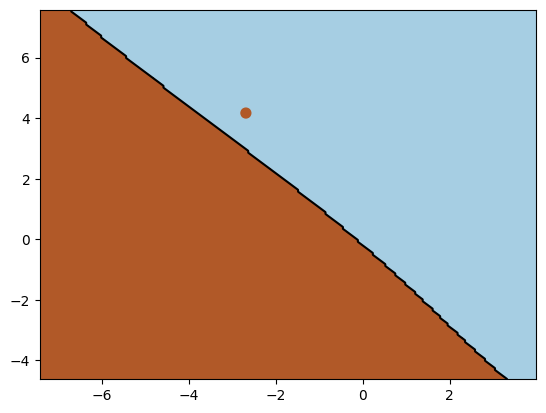

In [ ]:
# 学習
clf.fit(X, y)

#可視化
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y)

#境界線の描画
plotBoundary(X, clf)

In [ ]:
# このようにデータの準備
# モジュール作成
# 学習
# 可視化

## 3-2 がんデータの識別

In [ ]:
import numpy as np

In [ ]:
# 癌のデータの準備
from sklearn.datasets import load_breast_cancer

In [ ]:
data = load_breast_cancer()

In [ ]:
X = data.data #.dataに説明変数となるデータが入っている

In [ ]:
X.shape

(569, 30)

In [ ]:
X[0]

array([1.799e+01, 1.038e+01, 1.228e+02, 1.001e+03, 1.184e-01, 2.776e-01,
       3.001e-01, 1.471e-01, 2.419e-01, 7.871e-02, 1.095e+00, 9.053e-01,
       8.589e+00, 1.534e+02, 6.399e-03, 4.904e-02, 5.373e-02, 1.587e-02,
       3.003e-02, 6.193e-03, 2.538e+01, 1.733e+01, 1.846e+02, 2.019e+03,
       1.622e-01, 6.656e-01, 7.119e-01, 2.654e-01, 4.601e-01, 1.189e-01])

In [ ]:
data.feature_names

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [ ]:
y = data.target # .targetにラベルの変数が入っている

In [ ]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [ ]:
y.shape

(569,)

In [ ]:
data.target_names #0,1のラベルの意味

array(['malignant', 'benign'], dtype='<U9')

In [ ]:
# データの詳細の記述(ディスクリプション)
print(data.DESCR)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [ ]:
#以下より、識別する

In [ ]:
# 線形モデルの準備
from sklearn import linear_model

# 識別機の生成
clf = linear_model.LogisticRegression()

In [ ]:
clf

LogisticRegression()

In [ ]:
# 学習データとテストデータの分割
# 半分のデータで学習する
n_samples = X.shape[0]  # データの個数
n_train = n_samples // 2 #半分のデータを学習
n_test = n_samples - n_train #テストデータ数

In [ ]:
# インデックスの生成
train_index = range(0, n_train)

# n_train, n_train,.....,n_samples-1
test_index = range(n_train, n_samples)

In [ ]:
train_index

range(0, 284)

In [ ]:
test_index

range(284, 569)

In [ ]:
np.array(train_index)

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [ ]:
np.array(test_index)

array([284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296,
       297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309,
       310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322,
       323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335,
       336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348,
       349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361,
       362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374,
       375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387,
       388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400,
       401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413,
       414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426,
       427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439,
       440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452,
       453, 454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 46

In [ ]:
X_train = X[train_index] #学習データ
X_test = X[test_index]   #テストデータ

y_train = y[train_index] #学習データのラベル
y_test = y[test_index]   #テストデータのラベル

In [ ]:
X_train.shape

(284, 30)

In [ ]:
y_train.shape

(284,)

In [ ]:
# 上と全く同じ(タプルで書ける)
# 学習データとテストデータに分割
X_train, X_test, y_train, y_test = X[train_index], X[test_index], y[train_index], y[test_index],

In [ ]:
# 識別器の学習
clf.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
# 学習データの精度
print(clf.score(X_train, y_train))

0.9612676056338029


In [ ]:
# テストデータの精度
print(clf.score(X_test, y_test))

0.9473684210526315


In [ ]:
# テストデータの識別
clf.predict(X_test)

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1])

In [ ]:
wrong = 0
for i, j in zip(clf.predict(X_test), y_test):
  if i == j:
    print(i,j) #正解なら何も書かない
  else:
    print(i,j, " Wrong!")  #不正解なら何も書かない
    wrong += 1

1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 0  Wrong!
1 1
1 1
0 0
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 0
1 1
1 1
1 1
0 0
1 1
0 0
1 1
1 1
1 1
1 1
0 0
0 0
0 0
1 1
1 1
1 1
1 1
0 0
1 1
0 0
1 1
0 0
0 1  Wrong!
1 1
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 0
0 0
0 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 1  Wrong!
1 1
0 0
0 0
1 1
0 0
0 0
0 0
1 1
0 0
0 0
1 1
1 1
1 1
1 1
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 0  Wrong!
1 1
1 1
1 1
0 0
1 1
1 1
0 0
0 0
1 1
1 1
1 1
1 1
1 1
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 0
1 1
0 1  Wrong!
1 1
1 1
0 1  Wrong!
0 0
1 1
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 0
1 1
0 0
0 0
1 1
0 0
1 1
1 1
1 1
1 1
0 1  Wrong!
0 0
1 1
1 1
0 0
1 1
0 0
1 1
0 1  Wrong!
0 0
1 1
0 0
1 1
1 1
1 1
0 1  Wrong!
1 1
1 1
1 1
1 1
0 0
0 0
1 1
1 1
1 1
0 1  Wrong!
1 1
1 1
0 0
1 1
1 1
1 1
1 1
1 1
1 1
1 1
0 1  Wrong!
1 1
1 1
0 0
1 1
0 1  Wrong!
1 1
1 1
1 1
1 1
1 1
0 0
1 1
0 0
1 1
0 1  Wrong!
0 0
1 1
1 1
1 1
1 1
1 1
0 0
0 0
1 1
0 0
1 1
0 0
1 1
1 1
1 1
1 1


In [ ]:
print(f'{wrong} / {n_test} = {1-wrong/n_test}')

15 / 285 = 0.9473684210526316


## 3-3 あやめデータの識別

In [ ]:
# あやめのデータ準備
from sklearn.datasets import load_iris

In [ ]:
data = load_iris()

In [ ]:
X = data.data

In [ ]:
dir(data)

['DESCR',
 'data',
 'data_module',
 'feature_names',
 'filename',
 'frame',
 'target',
 'target_names']

In [ ]:
X.shape

(150, 4)

In [ ]:
y = data.target

In [ ]:
y.shape

(150,)

In [ ]:
data.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [ ]:
# 識別モデルを準備
from sklearn import linear_model

#識別器の準備
clf = linear_model.LogisticRegression()

In [ ]:
# さっきのコピペ

# 学習データとテストデータの分割
# 半分のデータで学習する
n_samples = X.shape[0]  # データの個数
n_train = n_samples // 2 #半分のデータを学習
n_test = n_samples - n_train #テストデータ数

In [ ]:
# インデックスの生成
train_index = range(0, n_train)

# n_train, n_train,.....,n_samples-1
test_index = range(n_train, n_samples)

In [ ]:
# 上と全く同じ(タプルで書ける)
# 学習データとテストデータに分割
X_train, X_test, y_train, y_test = X[train_index], X[test_index], y[train_index], y[test_index],

In [ ]:
# 識別器の学習
clf.fit(X_train, y_train)

LogisticRegression()

In [ ]:
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))

1.0
0.3333333333333333


In [ ]:
# あやめのデータは012の3クラス問題なのでランダムでも30%で当たる
# なので、このデータは何も意味がない

In [ ]:
clf.predict(X_test), y_test

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1]),
 array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2]))

In [ ]:
# なぜこうなったのか？
# 学習データとテストデータを確認してみる
# 学習データは多クラス問題なのに、01の識別しかない > ランダムで学習/テストデータを分ける必要がある
y_train, y_test

(array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1]),
 array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
        2, 2, 2, 2, 2, 2, 2, 2, 2]))

In [ ]:
# ランダムにシャッフルして、学習・テストに分割するモジュール
from sklearn.model_selection import ShuffleSplit

In [ ]:
ss = ShuffleSplit(n_splits=1,        #分割を1個生成
                  train_size=0.5,    #学習とテストを半分ずつ
                  test_size=0.5,
                  random_state=0)    #乱数種（再現用）

In [ ]:
# 学習データとテストデータのインデックス作成
train_index, test_index = next(ss.split(X))

In [ ]:
#本当にランダムにインデックスが分けられたか確認する
list(train_index)

In [ ]:
list(test_index)

In [ ]:
# ランダムに分けた分割法を使って再度学習データとテストデータ分ける
X_train, X_test, y_train, y_test = X[train_index], X[test_index], y[train_index], y[test_index],

In [ ]:
y_train, y_test

(array([0, 2, 1, 0, 1, 2, 1, 0, 2, 2, 2, 2, 0, 0, 2, 2, 0, 2, 0, 2, 2, 0,
        0, 2, 0, 0, 0, 1, 2, 2, 0, 0, 0, 1, 1, 0, 0, 1, 0, 2, 1, 2, 1, 0,
        2, 0, 2, 0, 0, 2, 0, 2, 1, 1, 1, 2, 2, 1, 1, 0, 1, 2, 2, 0, 1, 1,
        1, 1, 0, 0, 0, 2, 1, 2, 0]),
 array([2, 1, 0, 2, 0, 2, 0, 1, 1, 1, 2, 1, 1, 1, 1, 0, 1, 1, 0, 0, 2, 1,
        0, 0, 2, 0, 0, 1, 1, 0, 2, 1, 0, 2, 2, 1, 0, 1, 1, 1, 2, 0, 2, 0,
        0, 1, 2, 2, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 1, 2, 1, 0, 2, 1, 1, 1,
        1, 2, 0, 0, 2, 1, 0, 0, 1]))

In [ ]:
clf.fit(X_train, y_train)

LogisticRegression()

In [ ]:
#精度の確認
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))

0.9733333333333334
0.9333333333333333


In [ ]:
clf.predict(X_test), y_test

(array([2, 1, 0, 2, 0, 2, 0, 1, 1, 1, 2, 1, 1, 1, 1, 0, 1, 1, 0, 0, 2, 1,
        0, 0, 1, 0, 0, 1, 1, 0, 2, 1, 0, 2, 2, 1, 0, 2, 1, 1, 2, 0, 2, 0,
        0, 1, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 2, 1, 2, 1, 0, 2, 1, 1, 1,
        1, 2, 0, 0, 2, 1, 0, 0, 1]),
 array([2, 1, 0, 2, 0, 2, 0, 1, 1, 1, 2, 1, 1, 1, 1, 0, 1, 1, 0, 0, 2, 1,
        0, 0, 2, 0, 0, 1, 1, 0, 2, 1, 0, 2, 2, 1, 0, 1, 1, 1, 2, 0, 2, 0,
        0, 1, 2, 2, 2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 1, 2, 1, 0, 2, 1, 1, 1,
        1, 2, 0, 0, 2, 1, 0, 0, 1]))

In [ ]:
wrong = 0
for i, j in zip(clf.predict(X_test), y_test):
  if i == j:
    print(i,j) #正解なら何も書かない
  else:
    print(i,j, " Wrong!")  #不正解なら何も書かない
    wrong += 1

2 2
1 1
0 0
2 2
0 0
2 2
0 0
1 1
1 1
1 1
2 2
1 1
1 1
1 1
1 1
0 0
1 1
1 1
0 0
0 0
2 2
1 1
0 0
0 0
1 2  Wrong!
0 0
0 0
1 1
1 1
0 0
2 2
1 1
0 0
2 2
2 2
1 1
0 0
2 1  Wrong!
1 1
1 1
2 2
0 0
2 2
0 0
0 0
1 1
2 2
2 2
1 2  Wrong!
2 2
1 1
2 2
1 1
1 1
2 2
1 2  Wrong!
1 2  Wrong!
2 2
1 1
2 2
1 1
0 0
2 2
1 1
1 1
1 1
1 1
2 2
0 0
0 0
2 2
1 1
0 0
0 0
1 1


In [ ]:
print(f'{wrong} / {n_test} = {1-wrong/n_test}')

5 / 75 = 0.9333333333333333


## 3-4 ランダムに分けて何度も

In [ ]:
import numpy as np
from sklearn.datasets import load_iris
from sklearn.model_selection import ShuffleSplit
from sklearn import linear_model

In [ ]:
#データ準備
data = load_iris()
X = data.data     #説明変数
y = data.target   #目的変数

In [ ]:
#識別器のインスタンス生成
clf = linear_model.LogisticRegression()

In [ ]:
#データの分割
ss = ShuffleSplit(n_splits=1,        #分割を1個生成
                  train_size=0.5,    #学習とテストを半分ずつ
                  test_size=0.5,
                  random_state=0)    #乱数種（再現用）

In [ ]:
# 学習データとテストデータのインデックス作成
train_index, test_index = next(ss.split(X))

In [ ]:
# ランダムに分けた分割法を使って再度学習データとテストデータ分ける
X_train, X_test, y_train, y_test = X[train_index], X[test_index], y[train_index], y[test_index]

In [ ]:
# 識別器の学習
clf.fit(X_train, y_train)

LogisticRegression()

In [ ]:
#精度の確認
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))

0.9733333333333334
0.9333333333333333


In [ ]:
# ランダムに分けた分け方で本当に精度の良いモデルができたのか、疑問が残る
# 1回のランダム識別が偶々できた良かっただけではないか？
# これを確認するために、分割を何回もやって確認してみる

In [ ]:
#データの分割
ss = ShuffleSplit(n_splits=10,       #分割を10個生成############
                  train_size=0.5,    #学習とテストを半分ずつ
                  test_size=0.5,
                  random_state=0)    #乱数種（再現用）

scores = []

for train_index, test_index in ss.split(X):  # 10回作るのでインデックス作成が10回回る
  X_train, X_test, y_train, y_test = X[train_index], X[test_index], y[train_index], y[test_index] #データ分割
  clf.fit(X_train, y_train) #識別器学習
  score = clf.score(X_test, y_test) #テストデータの精度
  scores.append(score)

scores = np.array(scores)
print(scores)

[0.93333333 0.93333333 0.98666667 0.94666667 0.96       0.94666667
 0.97333333 1.         0.96       0.98666667]


In [ ]:
scores.mean()

0.9626666666666667

In [ ]:
scores.std()

0.022150996967781538

In [ ]:
print("{0:4.2f} +/- {1:4.2f} %".format(scores.mean() * 100, scores.std() * 100))

96.27 +/- 2.22 %


In [ ]:
# matplotlibの準備
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
# 学習データの分量を0.1,0.2,,,,0.9.1.0 に
train_sizes = np.arange(0.1, 1.0, 0.1) #0.1~1.0まで0.1刻み

In [ ]:
all_mean = []
all_std = []

for train_size in train_sizes:

  ss = ShuffleSplit(n_splits=100,             #分割を100個生成
                    train_size=train_size,    #学習をtrain_sizeで
                    test_size=1-train_size,   #テストを残りで分割
                    random_state=0)           #乱数種（再現用）
  scores = []

  #以下のfor文は上記のものと同じ
  for train_index, test_index in ss.split(X):  # 今度は100回作るのでインデックス作成が10回回る
    X_train, X_test, y_train, y_test = X[train_index], X[test_index], y[train_index], y[test_index] #データ分割
    clf.fit(X_train, y_train) #識別器学習
    score = clf.score(X_test, y_test) #テストデータの精度
    scores.append(score)

  scores = np.array(scores)
  print("train_size {0:.0f}%: {1:4.2f} +/- {2:4.2f} %".format(train_size    * 100,
                                                              scores.mean() * 100,
                                                              scores.std()  * 100))
  all_mean.append(scores.mean() * 100)
  all_std.append(scores.std() * 100)

train_size 10%: 87.85 +/- 7.80 %
train_size 20%: 93.27 +/- 3.06 %
train_size 30%: 94.59 +/- 2.57 %
train_size 40%: 95.61 +/- 1.89 %
train_size 50%: 95.61 +/- 2.07 %
train_size 60%: 95.73 +/- 2.16 %
train_size 70%: 95.93 +/- 2.76 %
train_size 80%: 96.30 +/- 3.33 %
train_size 90%: 96.40 +/- 5.03 %


In [ ]:
import warnings
warnings.filterwarnings('ignore')

(0.0, 1.0)

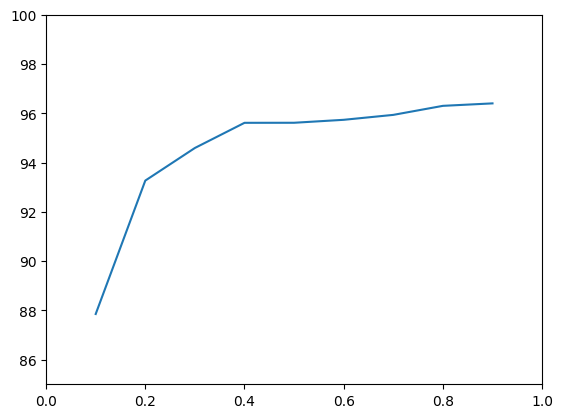

In [ ]:
#train_sizeによって精度はどう変わるか？
plt.plot(train_sizes, all_mean)
plt.ylim(85,100)
plt.xlim(0,1)

Text(0, 0.5, 'recognition rate[%]')

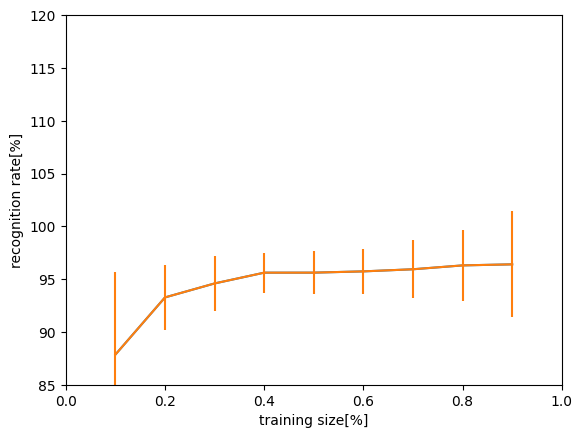

In [ ]:
# train_sizeによって精度はどう変わるか？
# また、標準偏差をエラーバーで表現するとどうなるか？
plt.plot(train_sizes, all_mean)
plt.ylim(85,120)
plt.xlim(0,1)
plt.errorbar(train_sizes, all_mean, yerr=all_std)
plt.xlabel("training size[%]")
plt.ylabel("recognition rate[%]")

# Section4：学習データとテストデータ準備

## 4-1 学習データとテストデータが同じ場合

In [ ]:
import numpy as np

In [ ]:
# Xの散布図にy:0,1のラベルをランダム生成
N = 500
X = np.random.uniform(low=0, high=1, size=[N,2])
y = np.random.choice([0,1], size=N)

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

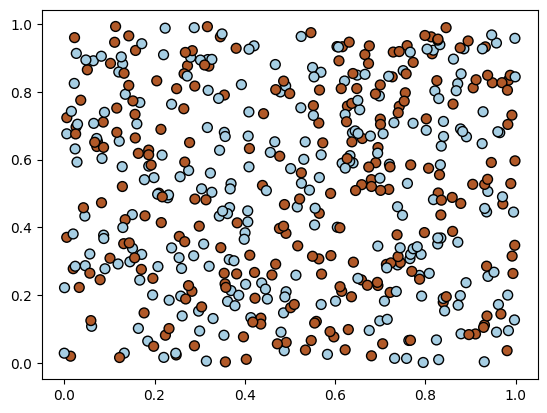

In [ ]:
# ランダムにできていることを確認
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap=plt.cm.Paired, edgecolors='k')

In [ ]:
# 学習データとテストデータを同じものを使うとどうなるか確認する
X_train = X
X_test = X

y_train = y
y_test = y

In [ ]:
from sklearn import neighbors

#K近傍法のインスタンス生成
clf = neighbors.KNeighborsClassifier(n_neighbors=1)

In [ ]:
clf.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=1)

In [ ]:
print(clf.score(X_train, y_train))
print(clf.score(X_test, y_test))

1.0
1.0


In [ ]:
# 再度再びランダムなデータを作成し、前に作ったモデルで精度が出るか確認する
X_test2 = np.random.uniform(low=0, high=1, size=[N,2])
y_test2 = np.random.choice([0,1], size=N)

In [ ]:
print(clf.score(X_test, y_test))
print(clf.score(X_test2, y_test2))

1.0
0.532


## 4-2 Hold-out

In [ ]:
# 癌のデータを使ってShuffleSplitのおさらい
# ライブラリインポート
import numpy as np

# データ準備
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()

# 説明変数・目的変数の定義
X = data.data
y = data.target

# ロジスティック回帰のインスタンス生成
from sklearn import linear_model
clf = linear_model.LogisticRegression(solver='liblinear')

# 学習データとテストデータの分割
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.5,
                  test_size=0.5)

In [ ]:
train_index , test_index = next(ss.split(X, y))

In [ ]:
train_index

array([164, 337, 223, 303,  23, 340, 311,  26, 382, 461, 245, 556, 274,
       152, 213,  30, 547, 441, 521, 326, 285, 503, 288,  22, 289,  75,
       240, 312, 411, 448, 366,  48, 293, 225, 210,  35,  96, 242, 496,
       239,  67,  95, 182, 527, 479,  72, 457, 232, 319, 543, 350,  36,
       123, 488, 144, 565,  78, 113, 163, 228, 156, 136,  24, 102, 502,
       282,  93, 451, 405,   1, 124, 517, 430, 154, 194,  85, 510, 369,
       192, 260, 226,  49, 432,   4, 115, 183,  99, 331, 551, 160, 284,
       261, 487, 119,  19, 439, 531, 428,  76, 135,  38, 323, 224, 298,
       534, 252, 134,  77, 563,  43, 147, 334, 349, 120, 440, 310, 302,
       367, 313, 388, 215, 178,  92, 407, 389, 515, 460, 355, 393,  58,
       558, 360, 233, 347, 564, 158, 345, 265, 169, 561, 489,  98, 539,
       276, 196, 181, 541, 519, 419,  45, 246, 429, 186, 111, 150,  64,
       363, 121, 172, 374, 256, 525, 511, 294, 206,  47, 189, 437, 244,
        52, 410, 544, 376,  63, 315,  84, 415, 471, 155, 392, 28

In [ ]:
test_index

array([157, 141, 344,  12,  91, 505, 306, 221, 198, 122, 394, 361, 275,
       127, 314, 438, 177,  83, 201, 456, 462, 236, 235, 418, 562, 414,
       103, 352, 320, 309,  14, 431, 423,  61, 491, 353, 384, 280, 112,
       399, 336, 129, 467,  62, 508, 422, 463, 330, 455, 227, 545, 128,
       264, 200, 494, 470, 528, 325, 332,   8, 322, 533, 292, 301, 485,
       507, 553,  32, 173,  27, 281, 425, 205, 554, 408, 165, 338, 299,
       277, 476, 116, 433, 412, 153, 472, 304, 333,  57, 447,  31, 385,
        56, 272,   2,  29, 229, 130,  44, 482, 268,  20, 442, 161, 259,
       474, 404, 209, 379, 140, 197, 109, 151,  51, 546,   7, 257, 114,
       459, 168, 262, 321, 287, 146, 317, 452, 118, 446, 204, 348, 138,
       542,  97, 207, 193, 522, 187,  79, 131, 497, 258, 390, 567, 358,
        54, 305, 137, 481,  80, 267,  25, 211, 271, 159,  37,  50, 406,
        68, 231, 490, 548,  39, 216,  17, 126, 538, 486, 465, 170, 234,
       397, 290,  87, 343, 364, 426,  70, 175, 552, 133, 149,   

In [ ]:
train_index.shape, test_index.shape

((284,), (285,))

In [ ]:
# モデル学習
clf.fit(X[train_index], y[train_index])

LogisticRegression(solver='liblinear')

In [ ]:
print(clf.score(X[train_index], y[train_index]))
print(clf.score(X[test_index], y[test_index]))

0.9612676056338029
0.9368421052631579


In [ ]:
# MNIST(有名な手書き文字データ)のデータを使って再度作成する

# from sklearn.datasets import fetch_mldata
from sklearn.datasets import fetch_openml

In [ ]:
# mnist = fetch_mldata('MNIST original')
mnist = fetch_openml('mnist_784', version=1)

/usr/local/lib/python3.10/dist-packages/sklearn/datasets/_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


In [ ]:
mnist.feature_names

['pixel1',
 'pixel2',
 'pixel3',
 'pixel4',
 'pixel5',
 'pixel6',
 'pixel7',
 'pixel8',
 'pixel9',
 'pixel10',
 'pixel11',
 'pixel12',
 'pixel13',
 'pixel14',
 'pixel15',
 'pixel16',
 'pixel17',
 'pixel18',
 'pixel19',
 'pixel20',
 'pixel21',
 'pixel22',
 'pixel23',
 'pixel24',
 'pixel25',
 'pixel26',
 'pixel27',
 'pixel28',
 'pixel29',
 'pixel30',
 'pixel31',
 'pixel32',
 'pixel33',
 'pixel34',
 'pixel35',
 'pixel36',
 'pixel37',
 'pixel38',
 'pixel39',
 'pixel40',
 'pixel41',
 'pixel42',
 'pixel43',
 'pixel44',
 'pixel45',
 'pixel46',
 'pixel47',
 'pixel48',
 'pixel49',
 'pixel50',
 'pixel51',
 'pixel52',
 'pixel53',
 'pixel54',
 'pixel55',
 'pixel56',
 'pixel57',
 'pixel58',
 'pixel59',
 'pixel60',
 'pixel61',
 'pixel62',
 'pixel63',
 'pixel64',
 'pixel65',
 'pixel66',
 'pixel67',
 'pixel68',
 'pixel69',
 'pixel70',
 'pixel71',
 'pixel72',
 'pixel73',
 'pixel74',
 'pixel75',
 'pixel76',
 'pixel77',
 'pixel78',
 'pixel79',
 'pixel80',
 'pixel81',
 'pixel82',
 'pixel83',
 'pixel84',
 

In [ ]:
mnist.DESCR

"**Author**: Yann LeCun, Corinna Cortes, Christopher J.C. Burges  \n**Source**: [MNIST Website](http://yann.lecun.com/exdb/mnist/) - Date unknown  \n**Please cite**:  \n\nThe MNIST database of handwritten digits with 784 features, raw data available at: http://yann.lecun.com/exdb/mnist/. It can be split in a training set of the first 60,000 examples, and a test set of 10,000 examples  \n\nIt is a subset of a larger set available from NIST. The digits have been size-normalized and centered in a fixed-size image. It is a good database for people who want to try learning techniques and pattern recognition methods on real-world data while spending minimal efforts on preprocessing and formatting. The original black and white (bilevel) images from NIST were size normalized to fit in a 20x20 pixel box while preserving their aspect ratio. The resulting images contain grey levels as a result of the anti-aliasing technique used by the normalization algorithm. the images were centered in a 28x28 

In [ ]:
mnist.data.shape

(70000, 784)

In [ ]:
mnist.target

0        5
1        0
2        4
3        1
4        9
        ..
69995    2
69996    3
69997    4
69998    5
69999    6
Name: class, Length: 70000, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [ ]:
# MNISTの場合、最初の60000が学習データで、10000がテスト、と決まっている

X_train = mnist.data[:60000]
X_test = mnist.data[60000:70000]

y_train = mnist.target[:60000]
y_test = mnist.target[:60000]

In [ ]:
# 学習データが60000もあると、クロスバリデーションが終わらないので色々工夫する必要がある

clf.fit(X_train, y_teran)  #多分1時間たっても終わらない （わざとスペルミスしている）

NameError: ignored

## 4-3 Hold-out_2 / stratified

In [ ]:
import numpy as np

from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()

X = data.data
y = data.target

from sklearn import linear_model
clf = linear_model.LogisticRegression(solver='liblinear')

from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.5,
                  test_size=0.5)

# trainとtestを分割：hold-out
train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
clf.fit(X_train, y_train)

In [ ]:
clf.score(X_test, y_test)

0.9543859649122807

In [ ]:
# たまたまランダムな分け方で良い結果が出ただけかもしれないので10回ぐらい繰り返す

ss = ShuffleSplit(n_splits=10,
                  train_size=0.5,
                  test_size=0.5)

for train_index, test_index in ss.split(X, y):

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    clf.fit(X_train, y_train)
    print(clf.score(X_test, y_test))

0.9368421052631579
0.9473684210526315
0.9578947368421052
0.9438596491228071
0.968421052631579
0.9438596491228071
0.9263157894736842
0.9578947368421052
0.9543859649122807
0.9333333333333333


In [ ]:
#学習データを95%、テストデータを5%にした場合、クラスバランスが悪くなる可能性がある

ss = ShuffleSplit(n_splits=1,
                  train_size=0.95,  # 学習データ95%
                  test_size=0.05,   # テストデータ5%
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
# 何もせずに既存のデータをシャッフルしてしまうとクラスのバランスが悪くなる
print(np.unique(y,       return_counts=True))                     # 目的変数yのデータ全体で0,1のデータが212:357の割合である
print(np.unique(y,       return_counts=True)[1] / y.size)         # 目的変数yのデータ全体で0,1のデータが37%:62%の割合である
print(np.unique(y_train, return_counts=True)[1] / y_train.size)   # y_trainのデータ全体で0,1のデータが38%:61%の割合である
print(np.unique(y_test,  return_counts=True)[1] / y_test.size)    # y_testのデータ全体で0,1のデータが31%:68%の割合である > 本来はtestも37%:62%の割合で合ってほしい

(array([0, 1]), array([212, 357]))
[0.37258348 0.62741652]
[0.37592593 0.62407407]
[0.31034483 0.68965517]


In [ ]:
np.unique(y_train)

array([0, 1])

In [ ]:
np.unique(y,return_counts=True)

(array([0, 1]), array([212, 357]))

In [ ]:
# y=0, 1の数の数え上げ
np.sum(y==0), np.sum(y==1)

(212, 357)

In [ ]:
y.size

569

In [ ]:
212/569

0.37258347978910367

In [ ]:
# そこで、Stratifiedシャッフルスプリットを使う

from sklearn.model_selection import StratifiedShuffleSplit

In [ ]:
ss = StratifiedShuffleSplit(n_splits=1,
                            train_size=0.95,
                            test_size=0.05,
                            random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
# 学習データとテストデータがほぼ同じ割合で0,1クラスの割合37:62で分けられた！
print(np.unique(y,       return_counts=True))                     # 目的変数yのデータ全体で0,1のデータが212:357の割合である
print(np.unique(y,       return_counts=True)[1] / y.size)         # 目的変数yのデータ全体で0,1のデータが37%:62%の割合である
print(np.unique(y_train, return_counts=True)[1] / y_train.size)   # y_trainのデータ全体で0,1のデータが37%:62%の割合である
print(np.unique(y_test,  return_counts=True)[1] / y_test.size)    # y_testのデータ全体で0,1のデータが37%:62%の割合である

(array([0, 1]), array([212, 357]))
[0.37258348 0.62741652]
[0.37222222 0.62777778]
[0.37931034 0.62068966]


## 4-4 cross-validation, stratified 10-fold CV

In [ ]:
import numpy as np

from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()

X = data.data
y = data.target

from sklearn import linear_model
clf = linear_model.LogisticRegression(solver='liblinear')

In [ ]:
# ここが違う！10-foldのデータを作る

from sklearn.model_selection import KFold

ss = KFold(n_splits=10, shuffle=True)

In [ ]:
for train_index, test_index in ss.split(X, y):

  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]

  clf.fit(X_train, y_train)
  print(clf.score(X_test, y_test))

0.9649122807017544
0.9824561403508771
0.9473684210526315
0.9298245614035088
0.9298245614035088
0.9473684210526315
0.9473684210526315
0.9649122807017544
0.9473684210526315
0.9285714285714286


In [ ]:
# 学習データとテストデータがほぼ同じ割合で0,1クラスの割合37:62で分けられた！
print(np.unique(y,       return_counts=True))                     # 目的変数yのデータ全体で0,1のデータが212:357の割合である
print(np.unique(y,       return_counts=True)[1] / y.size)         # 目的変数yのデータ全体で0,1のデータが37%:62%の割合である
print(np.unique(y_train, return_counts=True)[1] / y_train.size)   # y_trainのデータ全体で0,1のデータが37%:62%の割合である
print(np.unique(y_test,  return_counts=True)[1] / y_test.size)    # y_testのデータ全体で0,1のデータが37%:62%の割合である

(array([0, 1]), array([212, 357]))
[0.37258348 0.62741652]
[0.37426901 0.62573099]
[0.35714286 0.64285714]


In [ ]:
# 比率を保ったままcross-validationができているか確認する
# k-foldだけだと結構ばらつくのが分かる

for train_index, test_index in ss.split(X, y):

  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]

  print(np.unique(y_train, return_counts=True)[1] / y_train.size)
  print(np.unique(y_test,  return_counts=True)[1] / y_test.size)
  print('-----')

[0.375 0.625]
[0.35087719 0.64912281]
-----
[0.37304688 0.62695312]
[0.36842105 0.63157895]
-----
[0.36132812 0.63867188]
[0.47368421 0.52631579]
-----
[0.36132812 0.63867188]
[0.47368421 0.52631579]
-----
[0.36914062 0.63085938]
[0.40350877 0.59649123]
-----
[0.37695312 0.62304688]
[0.33333333 0.66666667]
-----
[0.36914062 0.63085938]
[0.40350877 0.59649123]
-----
[0.38867188 0.61132812]
[0.22807018 0.77192982]
-----
[0.37695312 0.62304688]
[0.33333333 0.66666667]
-----
[0.37426901 0.62573099]
[0.35714286 0.64285714]
-----


In [ ]:
# そのため、StratifiedKFoldをinportする必要がある

from sklearn.model_selection import StratifiedKFold
ss = StratifiedKFold(n_splits=10, shuffle=True)


In [ ]:
# 再度確認 → 学習もテストも無事に分けられた
for train_index, test_index in ss.split(X, y):

  X_train, X_test = X[train_index], X[test_index]
  y_train, y_test = y[train_index], y[test_index]

  print(np.unique(y_train, return_counts=True)[1] / y_train.size, y_train.size)
  print(np.unique(y_test,  return_counts=True)[1] / y_test.size, y_test.size)
  print(clf.score(X_test, y_test))
  print('-----')

[0.37109375 0.62890625] 512
[0.38596491 0.61403509] 57
0.9122807017543859
-----
[0.37109375 0.62890625] 512
[0.38596491 0.61403509] 57
0.9824561403508771
-----
[0.37304688 0.62695312] 512
[0.36842105 0.63157895] 57
0.9649122807017544
-----
[0.37304688 0.62695312] 512
[0.36842105 0.63157895] 57
0.9473684210526315
-----
[0.37304688 0.62695312] 512
[0.36842105 0.63157895] 57
0.9649122807017544
-----
[0.37304688 0.62695312] 512
[0.36842105 0.63157895] 57
0.8947368421052632
-----
[0.37304688 0.62695312] 512
[0.36842105 0.63157895] 57
0.9649122807017544
-----
[0.37304688 0.62695312] 512
[0.36842105 0.63157895] 57
0.9649122807017544
-----
[0.37304688 0.62695312] 512
[0.36842105 0.63157895] 57
0.9649122807017544
-----
[0.37231969 0.62768031] 513
[0.375 0.625] 56
0.9642857142857143
-----


In [ ]:
# サンプルサイズが綺麗に分けられたので、これら10-foldのスコアを平均すれば最適なスコアを求めることができる
# cross_val_scoreを使えば、k-foldでstratifiedしたデータセットのスコアを求めることができる
from sklearn.model_selection import cross_val_score
ave_score = cross_val_score(clf, X, y,
                            cv=10)     #StratifiedKFold（今、K=10）

In [ ]:
ave_score

array([0.94736842, 0.9122807 , 0.92982456, 0.94736842, 0.96491228,
       0.98245614, 0.94736842, 0.94736842, 0.96491228, 0.96428571])

In [ ]:
print(f'{ave_score.mean():4.2f} +/- {ave_score.std():4.2f}')

0.95 +/- 0.02


In [ ]:
print("{0:4.2f} +/- {1:4.2f} %".format(ave_score.mean() * 100, ave_score.std() * 100))

95.08 +/- 1.88 %


## 4-5 Leave-one-out(LOOCV)

In [ ]:
import numpy as np

from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()

X = data.data
y = data.target

from sklearn import linear_model
clf = linear_model.LogisticRegression(solver='liblinear')

### Leave-one-out

In [ ]:
# loocvのインスタンス生成
from sklearn.model_selection import LeaveOneOut
loocv = LeaveOneOut()

In [ ]:
train_index, test_index = next(loocv.split(X, y))

In [ ]:
# サイズを確認してみる
# 569個あったのが、568個の学習データと1個のテストデータに分けられる
y.size, train_index.size, test_index.size

(569, 568, 1)

In [ ]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, X, y, cv=loocv)  # LOOで分割したスコアを求める

In [ ]:
# 標準偏差が大きい
# Leave-one-outなのでかなりばらつきが多くなる
print("{0:4.2f} +/- {1:4.2f} %".format(scores.mean() * 100, scores.std() * 100))

95.25 +/- 21.26 %


### Leave-p-out

In [ ]:
# 1個ではなく、2つ抜き出す
from sklearn.model_selection import LeavePOut
loocv = LeavePOut(2)

In [ ]:
train_index, test_index = next(loocv.split(X, y))

In [ ]:
# サイズを確認してみる
# 569個あったのが、568個の学習データと1個のテストデータに分けられる
y.size, train_index.size, test_index.size

(569, 567, 2)

In [ ]:
# 2個ずつ取るやり方は終わらない！！！
# なぜなら一つの集合から2個取って、総当たりでのパターンが無数に存在してしまうため
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, X, y, cv=loocv)  # LOOで分割したスコアを求める

KeyboardInterrupt: ignored

### Leave-one-group-out

In [ ]:
# 0~49までの値を12個作成
group = np.array(list(range(50))*12)
#group = np.sort(group[:y.size])

In [ ]:
group

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,  0,
        1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,  0,  1,
        2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,  0,  1,  2,
        3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49,  0,  1,  2,  3,
        4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
       21, 22, 23, 24, 25

In [ ]:
# 並び替え
group = np.sort(group[:y.size])

In [ ]:
group

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  2,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  3,  4,  4,  4,
        4,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  7,
        7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,  9,
        9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11,
       11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12,
       12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14,
       14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15,
       15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16,
       17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18,
       18, 18, 18, 18, 18

In [ ]:
group = np.array(list(range(50))*12)
group = np.sort(group[:y.size])
group.size

569

In [ ]:
from sklearn.model_selection import LeaveOneGroupOut
loocv = LeaveOneGroupOut()

# 50個のグループを繰り返す
for train_index, test_index in loocv.split(X, y, group):

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    clf.fit(X_train, y_train)
    print(clf.score(X_test, y_test))

0.9166666666666666
0.9166666666666666
1.0
0.5833333333333334
1.0
1.0
0.9166666666666666
0.75
1.0
1.0
1.0
0.9166666666666666
0.9166666666666666
0.9166666666666666
1.0
1.0
0.9166666666666666
0.9166666666666666
1.0
0.9090909090909091
1.0
0.9090909090909091
1.0
1.0
0.9090909090909091
0.9090909090909091
1.0
1.0
1.0
0.9090909090909091
1.0
1.0
1.0
0.9090909090909091
1.0
0.9090909090909091
1.0
1.0
1.0
0.9090909090909091
0.9090909090909091
0.9090909090909091
0.9090909090909091
1.0
1.0
1.0
1.0
0.8181818181818182
1.0
1.0


In [ ]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf, X, y,
                         groups=group,
                         cv=loocv)  # LeaveOneGroupOut

In [ ]:
print("{0:4.2f} +/- {1:4.2f} %  /  {2}".format(scores.mean() * 100, scores.std() * 100, scores.size))

94.97 +/- 7.60 %  /  50


In [ ]:
print("{0:4.2f} +/- {1:4.2f} %".format(scores.mean() * 100, scores.std() * 100))

50

## 4-6 学習・検証・テストデータ分割

In [ ]:
import numpy as np

from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()

X = data.data
y = data.target

from sklearn import linear_model
clf = linear_model.LogisticRegression(solver='liblinear')

In [ ]:
# 学習データ8割、テストデータ2割に分けた後、学習データを学習/検証データに分けていく
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
 # 以前まではX, yを単純に学習とテストに分けていた
 # 今回は学習データ(X_train, y_trainをcross-validationする)
from sklearn.model_selection import cross_val_score

scores = cross_val_score(clf,
                         X_train, y_train, #ここが違う
                         cv=10)

In [ ]:
scores.mean()

0.9473429951690822

In [ ]:
# ロジスティック回帰の学習モデルのハイパーパラメータを変えて学習モデルの中で最適なモデルを見つける
# C_rangeは1^-15～1^+20のリスト

C_range_exp = np.linspace(start=-15, stop=20, num=36)
C_range = 10 ** C_range_exp
print(C_range)

[1.e-15 1.e-14 1.e-13 1.e-12 1.e-11 1.e-10 1.e-09 1.e-08 1.e-07 1.e-06
 1.e-05 1.e-04 1.e-03 1.e-02 1.e-01 1.e+00 1.e+01 1.e+02 1.e+03 1.e+04
 1.e+05 1.e+06 1.e+07 1.e+08 1.e+09 1.e+10 1.e+11 1.e+12 1.e+13 1.e+14
 1.e+15 1.e+16 1.e+17 1.e+18 1.e+19 1.e+20]


In [ ]:
# C_range_expは-15～20のアレイ
C_range_exp

array([-15., -14., -13., -12., -11., -10.,  -9.,  -8.,  -7.,  -6.,  -5.,
        -4.,  -3.,  -2.,  -1.,   0.,   1.,   2.,   3.,   4.,   5.,   6.,
         7.,   8.,   9.,  10.,  11.,  12.,  13.,  14.,  15.,  16.,  17.,
        18.,  19.,  20.])

In [ ]:
all_scores_mean = []
all_scores_std = []

for C in C_range:
  clf.C = C
  scores = cross_val_score(clf,
                          X_train, y_train,
                          cv=10) #StratifirdKFold

  all_scores_mean.append(scores.mean())
  all_scores_std.append(scores.std())

In [ ]:
all_scores_mean

[0.36256038647343,
 0.36256038647343,
 0.36256038647343,
 0.36256038647343,
 0.36256038647343,
 0.36256038647343,
 0.36256038647343,
 0.36256038647343,
 0.36256038647343,
 0.9011594202898552,
 0.9121739130434783,
 0.9165700483091788,
 0.9143478260869564,
 0.9298067632850241,
 0.9408695652173913,
 0.9473429951690822,
 0.9560869565217391,
 0.9560869565217391,
 0.9582608695652175,
 0.9496135265700483,
 0.956135265700483,
 0.9582608695652175,
 0.9560869565217391,
 0.9560869565217391,
 0.9627053140096619,
 0.9627053140096619,
 0.9538647342995169,
 0.9604830917874396,
 0.9583574879227053,
 0.9582608695652175,
 0.9560869565217391,
 0.9604830917874396,
 0.9538647342995169,
 0.9538647342995169,
 0.9560869565217391,
 0.9604830917874396]

In [ ]:
all_scores_std

[0.007004830917874377,
 0.007004830917874377,
 0.007004830917874377,
 0.007004830917874377,
 0.007004830917874377,
 0.007004830917874377,
 0.007004830917874377,
 0.007004830917874377,
 0.007004830917874377,
 0.04643524901207403,
 0.03933435266634337,
 0.028942842997026826,
 0.04103383462494864,
 0.030493042925833234,
 0.040008167384801036,
 0.032475843164942814,
 0.029206444604753915,
 0.029206444604753915,
 0.029957300394131733,
 0.029164543686051377,
 0.02750214009608842,
 0.028335876349464596,
 0.025767818876000402,
 0.027617855125355553,
 0.030861058908304147,
 0.02928970806494528,
 0.024739063928208134,
 0.02890229601806528,
 0.028253064697060872,
 0.029957300394131733,
 0.025767818876000402,
 0.02890229601806528,
 0.024739063928208134,
 0.024739063928208134,
 0.025767818876000402,
 0.03049361693089179]

In [ ]:
all_scores_mean = np.array(all_scores_mean)
all_scores_mean = np.array(all_scores_mean)

In [ ]:
all_scores_mean

array([0.36256039, 0.36256039, 0.36256039, 0.36256039, 0.36256039,
       0.36256039, 0.36256039, 0.36256039, 0.36256039, 0.90115942,
       0.91217391, 0.91657005, 0.91434783, 0.92980676, 0.94086957,
       0.947343  , 0.95608696, 0.95608696, 0.95826087, 0.94961353,
       0.95613527, 0.95826087, 0.95608696, 0.95608696, 0.96270531,
       0.96270531, 0.95386473, 0.96048309, 0.95835749, 0.95826087,
       0.95608696, 0.96048309, 0.95386473, 0.95386473, 0.95608696,
       0.96048309])

Text(0.5, 1.0, 'Accuracy for different values of C')

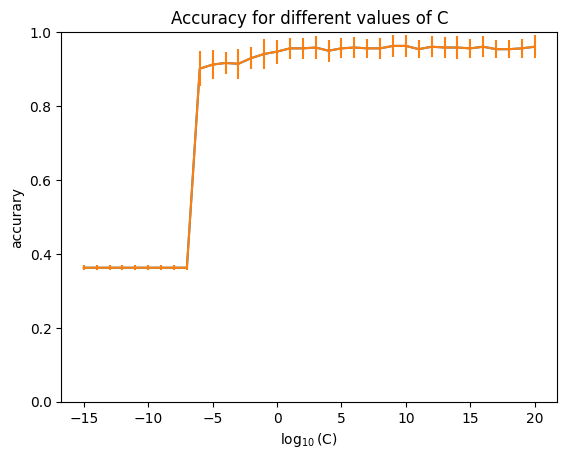

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(C_range_exp, all_scores_mean)

plt.errorbar(C_range_exp,
             all_scores_mean,
             yerr=all_scores_std)

plt.ylim(0,1)
plt.ylabel('accurary')
plt.xlabel('$\log_{10}$(C)')
plt.title('Accuracy for different values of C')

In [ ]:
# 精度の最大値
all_scores_mean.max()

0.9627053140096619

In [ ]:
# 精度の最大値を取るC
max_index = np.argmax(all_scores_mean)

In [ ]:
# ハイパーパラメータCは9と決定
C_range_exp[max_index]

9.0

In [ ]:
# 最適なハイパーパラメータで再度モデル学習
clf.C = 10 ** C_range_exp[max_index]

In [ ]:
clf.fit(X_train, y_train)

LogisticRegression(C=1000000000.0, solver='liblinear')

In [ ]:
# Cross-Validationでハイパーパラメータを最適化したモデルのテストデータのスコア
# テストデータはハイパーパラメータの最適化には使わないことを覚える！
clf.score(X_test, y_test)

0.9736842105263158

In [ ]:
# ハイパーパラメータを最適化しない場合どうなるか？
# 精度94%なのでまあまあ良くなった
clf = linear_model.LogisticRegression()
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9473684210526315

# データから特徴量

## 5-1 データクリーニング

In [ ]:
import numpy as np

In [ ]:
# csvファイルの表示

#!cat 2D_example_dame.csv

with open('2D_example_dame.csv') as f:
    print(f.read())

1,-7.428476,1.509903
0,2.980693,1.960821
0,3.988255,4.636389
1,-5.789437,-4.621614
1,-4.894447,-326.9730
1,-1.933949,-0.047276
0,-1.611771,5.932201
1,-6.670152,-1.036282
1,-293.1415,-0.104475
0,-0.074762,1.070002
1,-2.691793,4.168774
0,0.461182,3.453438
0,-1.354135,3.751657
1,-6.229476,-1.209434
0,2.778594,NaN
1,-5.719578,-0.243509
0,0.928322,3.208520
0,0.850475,2.908955
1,NaN,-1.831199
0,1.116025,3.353602



In [ ]:
data = np.loadtxt('2D_example_dame.csv', delimiter=',')

In [ ]:
y = data[:,0].astype(int) #1列目をyラベルに変換

In [ ]:
y

array([1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0])

In [ ]:
X = data[:, 1:3]

In [ ]:
# 説明変数に欠損値があるので、処理する必要がある
X

array([[-7.428476e+00,  1.509903e+00],
       [ 2.980693e+00,  1.960821e+00],
       [ 3.988255e+00,  4.636389e+00],
       [-5.789437e+00, -4.621614e+00],
       [-4.894447e+00, -3.269730e+02],
       [-1.933949e+00, -4.727600e-02],
       [-1.611771e+00,  5.932201e+00],
       [-6.670152e+00, -1.036282e+00],
       [-2.931415e+02, -1.044750e-01],
       [-7.476200e-02,  1.070002e+00],
       [-2.691793e+00,  4.168774e+00],
       [ 4.611820e-01,  3.453438e+00],
       [-1.354135e+00,  3.751657e+00],
       [-6.229476e+00, -1.209434e+00],
       [ 2.778594e+00,           nan],
       [-5.719578e+00, -2.435090e-01],
       [ 9.283220e-01,  3.208520e+00],
       [ 8.504750e-01,  2.908955e+00],
       [          nan, -1.831199e+00],
       [ 1.116025e+00,  3.353602e+00]])

In [ ]:
X[:, 0]

array([-7.428476e+00,  2.980693e+00,  3.988255e+00, -5.789437e+00,
       -4.894447e+00, -1.933949e+00, -1.611771e+00, -6.670152e+00,
       -2.931415e+02, -7.476200e-02, -2.691793e+00,  4.611820e-01,
       -1.354135e+00, -6.229476e+00,  2.778594e+00, -5.719578e+00,
        9.283220e-01,  8.504750e-01,           nan,  1.116025e+00])

In [ ]:
X[:, 1]

array([ 1.509903e+00,  1.960821e+00,  4.636389e+00, -4.621614e+00,
       -3.269730e+02, -4.727600e-02,  5.932201e+00, -1.036282e+00,
       -1.044750e-01,  1.070002e+00,  4.168774e+00,  3.453438e+00,
        3.751657e+00, -1.209434e+00,           nan, -2.435090e-01,
        3.208520e+00,  2.908955e+00, -1.831199e+00,  3.353602e+00])

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.set_cmap(plt.cm.Paired) #色設定

<Figure size 640x480 with 0 Axes>

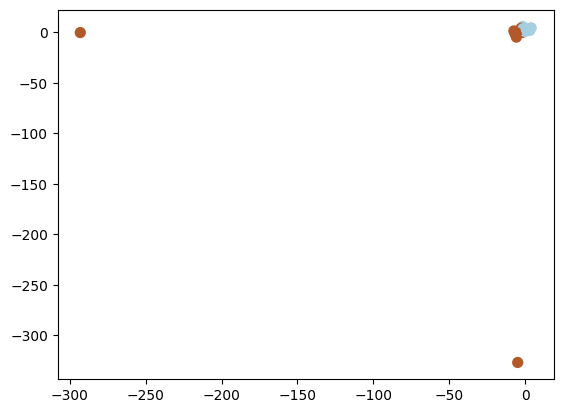

In [ ]:
# 外れ値があることが分かった
plt.scatter(X[:, 0], X[:, 1], c=y, s=50)

(-10.0, 10.0)

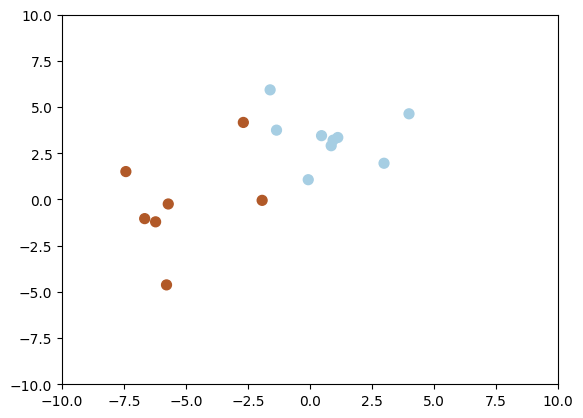

In [ ]:
# 外れ値があることが分かったので、可視化する際はこうするべき
plt.scatter(X[:, 0], X[:, 1], c=y, s=50)
plt.xlim(-10, 10)
plt.ylim(-10, 10)

In [ ]:
# 対策の例：NaNの外れ値を除去する

np.isnan(X)

array([[False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False, False],
       [False,  True],
       [False, False],
       [False, False],
       [False, False],
       [ True, False],
       [False, False]])

In [ ]:
~np.isnan(X[:, 0])

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True])

In [ ]:
~np.isnan(X[:, 1])

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False,  True,  True,  True,
        True,  True])

In [ ]:
# 欠損値がないX1,y1を新たに作る
X1 = X[~np.isnan(X[:, 0]) & ~np.isnan(X[:, 1])]
y1 = y[~np.isnan(X[:, 0]) & ~np.isnan(X[:, 1])]

In [ ]:
X.shape, X1.shape, y.shape, y1.shape

((20, 2), (18, 2), (20,), (18,))

In [ ]:
# 外れ値対策
abs(X1[:, 0]) < 10

array([ True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True,  True,  True,  True,  True,  True,  True,  True])

In [ ]:
abs(X1[:, 1]) < 10

array([ True,  True,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True])

In [ ]:
# 外れ値を除去する
X2 = X1[(abs(X1[:, 0]) < 10) & (abs(X1[:, 1]) < 10)]
y2 = y1[(abs(X1[:, 0]) < 10) & (abs(X1[:, 1]) < 10)]

In [ ]:
X1.shape, X2.shape, y1.shape, y2.shape

((18, 2), (16, 2), (18,), (16,))

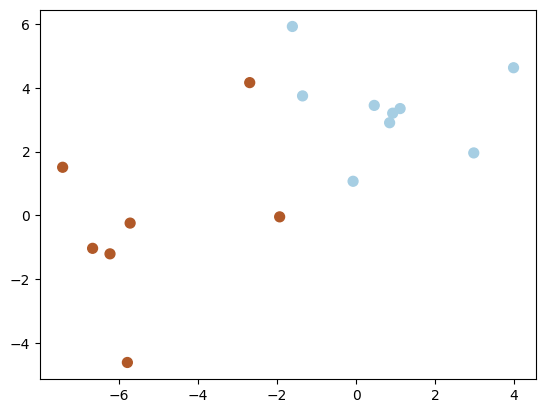

In [ ]:
# 外れ値も欠損値もなくなっている
plt.scatter(X2[:, 0], X2[:, 1], c=y2, s=50)

In [ ]:
# 対策の例：NaNを埋める（今回は平均値で埋める方法を紹介）
# Imputerを使う

In [ ]:
from sklearn.impute import SimpleImputer as Imputer

In [ ]:
misssing_value_to_mean = Imputer()

In [ ]:
missing_value_to_mean.fit(X)

NameError: ignored

In [ ]:
# Xはまだ変わっていない
X

In [ ]:
# 変えるためには
X_new = misssing_value_to_mean.transform(X)
X_new

array([[-7.42847600e+00,  1.50990300e+00],
       [ 2.98069300e+00,  1.96082100e+00],
       [ 3.98825500e+00,  4.63638900e+00],
       [-5.78943700e+00, -4.62161400e+00],
       [-4.89444700e+00, -3.26973000e+02],
       [-1.93394900e+00, -4.72760000e-02],
       [-1.61177100e+00,  5.93220100e+00],
       [-6.67015200e+00, -1.03628200e+00],
       [-2.93141500e+02, -1.04475000e-01],
       [-7.47620000e-02,  1.07000200e+00],
       [-2.69179300e+00,  4.16877400e+00],
       [ 4.61182000e-01,  3.45343800e+00],
       [-1.35413500e+00,  3.75165700e+00],
       [-6.22947600e+00, -1.20943400e+00],
       [ 2.77859400e+00, -1.57953962e+01],
       [-5.71957800e+00, -2.43509000e-01],
       [ 9.28322000e-01,  3.20852000e+00],
       [ 8.50475000e-01,  2.90895500e+00],
       [-1.70755753e+01, -1.83119900e+00],
       [ 1.11602500e+00,  3.35360200e+00]])

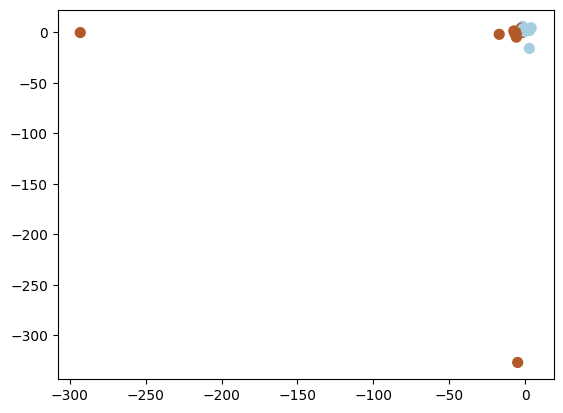

In [ ]:
# 外れ値がある場合、平均で埋めるとよりおかしくなるので注意が必要
plt.scatter(X_new[:, 0], X_new[:, 1], c=y, s=50)

In [ ]:
# 外れ値があるときの欠損値補完は、
# 1. 先に外れ値を除去しておく か
# 2. median で埋めるなどの対策が必要

In [ ]:
missing_value_to_median = Imputer(strategy='median')
missing_value_to_median.fit(X)
X_new2 = missing_value_to_median.transform(X)
X_new2

array([[-7.428476e+00,  1.509903e+00],
       [ 2.980693e+00,  1.960821e+00],
       [ 3.988255e+00,  4.636389e+00],
       [-5.789437e+00, -4.621614e+00],
       [-4.894447e+00, -3.269730e+02],
       [-1.933949e+00, -4.727600e-02],
       [-1.611771e+00,  5.932201e+00],
       [-6.670152e+00, -1.036282e+00],
       [-2.931415e+02, -1.044750e-01],
       [-7.476200e-02,  1.070002e+00],
       [-2.691793e+00,  4.168774e+00],
       [ 4.611820e-01,  3.453438e+00],
       [-1.354135e+00,  3.751657e+00],
       [-6.229476e+00, -1.209434e+00],
       [ 2.778594e+00,  1.509903e+00],
       [-5.719578e+00, -2.435090e-01],
       [ 9.283220e-01,  3.208520e+00],
       [ 8.504750e-01,  2.908955e+00],
       [-1.611771e+00, -1.831199e+00],
       [ 1.116025e+00,  3.353602e+00]])

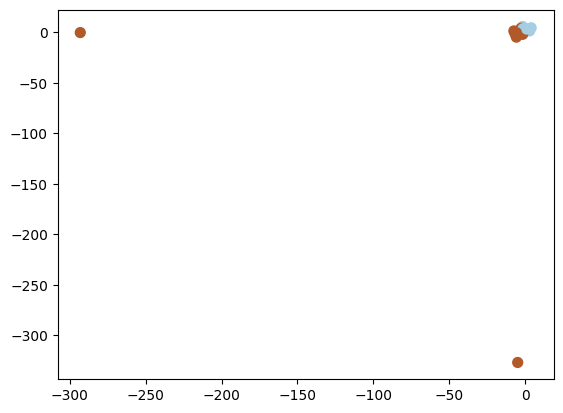

In [ ]:
# 外れ値がある場合、平均で埋めるとよりおかしくなるので注意が必要
plt.scatter(X_new2[:, 0], X_new2[:, 1], c=y, s=50)

## 5-2 特徴抽出：テキストデータ

In [ ]:
import urllib.request
# データのダウンロード
urllib.request.urlretrieve("http://www.gutenberg.org/files/11/11-0.txt", "allice.txt")

('allice.txt', <http.client.HTTPMessage at 0x7937d7b910f0>)

In [ ]:
with open('allice.txt', 'r', encoding='UTF-8') as f:
    print(f.read()[710:10000])   #710文字目～1400文字目まで見る

coding: UTF-8

Produced by: Arthur DiBianca and David Widger

*** START OF THE PROJECT GUTENBERG EBOOK ALICE’S ADVENTURES IN WONDERLAND ***

[Illustration]




Alice’s Adventures in Wonderland

by Lewis Carroll

THE MILLENNIUM FULCRUM EDITION 3.0

Contents

 CHAPTER I.     Down the Rabbit-Hole
 CHAPTER II.    The Pool of Tears
 CHAPTER III.   A Caucus-Race and a Long Tale
 CHAPTER IV.    The Rabbit Sends in a Little Bill
 CHAPTER V.     Advice from a Caterpillar
 CHAPTER VI.    Pig and Pepper
 CHAPTER VII.   A Mad Tea-Party
 CHAPTER VIII.  The Queen’s Croquet-Ground
 CHAPTER IX.    The Mock Turtle’s Story
 CHAPTER X.     The Lobster Quadrille
 CHAPTER XI.    Who Stole the Tarts?
 CHAPTER XII.   Alice’s Evidence




CHAPTER I.
Down the Rabbit-Hole


Alice was beginning to get very tired of sitting by her sister on the
bank, and of having nothing to do: once or twice she had peeped into
the book her sister was reading, but it had no pictures or
conversations in it, “and what is the use o

In [ ]:
# テキストをベクトル化する手法
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
txt_vec = CountVectorizer(input='filename')

In [ ]:
txt_vec.fit(['allice.txt'])

CountVectorizer(input='filename')

In [ ]:
# 100番目から120番目の単語のカウントでベクトル化する
txt_vec.get_feature_names_out()[100:120]

array(['_two_', '_un_important', '_very_', '_was_', '_we', '_what',
       '_what_', '_whatever', '_will_', '_with', '_would_', '_yet_',
       '_you', '_you_', '_your_', '_yours_', 'abide', 'able', 'about',
       'above'], dtype=object)

In [ ]:
# このテキストは3122個の言語で表現できるようになる
len(txt_vec.get_feature_names_out())

3122

In [ ]:
allice_vec = txt_vec.transform(['allice.txt'])

In [ ]:
allice_vec

<1x3122 sparse matrix of type '<class 'numpy.int64'>'
	with 3122 stored elements in Compressed Sparse Row format>

In [ ]:
allice_vec.shape

(1, 3122)

In [ ]:
allice_vec = allice_vec.toarray()

In [ ]:
allice_vec[0, 100:120]

array([  1,   2,  14,   5,   1,   4,   3,   1,   3,   1,   5,   1,   5,
         9,   7,   1,   2,   1, 102,   3])

In [ ]:
# テキストが単語の言語で表現できる
for word,count in zip(txt_vec.get_feature_names_out()[100:120], allice_vec[0, 100:120]):
    print(word, count)

_two_ 1
_un_important 2
_very_ 14
_was_ 5
_we 1
_what 4
_what_ 3
_whatever 1
_will_ 3
_with 1
_would_ 5
_yet_ 1
_you 5
_you_ 9
_your_ 7
_yours_ 1
abide 2
able 1
about 102
above 3


## 5-2 特徴抽出：画像データ

In [ ]:
from sklearn.datasets import load_sample_image

In [ ]:
# 中国っぽいサンプルを呼び出してchinaという変数に入れる
china = load_sample_image('china.jpg')

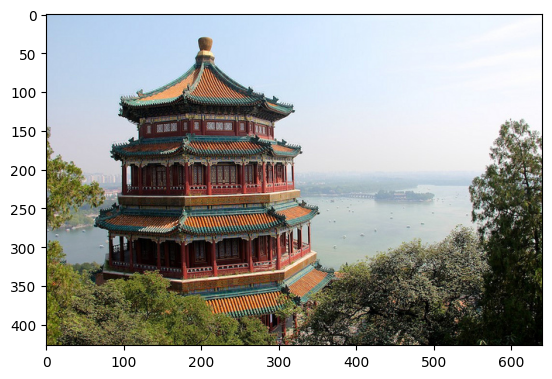

In [ ]:
# 画像を見てみる
import matplotlib.pyplot as plt
%matplotlib inline

plt.imshow(china);

In [ ]:
china.shape

(427, 640, 3)

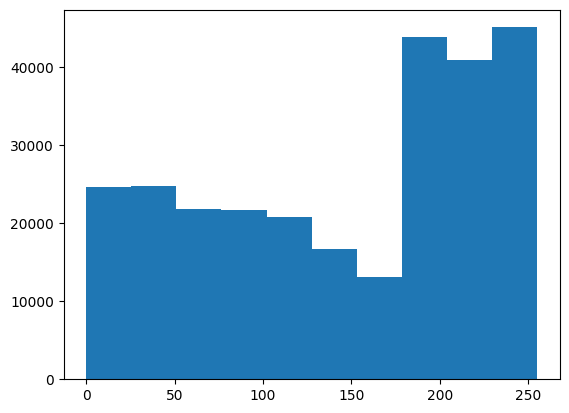

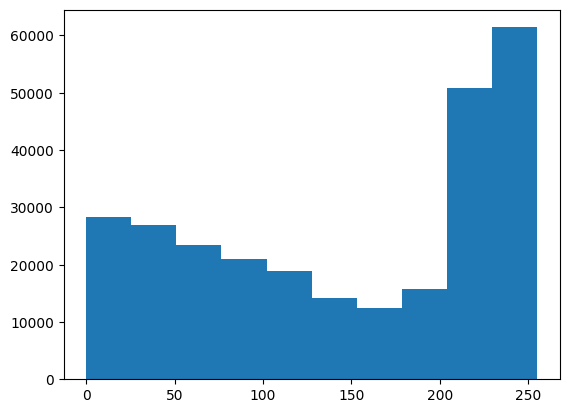

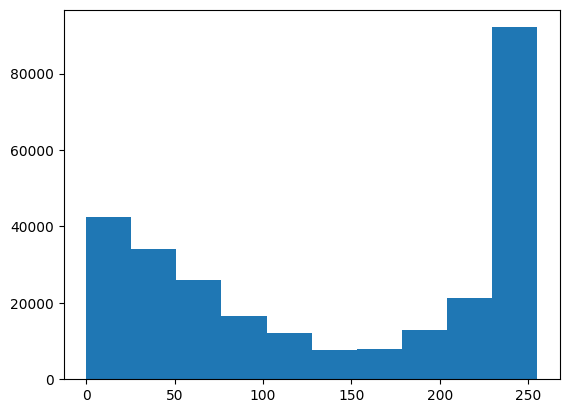

In [ ]:
# 画像のRGBのピクセルのヒストグラムを作る
histR = plt.hist(china[:,:,0].ravel(), bins=10)
plt.show()
histG = plt.hist(china[:,:,1].ravel(), bins=10)
plt.show()
histB = plt.hist(china[:,:,2].ravel(), bins=10)
plt.show()

In [ ]:
# RGBのヒストグラムをつなげるヒストグラムを作る
import numpy as np
histRGBcat = np.hstack((histR[0], histG[0], histB[0]))

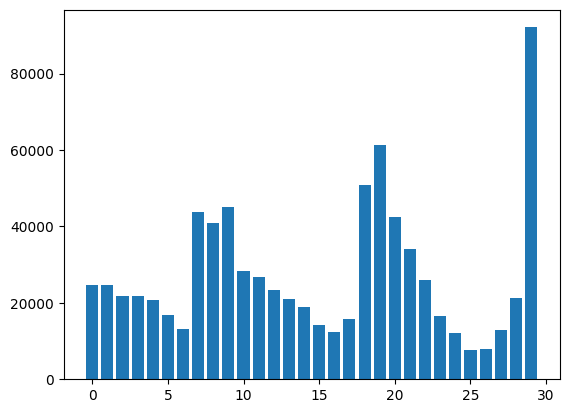

In [ ]:
# これが画像を表すベクトルとなる（10個に分けたヒストグラムを3つつなげるので30行のベクトルとなる）
plt.bar(range(len(histRGBcat)), histRGBcat);

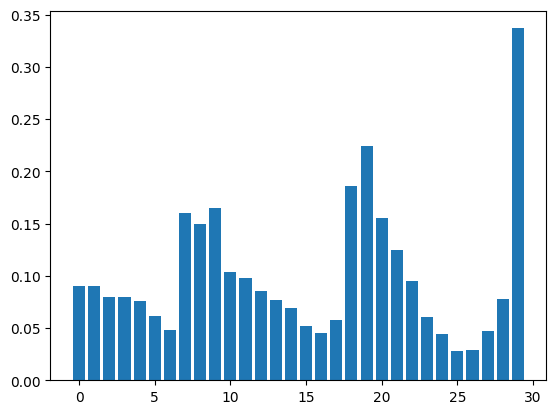

In [ ]:
# 上のヒストグラムを確率密度(全体を足して1になるようにする)にする
histRGBcat_l1 = histRGBcat / (china.shape[0]*china.shape[1])
plt.bar(range(len(histRGBcat_l1)), histRGBcat_l1);

## 5-3 特徴選択

In [ ]:
# 癌のデータで特徴選択を実施
import numpy as np

from sklearn.datasets import load_breast_cancer

data = load_breast_cancer()

X = data.data
y = data.target

In [ ]:

from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
# 下記の特徴量がある中で必要なものはどれか、選ぶ必要がある
data.feature_names

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [ ]:
# sklearnにあるモジュールを使って特徴選択をする
# chi2はカイ2乗基準
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

In [ ]:
# カイ2乗基準で必要な特徴量を20個選ぶ
skb = SelectKBest(chi2, k=20)

In [ ]:
skb.fit(X_train, y_train)

SelectKBest(k=20, score_func=<function chi2 at 0x7e8474ae64d0>)

In [ ]:
X_train_new = skb.transform(X_train)

In [ ]:
X_train.shape, X_train_new.shape

((455, 30), (455, 20))

In [ ]:
# どの20個が選択されたのか？
skb.get_support()

array([ True,  True,  True,  True, False,  True,  True,  True, False,
       False,  True, False,  True,  True, False,  True,  True, False,
       False, False,  True,  True,  True,  True, False,  True,  True,
        True,  True, False])

In [ ]:
# 使われた20個の特徴量
data.feature_names[skb.get_support()]

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean compactness', 'mean concavity', 'mean concave points',
       'radius error', 'perimeter error', 'area error',
       'compactness error', 'concavity error', 'worst radius',
       'worst texture', 'worst perimeter', 'worst area',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry'], dtype='<U23')

In [ ]:
# 使われなかった特徴量
data.feature_names[~skb.get_support()]

array(['mean smoothness', 'mean symmetry', 'mean fractal dimension',
       'texture error', 'smoothness error', 'concave points error',
       'symmetry error', 'fractal dimension error', 'worst smoothness',
       'worst fractal dimension'], dtype='<U23')

In [ ]:
# では、特徴量を何個にすれば最適な精度が出せるのか？
# for文で回して、最適な個数を求める

# 識別器作成
from sklearn import linear_model
clf = linear_model.LogisticRegression()

In [ ]:
from sklearn.model_selection import StratifiedKFold

k_range = np.arange(1, 31)
scores = []
std = []

for k in k_range:

    ss = StratifiedKFold(n_splits=10,
                         shuffle=True,
                         random_state=2)
    score = []

    # 学習データを学習/検証(val)データに分ける
    for train_index, val_index in ss.split(X_train,
                                           y_train):

        X_train2, X_val = X[train_index], X[val_index]
        y_train2, y_val = y[train_index], y[val_index]

        # カイ2乗基準で必要な特徴量をk個選ぶ（ここでfor文で繰りかえす）
        skb = SelectKBest(chi2, k=k)
        skb.fit(X_train2, y_train2)

        # k個に分けたデータ
        X_new_train2 = skb.transform(X_train2)
        X_new_val    = skb.transform(X_val)

        clf.fit(X_new_train2, y_train2)
        score.append( clf.score(X_new_val, y_val) )

    scores.append( np.array(score).mean() )
    std.append( np.array(score).std() )

scores = np.array(scores)

In [ ]:
scores

array([0.90971014, 0.93164251, 0.92951691, 0.94072464, 0.94067633,
       0.93835749, 0.94719807, 0.94497585, 0.9515942 , 0.9494686 ,
       0.9515942 , 0.9494686 , 0.95164251, 0.95391304, 0.9494686 ,
       0.95386473, 0.95164251, 0.96043478, 0.95381643, 0.95603865,
       0.95599034, 0.95821256, 0.95164251, 0.94937198, 0.95386473,
       0.95386473, 0.95603865, 0.95821256, 0.94942029, 0.95164251])

Text(0, 0.5, 'accuracy')

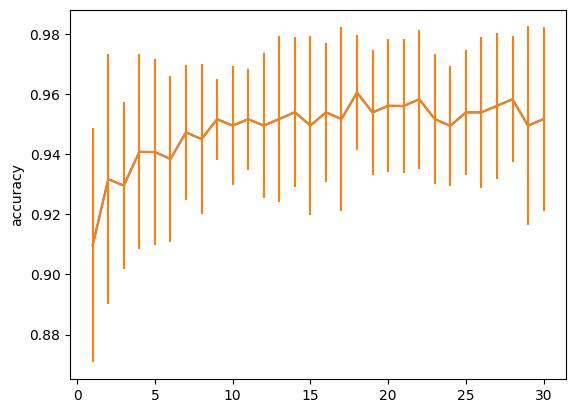

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(k_range, scores)
plt.errorbar(k_range, scores, yerr=std)
plt.ylabel("accuracy")

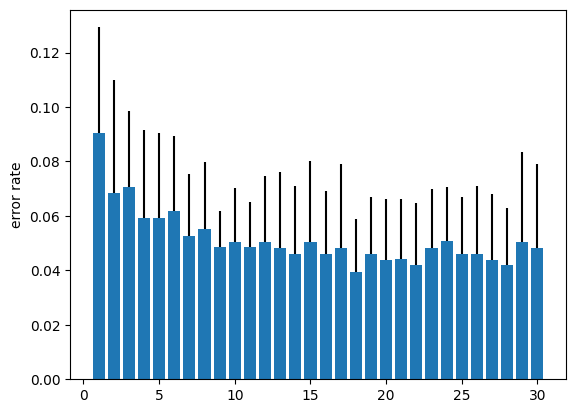

In [ ]:
# 1からscoreを引いて、0に近ければ近いほど良いとするパターンもある

# stdをNumPyの配列に変換
std_array = np.array(std)

# plt.barを使ってプロット
plt.bar(k_range, 1-scores, yerr=[np.zeros(std_array.shape), std_array])
plt.ylabel("error rate")
plt.show()

In [ ]:
# 最適なkは何個か？

best_k = k_range[np.argmax(scores)]
best_k

18

In [ ]:
# kを18にしてもう一度実施
skb = SelectKBest(chi2, k=18)

In [ ]:
skb.fit(X_train, y_train)

SelectKBest(k=18, score_func=<function chi2 at 0x7e8474ae64d0>)

In [ ]:
X_train_best = skb.transform(X_train)
X_test_best = skb.transform(X_test)

In [ ]:
clf.fit(X_train_best, y_train)

LogisticRegression()

In [ ]:
clf.score(X_test_best, y_test)

0.956140350877193

In [ ]:
# 特徴選択をしない場合(特徴量38個)はどうなるのか？

In [ ]:
clf.fit(X_train, y_train)

LogisticRegression()

In [ ]:
clf.score(X_test, y_test)

0.9473684210526315

In [ ]:
# 結果として38個の時95%、18個の時96%なので微々たる差になった
# なので、精度的には特徴選択しても意味がないということになる
# 精度的には意味がないが、18個に特徴量を減らしても同等の精度が出せるので、
# 計算メモリコストの削減など少ない性能で同等の性能が出せたのでメリットがある

## 5-4 特徴変換：PCA

In [ ]:
import numpy as np

from sklearn.datasets import load_breast_cancer

data = load_breast_cancer()

In [ ]:
# 精度を上げる方法として、必要な情報量を絞るか、複数のデータを使って別の特徴量を作るかが考えられる
# 後者が特徴変換
data.feature_names

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [ ]:
# 特徴変換をやる前にまずはデータを覗いてみる
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
import pandas as pd
from pandas.plotting import scatter_matrix

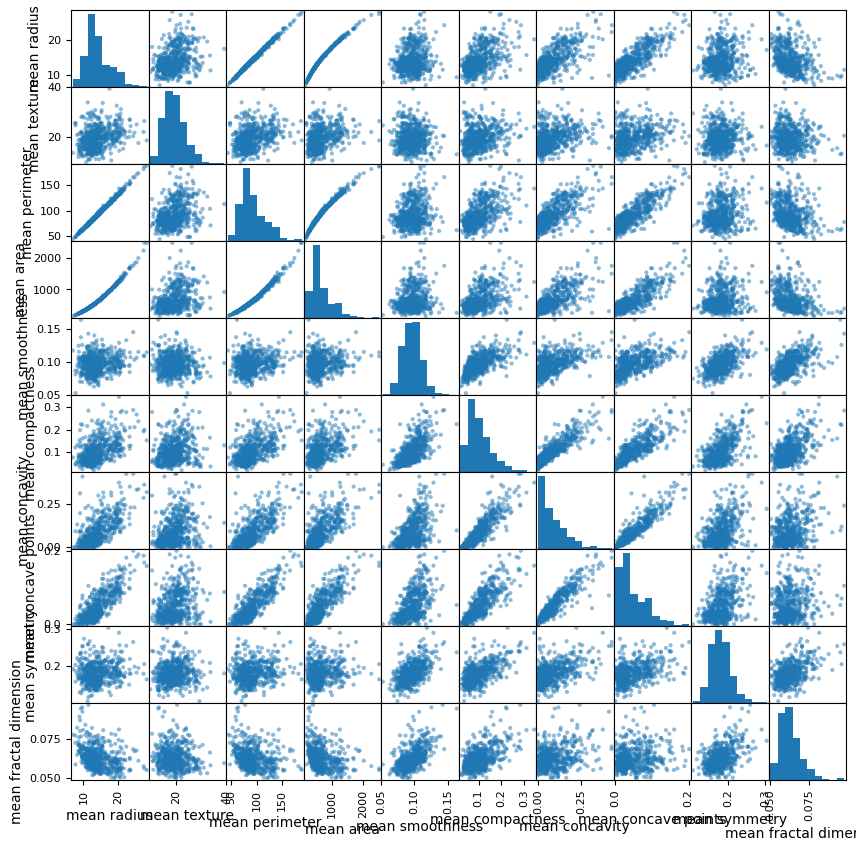

In [ ]:
df = pd.DataFrame(data.data[:, 0:10], columns=data.feature_names[0:10])  # 最初の10列がどうなっているか？
scatter_matrix(df, figsize=(10,10));

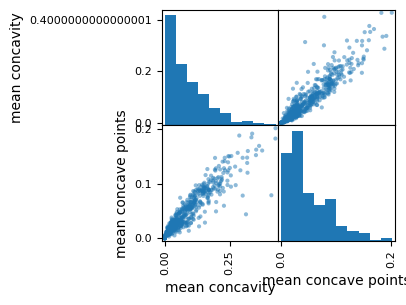

In [ ]:
df = pd.DataFrame(data.data[:, 6:8], columns=data.feature_names[6:8])  # 最初の10列がどうなっているか？
scatter_matrix(df, figsize=(3,3));

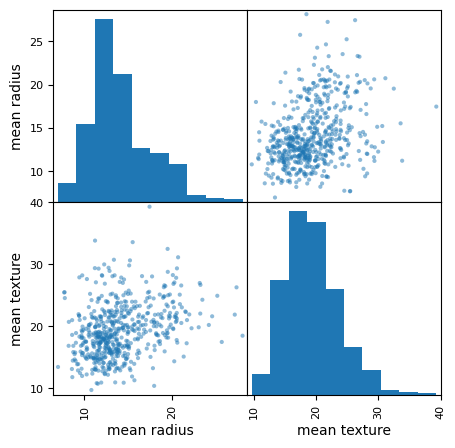

In [ ]:
df = pd.DataFrame(data.data[:, 0:2], columns=data.feature_names[0:2])  # 最初の10列がどうなっているか？
scatter_matrix(df, figsize=(5,5));

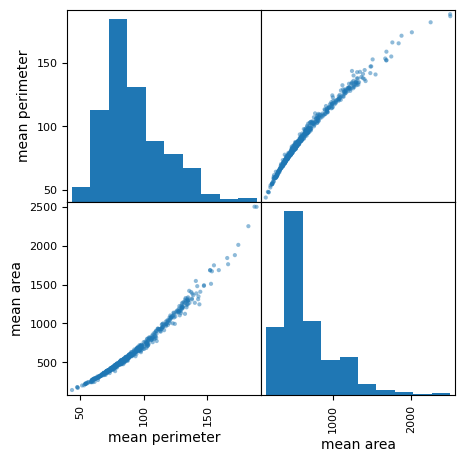

In [ ]:
df = pd.DataFrame(data.data[:, 2:4], columns=data.feature_names[2:4])  # 最初の10列がどうなっているか？
scatter_matrix(df, figsize=(5,5));

array([[<Axes: xlabel='mean radius', ylabel='mean radius'>,
        <Axes: xlabel='mean perimeter', ylabel='mean radius'>],
       [<Axes: xlabel='mean radius', ylabel='mean perimeter'>,
        <Axes: xlabel='mean perimeter', ylabel='mean perimeter'>]],
      dtype=object)

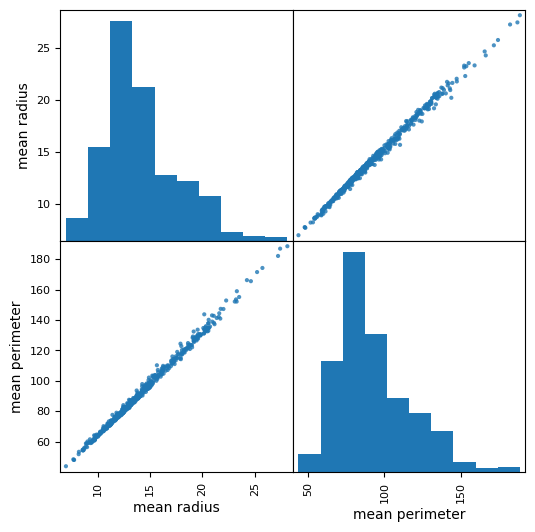

In [ ]:
df = pd.DataFrame(data.data,  columns=data.feature_names)
scatter_matrix(df[['mean radius', 'mean perimeter']], alpha=0.8, figsize=(6, 6), diagonal='hist')

In [ ]:
# [6:8]のデータが相間あったので、この2つを使ってやってみる
X = data.data[:, [0,2]]
y = data.target
names = data.feature_names[[0,2]]

In [ ]:
X

array([[ 17.99, 122.8 ],
       [ 20.57, 132.9 ],
       [ 19.69, 130.  ],
       ...,
       [ 16.6 , 108.3 ],
       [ 20.6 , 140.1 ],
       [  7.76,  47.92]])

In [ ]:
X.shape, y.shape

((569, 2), (569,))

Text(0, 0.5, 'mean perimeter')

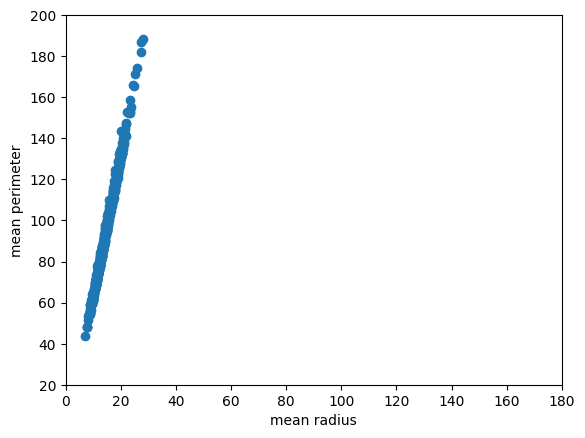

In [ ]:
plt.scatter(X[:, 0], X[:, 1])
plt.xlim(0, 180)
plt.ylim(20, 200)
plt.xlabel(names[0])
plt.ylabel(names[1])

In [ ]:
# 主成分分析でベクトル化する

from sklearn.decomposition import PCA

In [ ]:
pca = PCA()

In [ ]:
pca.fit(X)

PCA()

In [ ]:
# 主成分分析で回転
X_new = pca.transform(X)

(-60.0, 120.0)

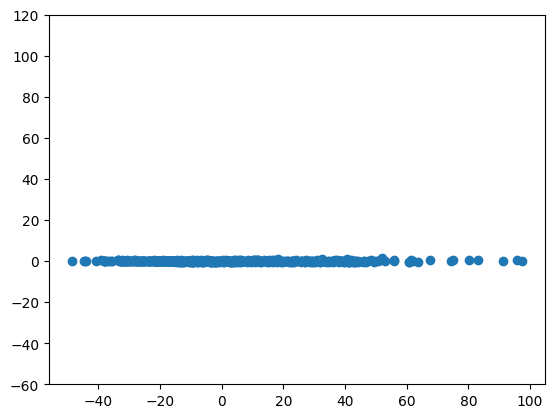

In [ ]:
plt.scatter(X_new[:, 0], X_new[:, 1])
plt.ylim(-60, 120)

In [ ]:
# 変換(回転)したx軸とy軸の分散を見る。y軸方法は分散ほとんどないことが分かる
pca.explained_variance_

array([6.02807278e+02, 5.21213668e-02])

In [ ]:
# x軸とy軸の比率は？ > ほとんどがx軸に寄っている （第1主成分による寄与率が高いということ）
pca.explained_variance_ / pca.explained_variance_.sum()

array([9.99913543e-01, 8.64569199e-05])

In [ ]:
# 主成分分析の寄与率 > ほとんどが第1主成分のみに寄っている
pca.explained_variance_ratio_

array([9.99913543e-01, 8.64569199e-05])

Text(0, 0.5, 'mean concave points')

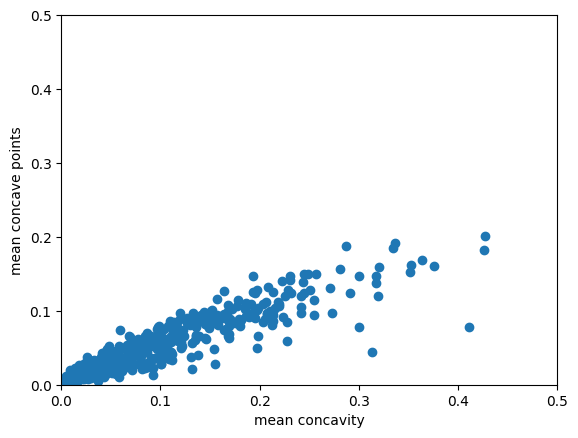

In [ ]:
# 別の特徴量でも見てみる

X = data.data[:, [6,7]]
y = data.target
names = data.feature_names[[6,7]]

plt.scatter(X[:, 0], X[:, 1])
plt.xlim(0, 0.5)
plt.ylim(0, 0.5)
plt.xlabel(names[0])
plt.ylabel(names[1])

(-0.25, 0.25)

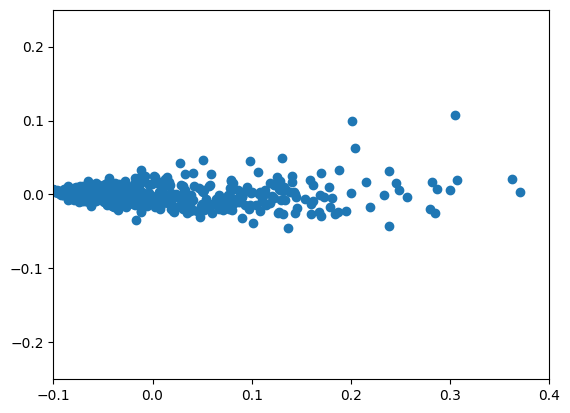

In [ ]:
pca.fit(X)
X_new = pca.transform(X)
plt.scatter(X_new[:, 0], X_new[:, 1])
plt.xlim(-0.1, 0.4)
plt.ylim(-0.25, 0.25)

In [ ]:
# 分散
pca.explained_variance_

array([0.00767254, 0.00018837])

In [ ]:
pca.explained_variance_ratio_ # 寄与率 > 第1主成分の方が高い

array([0.97603731, 0.02396269])

In [ ]:
# data全体で主成分分析を実施する

X = data.data
y = data.target

from sklearn.model_selection import ShuffleSplit

ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
pca.fit(X_train)

PCA()

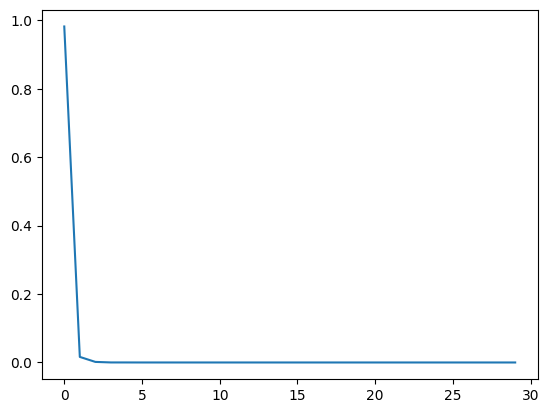

In [ ]:
# data全体で主成分分析を行うと第1主成分が最も高く、第3ぐらいで頭打ちになる
plt.plot(pca.explained_variance_ratio_)

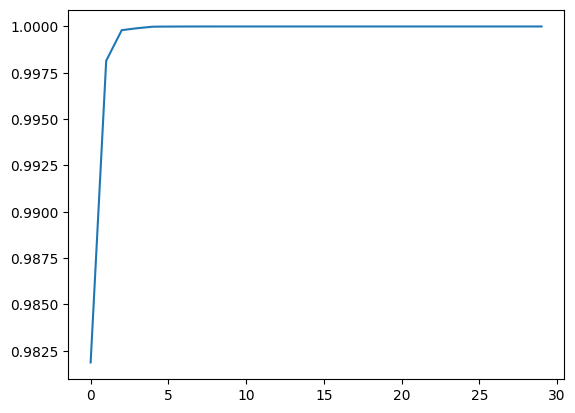

In [ ]:
# 第1主成分から第30主成分までの累積比率
#  > 第3軸でほぼ100%になる  > 以降27次元はいらないデータ
plt.plot(np.add.accumulate(pca.explained_variance_ratio_))

In [ ]:
# データ全体の主成分分析したものに対して学習 > この時点ではまだ30次元のまま
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

In [ ]:
from sklearn import linear_model
clf = linear_model.LogisticRegression(solver='liblinear')

In [ ]:
# 主成分分析したものに対して学習 > まだ30次元のまま
clf.fit(X_train_pca, y_train)
clf.score(X_test_pca, y_test)

0.9473684210526315

In [ ]:
# 第1主成分までのデータで実施
clf.fit(X_train_pca[:, 0:1], y_train)
clf.score(X_test_pca[:, 0:1], y_test)

0.9210526315789473

In [ ]:
# 第3主成分までのデータで実施 > 第3主成分まで減らしても同じ性能が出る
clf.fit(X_train_pca[:, 0:3], y_train)
clf.score(X_test_pca[:, 0:3], y_test)

0.9473684210526315

In [ ]:
# どの主成分まで使うのが一番最適か？
scores = []
i_range = range(1,31)

for i in i_range:

    clf.fit(X_train_pca[:, 0:i], y_train)
    scores.append( clf.score(X_test_pca[:, 0:i],
                             y_test) )

scores = np.array(scores)

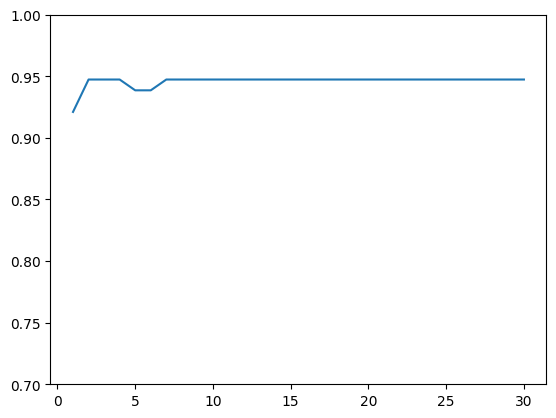

In [ ]:
plt.plot(i_range, scores)
plt.ylim(0.7,1);

In [ ]:
clf.fit(X_train_pca[:, 0:2], y_train)
clf.score(X_test_pca[:, 0:2], y_test)

0.9473684210526315

## 5-4 特徴変換：非線形(多項式)変換

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

In [ ]:
# 2次式の変換
polf = PolynomialFeatures(degree=2)

In [ ]:
polf.fit(X_train)

PolynomialFeatures()

In [ ]:
X_train_poly = polf.transform(X_train)
X_test_poly = polf.transform(X_test)

In [ ]:
X_train_poly.shape, X_train.shape

((455, 496), (455, 30))

In [ ]:
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.956140350877193

In [ ]:
clf.fit(X_train_poly, y_train)
clf.score(X_test_poly, y_test)

0.956140350877193

In [ ]:
# 30次元→496次元に増えたが、全ての特徴量が必要なのか確かめるために、主成分分析を実施する

pca.fit(X_train_poly)

PCA()

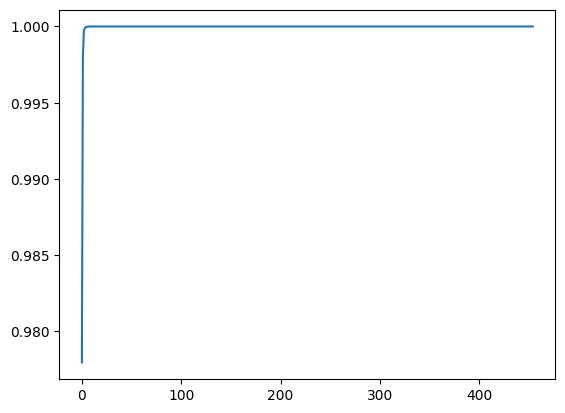

In [ ]:
plt.plot(np.add.accumulate(pca.explained_variance_ratio_))

In [ ]:
# 警告を非表示にする（追加コード）
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

In [ ]:
# どの程度の特徴量で精度が飽和するか調査
scores = []

n_features = X_train_poly.shape[1]
i_range = range(1, n_features, 10)

X_train_poly_pca = pca.transform(X_train_poly)
X_test_poly_pca  = pca.transform(X_test_poly)

for i in i_range:

    clf.fit(X_train_poly_pca[:, 0:i], y_train)

    scores.append( clf.score(X_test_poly_pca[:, 0:i],
                             y_test) )

scores = np.array(scores)

Text(0.5, 1.0, 'max 0.9649 at 21')

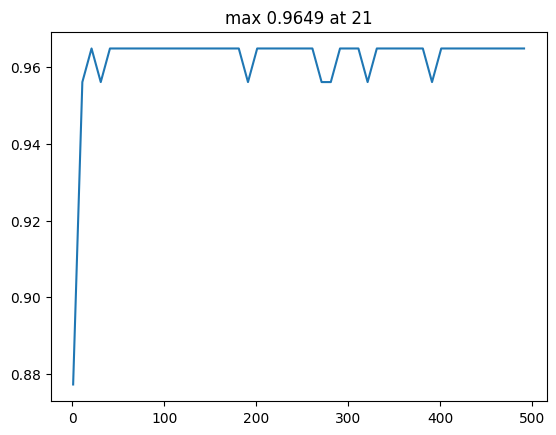

In [ ]:
plt.plot(i_range, scores);
plt.title("max {0:.4f} at {1}".format(scores.max(),
                                      i_range[np.argmax(scores)]))

d= 2
max dimension:  496
i=1,11,21,31,41,51,61,71,81,91,101,111,121,131,141,151,161,171,181,191,201,211,221,231,241,251,261,271,281,291,301,311,321,331,341,351,361,371,381,391,401,411,421,431,441,451,461,471,481,491,
d= 3
max dimension:  5456
i=1,11,21,31,41,51,61,71,81,91,101,111,121,131,141,151,161,171,181,191,201,211,221,231,241,251,261,271,281,291,301,311,321,331,341,351,361,371,381,391,401,411,421,431,441,451,461,471,481,491,
d= 4
max dimension:  46376
i=1,11,21,31,41,51,61,71,81,91,101,111,121,131,141,151,161,171,181,191,201,211,221,231,241,251,261,271,281,291,301,311,321,331,341,351,361,371,381,391,401,411,421,431,441,451,461,471,481,491,


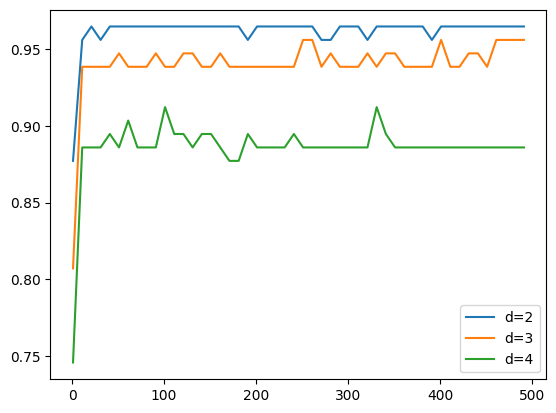

In [ ]:
# どの次元で精度が良いのか調査

for d in [2, 3, 4]:
    print("d=", d)

    polf = PolynomialFeatures(degree=d)
    polf.fit(X_train)
    X_train_poly = polf.transform(X_train)
    X_test_poly  = polf.transform(X_test)

    pca.fit(X_train_poly)
    X_train_poly_pca = pca.transform(X_train_poly)
    X_test_poly_pca  = pca.transform(X_test_poly)

    scores = []
    n_features = min(500, X_train_poly.shape[1])
    i_range = range(1, n_features, 10)

    print("max dimension: ", X_train_poly.shape[1])

    print("i=", end="")
    for i in i_range:
        print(i, end=",")
        clf.fit(X_train_poly_pca[:, 0:i], y_train)
        scores.append( clf.score(X_test_poly_pca[:, 0:i], y_test) )
    print("")

    scores = np.array(scores)
    plt.plot(i_range, scores, label="d={0}".format(d))

plt.legend();

## 5-6 標準化



*   これがやらないと精度が出ないときがあるので絶対にマスターすること


In [ ]:
import numpy as np

from sklearn.datasets import load_breast_cancer

data = load_breast_cancer()

In [ ]:
data.feature_names

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [ ]:
print(data.DESCR)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
data.feature_names[4], data.feature_names[3]

('mean smoothness', 'mean area')

Text(0, 0.5, 'mean smoothness')

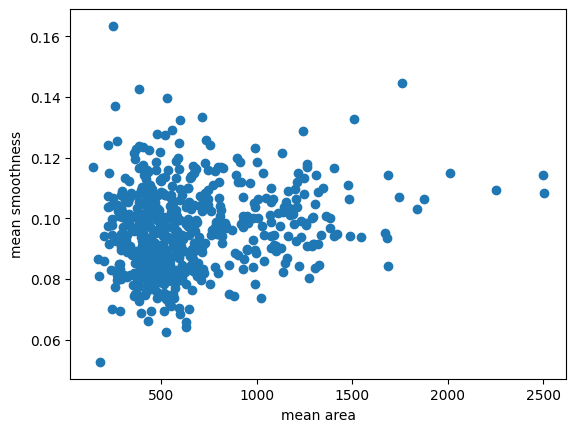

In [ ]:
# 上の特徴量を抜きだして図示

plt.scatter(data.data[:, 3], data.data[:, 4])
plt.xlabel(data.feature_names[3])
plt.ylabel(data.feature_names[4])

(0.0, 3000.0)

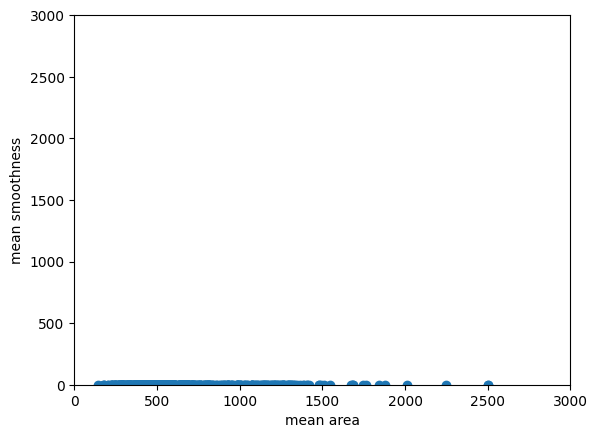

In [ ]:
plt.scatter(data.data[:, 3], data.data[:, 4])
plt.xlabel(data.feature_names[3])
plt.ylabel(data.feature_names[4])
plt.xlim(0, 3000)
plt.ylim(0, 3000)

In [ ]:
# data全体でやる

X = data.data
y = data.target

from sklearn.model_selection import ShuffleSplit

ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

### Standadization(標準化)

*   最もポピュラーなもの



In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [ ]:
scaler.fit(X_train)

StandardScaler()

In [ ]:
X_train_scale = scaler.transform(X_train)
X_test_scale = scaler.transform(X_test)

In [ ]:
# 標準化した特徴量は平均が0、標準偏差が1になる
X_train_scale.mean(axis=0), X_train_scale.std(axis=0)

(array([-8.97694617e-16, -3.35165351e-15,  3.23355506e-15, -2.22727819e-15,
        -1.46512838e-15,  5.31740403e-16,  6.61497719e-16,  4.76053873e-16,
        -5.68678194e-15,  6.94804409e-16,  4.90450171e-17,  5.76827963e-16,
         8.10706813e-16,  1.82881793e-16,  1.79160716e-15,  4.15540618e-16,
         3.25502751e-16,  6.02265490e-16, -1.51771148e-16,  1.34580991e-15,
        -4.28960896e-16,  4.92402212e-16, -1.51795548e-15,  1.32494748e-16,
         5.92337534e-15, -4.70369317e-16, -1.36923440e-15,  2.56327316e-16,
        -2.12333204e-15,  1.99242332e-15]),
 array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]))

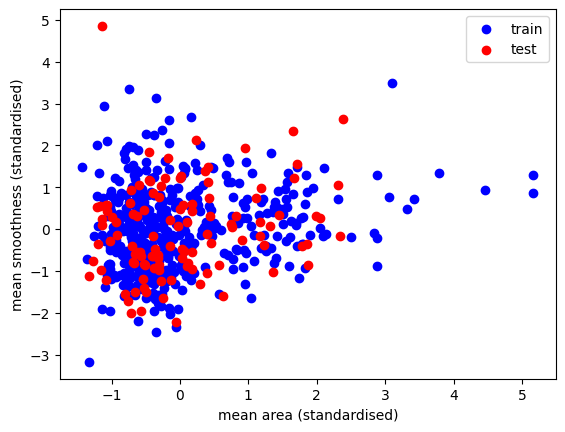

In [ ]:
plt.scatter(X_train_scale[:, 3],
            X_train_scale[:, 4], c='blue',
            label="train")
plt.scatter(X_test_scale[:, 3],
            X_test_scale[:, 4],  c='red',
            label="test")
plt.xlabel(data.feature_names[3] + " (standardised)")
plt.ylabel(data.feature_names[4] + " (standardised)")
plt.legend(loc="best");

In [ ]:
from sklearn import linear_model
clf = linear_model.LogisticRegression(solver='liblinear')

In [ ]:
# 標準化により精度が上がった
clf.fit(X_train_scale, y_train)
print(clf.score(X_test_scale, y_test))

0.9649122807017544


In [ ]:
clf.fit(X_train, y_train)
print(clf.score(X_test, y_test))

0.956140350877193


### range scaling(スケーリング)

*   標準化は平均0、分散1にするやり方だが、スケーリングは最小値最大値をある値に抑えること


In [ ]:
from sklearn.preprocessing import MinMaxScaler
mmscaler = MinMaxScaler(feature_range=(-1, 1))

In [ ]:
mmscaler.fit(X_train)
X_train_mms = mmscaler.transform(X_train)
X_test_mms = mmscaler.transform(X_test)

In [ ]:
# 最大最小が1,-1になっているか確認

X_train_mms.max(axis=0), X_train_mms.min(axis=0)

(array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
        1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]),
 array([-1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1., -1.,
        -1., -1., -1., -1.]))

In [ ]:
# 変換する前の最大値最小値は？

X_train.max(axis=0), X_train.min(axis=0)

(array([2.811e+01, 3.381e+01, 1.885e+02, 2.501e+03, 1.447e-01, 3.114e-01,
        4.268e-01, 2.012e-01, 3.040e-01, 9.744e-02, 2.873e+00, 4.885e+00,
        2.198e+01, 5.422e+02, 2.333e-02, 1.354e-01, 3.960e-01, 5.279e-02,
        6.146e-02, 2.984e-02, 3.604e+01, 4.954e+01, 2.512e+02, 4.254e+03,
        2.226e-01, 1.058e+00, 1.252e+00, 2.903e-01, 6.638e-01, 2.075e-01]),
 array([6.981e+00, 9.710e+00, 4.379e+01, 1.435e+02, 5.263e-02, 1.938e-02,
        0.000e+00, 0.000e+00, 1.060e-01, 4.996e-02, 1.115e-01, 3.602e-01,
        7.570e-01, 7.228e+00, 1.713e-03, 2.252e-03, 0.000e+00, 0.000e+00,
        7.882e-03, 8.948e-04, 7.930e+00, 1.202e+01, 5.041e+01, 1.852e+02,
        7.117e-02, 2.729e-02, 0.000e+00, 0.000e+00, 1.565e-01, 5.504e-02]))

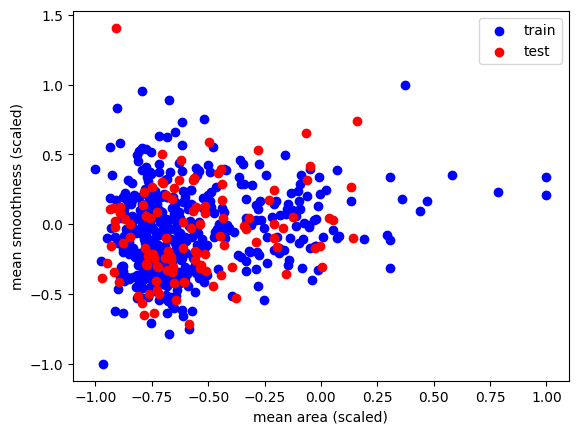

In [ ]:
plt.scatter(X_train_mms[:, 3],
            X_train_mms[:, 4], c='blue',
            label="train")
plt.scatter(X_test_mms[:, 3],
            X_test_mms[:, 4],  c='red',
            label="test")
plt.xlabel(data.feature_names[3] + " (scaled)")
plt.ylabel(data.feature_names[4] + " (scaled)")
plt.legend(loc="best");

In [ ]:
clf.fit(X_train_mms, y_train)
print(clf.score(X_test_mms, y_test))

0.9649122807017544


### Normalization(正規化)

In [ ]:
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()

In [ ]:
# fitは必要ない
# normalizer.fit(X_train)

In [ ]:
X_train_norm = normalizer.transform(X_train)
X_test_norm = normalizer.transform(X_test)

In [ ]:
X_train_norm.mean(axis=0), X_train_norm.std(axis=0)

(array([1.48516995e-02, 2.19005536e-02, 9.60362579e-02, 6.05273597e-01,
        1.12587130e-04, 1.09201028e-04, 7.91919511e-05, 4.22142175e-05,
        2.11764663e-04, 7.52607458e-05, 3.92553751e-04, 1.49367189e-03,
        2.75032351e-03, 3.30509472e-02, 8.88192924e-06, 2.84572017e-05,
        3.60309967e-05, 1.27821107e-05, 2.52770523e-05, 4.54461604e-06,
        1.67478537e-02, 2.90642616e-02, 1.09557914e-01, 7.77167536e-01,
        1.54596046e-04, 2.61142097e-04, 2.60973234e-04, 1.09077799e-04,
        3.35238255e-04, 9.82195499e-05]),
 array([3.94415461e-03, 1.09039197e-02, 2.45289746e-02, 4.75262133e-02,
        5.67361890e-05, 6.18280383e-05, 7.49136432e-05, 2.30905783e-05,
        1.08356465e-04, 4.11683510e-05, 1.99198026e-04, 1.22827081e-03,
        1.33754932e-03, 1.54598522e-02, 7.64029706e-06, 2.80408502e-05,
        5.98846092e-05, 9.78330387e-06, 1.92105654e-05, 5.00591408e-06,
        3.92666903e-03, 1.42818759e-02, 2.45928209e-02, 3.79328803e-02,
        8.09050741e-05

In [ ]:
X_train_norm.max(axis=0), X_train_norm.min(axis=0)

(array([2.84700680e-02, 8.66088059e-02, 1.78585343e-01, 6.97400762e-01,
        4.77151978e-04, 5.03168358e-04, 8.25977854e-04, 1.60675994e-04,
        7.87096852e-04, 3.18835398e-04, 1.65778661e-03, 1.13783731e-02,
        9.38365082e-03, 1.46680208e-01, 6.14437683e-05, 2.19824316e-04,
        7.96220132e-04, 1.06142578e-04, 1.81992000e-04, 5.99980019e-05,
        3.23403007e-02, 1.08567406e-01, 2.05583173e-01, 9.21243290e-01,
        6.45990370e-04, 1.47441480e-03, 2.97381613e-03, 4.15669188e-04,
        1.19573470e-03, 4.44506641e-04]),
 array([5.51189319e-03, 4.56825580e-03, 3.63962422e-02, 3.76233264e-01,
        2.17902707e-05, 2.37805701e-05, 0.00000000e+00, 0.00000000e+00,
        4.14296567e-05, 1.13032004e-05, 1.38230416e-04, 2.22630519e-04,
        8.95949678e-04, 1.14342671e-02, 1.17600717e-06, 2.76335624e-06,
        0.00000000e+00, 0.00000000e+00, 3.33747542e-06, 5.12412074e-07,
        7.24466195e-03, 5.15445862e-03, 5.04955350e-02, 6.96047105e-01,
        2.72780418e-05

In [ ]:
np.linalg.norm(X_train, axis=1)[:20]

array([ 504.90301766,  618.934165  , 1250.79346781,  680.57848004,
        789.01630477,  836.86533919,  694.54924712,  765.38441537,
        988.35346236,  624.18559733, 2090.96095333,  679.47567586,
       1094.37796043,  609.98361938,  490.99404722,  558.47604006,
       1758.43151043,  550.59180245,  843.30139448,  841.67151693])

In [ ]:
np.linalg.norm(X_train_norm, axis=1)[:20]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1.])

In [ ]:
# 正規化は精度が落ちる場合があるので注意が必要

clf.fit(X_train_norm, y_train)
print(clf.score(X_test_norm, y_test))

0.7192982456140351


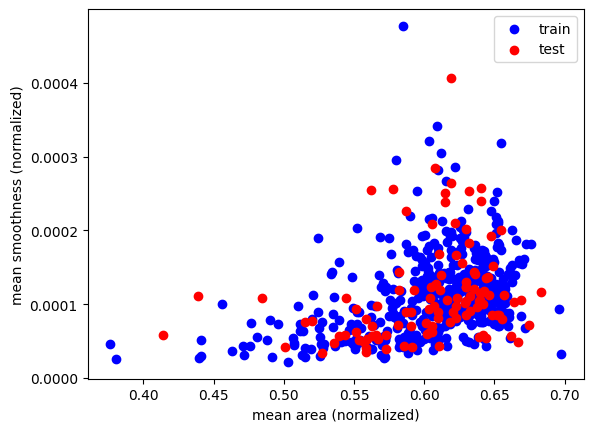

In [ ]:
plt.scatter(X_train_norm[:, 3],
            X_train_norm[:, 4], c='blue',
            label="train")
plt.scatter(X_test_norm[:, 3],
            X_test_norm[:, 4],  c='red',
            label="test")
plt.xlabel(data.feature_names[3] + " (normalized)")
plt.ylabel(data.feature_names[4] + " (normalized)")
plt.legend(loc="best");

### PCA白色化

*   PCAのホワイト化はPCA(主成分分析)を掛けた後に標準化(平均0、分散1)する手法

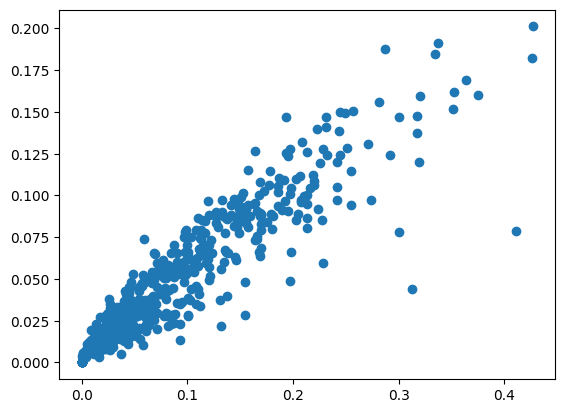

In [ ]:
plt.scatter(data.data[:, 6], data.data[:, 7])

(0.0, 0.5)

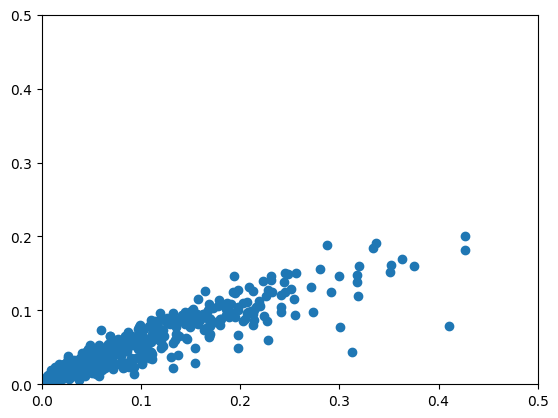

In [ ]:
# PCAは相間のある軸を見つける分析方法だった

X = data.data[:, [6,7]]
y = data.target
plt.scatter(X[:, 0], X[:, 1])
plt.xlim(0, 0.5)
plt.ylim(0, 0.5)

(-0.25, 0.25)

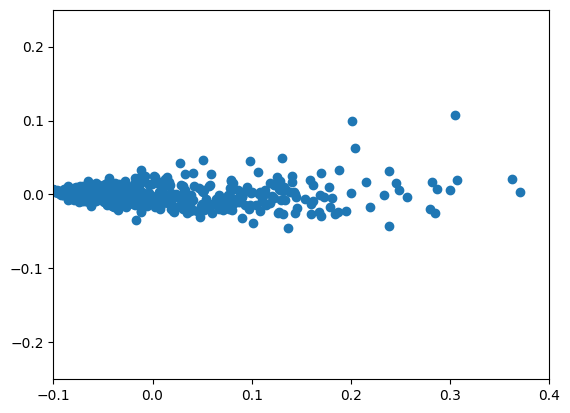

In [ ]:
# これはまだ白色化をしていない状態。なぜなら、横に軸が伸びているから
# 横に伸びている軸をぎゅっと縮めるのが白色化
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X)
X_new = pca.transform(X)
plt.scatter(X_new[:, 0], X_new[:, 1])
plt.xlim(-0.1, 0.4)
plt.ylim(-0.25, 0.25)

(-4.0, 10.0)

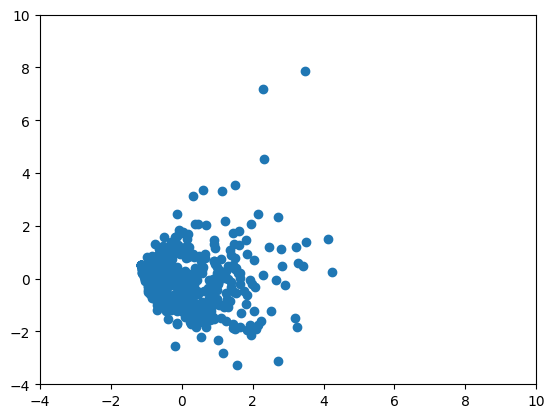

In [ ]:
# 白色化をすると、縦横同じように分布するようになる
pca = PCA(whiten=True)
pca.fit(X)
X_new = pca.transform(X)
plt.scatter(X_new[:, 0], X_new[:, 1])
plt.xlim(-4, 10)
plt.ylim(-4, 10)

In [ ]:
X_new.mean(axis=0), X_new.std(axis=0)

(array([1.05363872e-17, 2.18532476e-16]), array([0.99912088, 0.99912088]))

### ZCA白色化

(-3.0, 3.0)

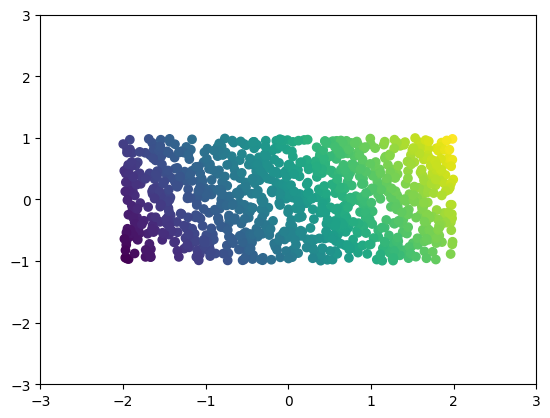

In [ ]:
X = np.random.uniform(low=-1, high=1, size=(1000,2)) * (2,1)
y = 2 * X[:,0] + X[:,1]
plt.scatter(X[:, 0], X[:, 1], c=y)
plt.xlim(-3,3)
plt.ylim(-3,3)

In [ ]:
angle = np.pi/4

In [ ]:
R = np.array([[np.sin(angle), -np.cos(angle)],
              [np.cos(angle), np.sin(angle)]])
R

array([[ 0.70710678, -0.70710678],
       [ 0.70710678,  0.70710678]])

(-3.0, 3.0)

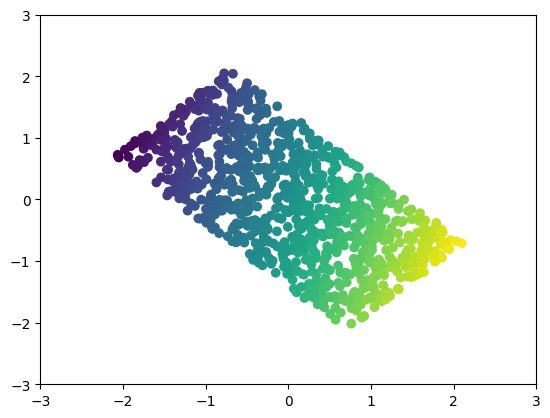

In [ ]:
X_rot = X.dot(R)
plt.scatter(X_rot[:, 0], X_rot[:, 1], c=y)
plt.xlim(-3,3)
plt.ylim(-3,3)

In [ ]:
X = X_rot

Text(0.5, 1.0, 'PCA')

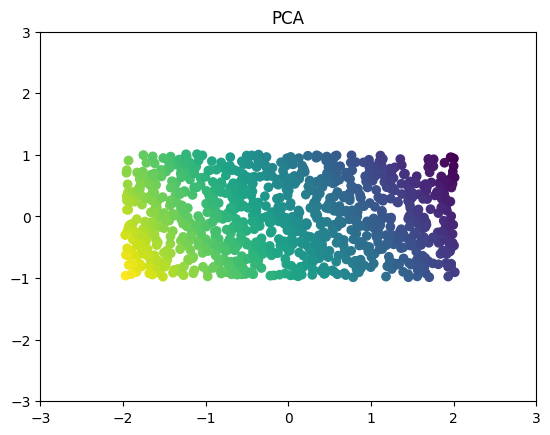

In [ ]:
pca = PCA(whiten=False)
pca.fit(X)
X_new = pca.transform(X)
plt.scatter(X_new[:, 0], X_new[:, 1], c=y)
plt.xlim(-3,3)
plt.ylim(-3,3)
plt.title("PCA")

Text(0.5, 1.0, 'PCA Whitening')

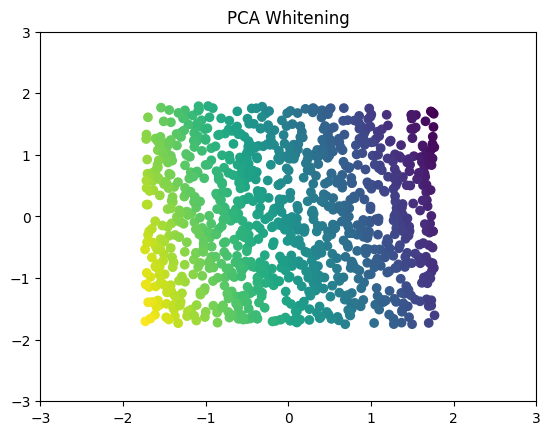

In [ ]:
pca = PCA(whiten=True)
pca.fit(X)
X_new = pca.transform(X)
plt.scatter(X_new[:, 0], X_new[:, 1], c=y)
plt.xlim(-3,3)
plt.ylim(-3,3)
plt.title("PCA Whitening")

Text(0.5, 1.0, 'ZCA Whitening')

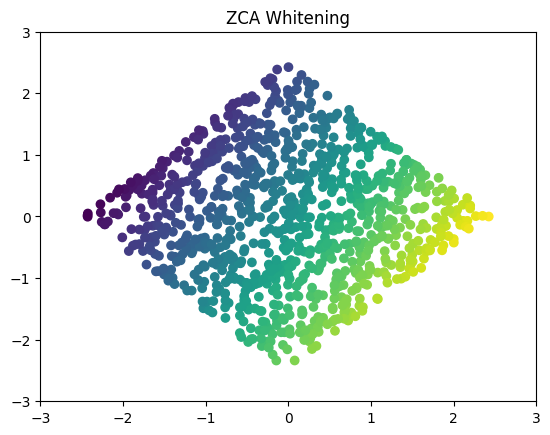

In [ ]:
X_new2 = X_new.dot(pca.components_)
plt.scatter(X_new2[:, 0], X_new2[:, 1], c=y)
plt.xlim(-3,3)
plt.ylim(-3,3)
plt.title("ZCA Whitening")

In [ ]:
pca.components_

array([[-0.71218744,  0.70198935],
       [-0.70198935, -0.71218744]])

# テストデータの評価方法

## 6-1 2クラス問題のConfusion Matrix

### Confusion Matrix

In [ ]:
import numpy as np

from sklearn.datasets import load_breast_cancer

data = load_breast_cancer()

X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
from sklearn import linear_model
clf = linear_model.LogisticRegression(solver='liblinear')

In [ ]:
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.956140350877193

In [ ]:
y_test

array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0,
       1, 0, 0, 1])

In [ ]:
y_pred = clf.predict(X_test)
y_pred

array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0,
       1, 0, 0, 1])

In [ ]:
# 0は悪性の腫瘍
# 1は良性

In [ ]:
print(f'0: {np.count_nonzero(y_test==0)}, 1: {np.count_nonzero(y_test==1)}')

0: 47, 1: 67


In [ ]:
print(f'0: {np.count_nonzero(y_pred==0)}, 1: {np.count_nonzero(y_pred==1)}')

0: 50, 1: 64


In [ ]:
conf_mat = np.zeros( [2, 2] )

for true_label, est_label, in zip(y_test, y_pred):
  conf_mat[true_label, est_label] += 1

In [ ]:
print(conf_mat)

[[46.  1.]
 [ 4. 63.]]


In [ ]:
import pandas as pd
df = pd.DataFrame(conf_mat,
                  columns=['pred_0', 'pred_1'],
                  index=['true_0', 'true_1'])

In [ ]:
print(df)

        pred_0  pred_1
true_0    46.0     1.0
true_1     4.0    63.0


In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [ ]:
accuracy_score(y_test, y_pred)

0.956140350877193

### TP,TN,FP,FN

In [ ]:
cmat = confusion_matrix(y_test, y_pred)
cmat

array([[46,  1],
       [ 4, 63]])

In [ ]:
# 真陽性 : TruePositive
TP = cmat[0,0]
TP

46

In [ ]:
# 真陰性 : TrueNegative
TN = cmat[1,1]
TN

63

In [ ]:
# 偽陽性 : FalsePositive
FP = cmat[1,0]
FP

4

In [ ]:
# 偽陽性 : FalseNegative
FN = cmat[0,1]
FN

1

### 10クラス問題

In [ ]:
from sklearn.datasets import load_digits
data = load_digits()

X = data.data
y = data.target

In [ ]:
X.shape, y.shape

((1797, 64), (1797,))

In [ ]:
y

array([0, 1, 2, ..., 8, 9, 8])

In [ ]:
img = data.images

In [ ]:
X[0].shape, img[0].shape

((64,), (8, 8))

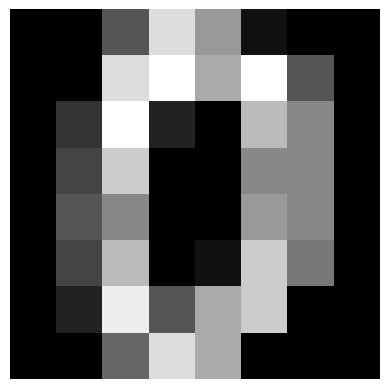

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.gray()
plt.imshow(img[0], interpolation='none')
plt.axis('off');

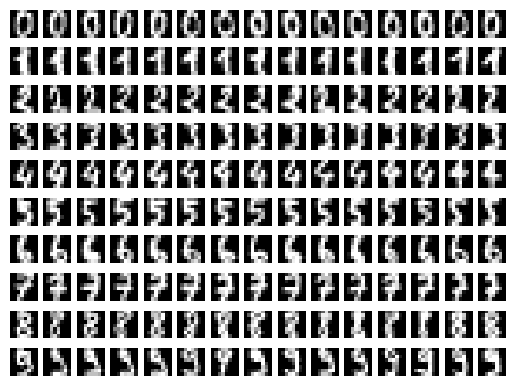

In [ ]:
for i in range(10):
    i_th_digit = data.images[data.target == i]
    for j in range(0,15):
        plt.subplot(10, 15, i * 15 + j +1)
        plt.axis('off')
        plt.imshow(i_th_digit[j], interpolation='none')

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
clf.fit(X_train, y_train)

LogisticRegression(solver='liblinear')

In [ ]:
clf.score(X_test, y_test)

0.95

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred)

0.95

In [ ]:
conf_mat = confusion_matrix(y_test, y_pred)

df = pd.DataFrame(conf_mat,
                  columns=range(0,10),
                  index=range(0,10))

In [ ]:
# 多クラスのConfusion Matrixを見ると、何の数字がどの数字と間違っているのか明確になる
print(df)

    0   1   2   3   4   5   6   7   8   9
0  27   0   0   0   0   0   0   0   0   0
1   0  31   0   0   0   0   1   0   3   0
2   0   0  34   2   0   0   0   0   0   0
3   0   0   0  29   0   0   0   0   0   0
4   0   0   0   0  30   0   0   0   0   0
5   0   0   0   0   0  39   0   0   0   1
6   0   1   0   0   0   0  43   0   0   0
7   0   1   0   0   1   0   0  37   0   0
8   0   2   1   0   0   0   0   0  35   1
9   0   0   0   1   0   1   0   0   2  37


In [ ]:
# PCAの白色化で標準化してみる

from sklearn.decomposition import PCA
pca = PCA(whiten=True)
pca.fit(X_train)

X_train_pca = pca.transform(X_train)
X_test_pca  = pca.transform(X_test)

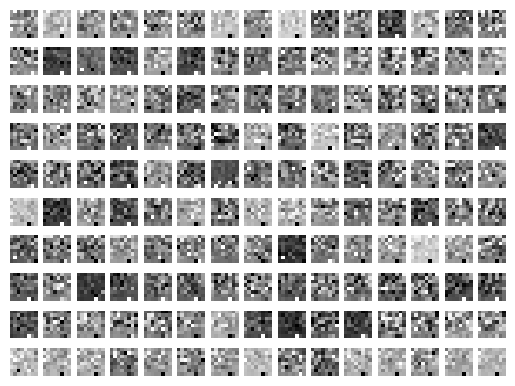

In [ ]:
# 白色化すると人間には文字が文字がほとんど見えなくなる
for i in range(10):
    i_th_digit = X_train_pca[y_train == i]
    for j in range(0,15):
        plt.subplot(10, 15, i * 15 + j +1)
        plt.axis('off')
        plt.imshow(i_th_digit[j].reshape(8,8), interpolation='none')

In [ ]:
# 人間には文字がほとんど見えなくても機械学習の精度はそこまで下がらないという例
clf.fit(X_train_pca, y_train)
clf.score(X_test_pca, y_test)

0.9611111111111111

In [ ]:
y_pred_pca = clf.predict(X_test_pca)

conf_mat = confusion_matrix(y_test, y_pred_pca)

df = pd.DataFrame(conf_mat,
                  columns=range(0,10),
                  index=range(0,10))

In [ ]:
print(df)

    0   1   2   3   4   5   6   7   8   9
0  27   0   0   0   0   0   0   0   0   0
1   0  33   0   0   0   0   0   0   2   0
2   0   0  35   1   0   0   0   0   0   0
3   0   0   0  29   0   0   0   0   0   0
4   0   0   0   0  29   0   0   1   0   0
5   0   1   0   0   0  38   0   0   0   1
6   0   0   0   0   0   0  44   0   0   0
7   0   0   0   0   0   0   0  39   0   0
8   0   3   1   0   0   0   0   0  35   0
9   0   0   0   0   0   1   0   2   1  37


In [ ]:
# ZCAの白色化するとどうなるか？
X_train_zca = X_train_pca.dot(pca.components_)
X_test_zca  = X_test_pca.dot(pca.components_)

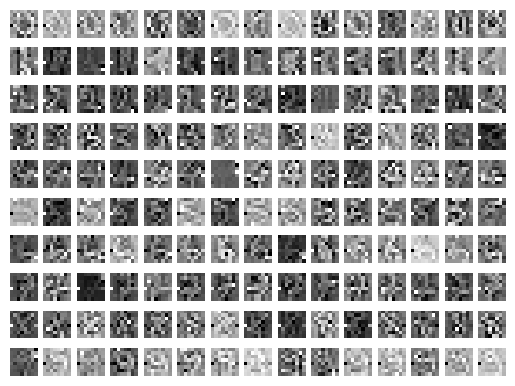

In [ ]:
for i in range(10):
    i_th_digit = X_train_zca[y_train == i]
    for j in range(0,15):
        plt.subplot(10, 15, i * 15 + j +1)
        plt.axis('off')
        plt.imshow(i_th_digit[j].reshape(8,8), interpolation='none')

In [ ]:
clf.fit(X_train_zca, y_train)
clf.score(X_test_zca, y_test)

0.9611111111111111

In [ ]:
y_pred_zca = clf.predict(X_test_zca)
conf_mat = confusion_matrix(y_test, y_pred_zca)

df = pd.DataFrame(conf_mat,
                  columns=range(0,10),
                  index=range(0,10))
print(df)

    0   1   2   3   4   5   6   7   8   9
0  27   0   0   0   0   0   0   0   0   0
1   0  33   0   0   0   0   0   0   2   0
2   0   0  35   1   0   0   0   0   0   0
3   0   0   0  29   0   0   0   0   0   0
4   0   0   0   0  29   0   0   1   0   0
5   0   1   0   0   0  38   0   0   0   1
6   0   0   0   0   0   0  44   0   0   0
7   0   0   0   0   0   0   0  39   0   0
8   0   3   1   0   0   0   0   0  35   0
9   0   0   0   0   0   1   0   2   1  37


### PCAで文字認識

In [ ]:
scores = []

for i in range(1,65):
  clf.fit(X_train_pca[:, 0:i], y_train)
  score = clf.score(X_test_pca[:, 0:i], y_test)
  print(i, score)
  scores.append(score)

scores = np.array(scores)

1 0.3277777777777778
2 0.5361111111111111
3 0.6333333333333333
4 0.7611111111111111
5 0.8
6 0.8111111111111111
7 0.8666666666666667
8 0.875
9 0.9027777777777778
10 0.9111111111111111
11 0.9361111111111111
12 0.9388888888888889
13 0.9333333333333333
14 0.9361111111111111
15 0.9361111111111111
16 0.9416666666666667
17 0.95
18 0.9472222222222222
19 0.95
20 0.95
21 0.95
22 0.9527777777777777
23 0.9527777777777777
24 0.95
25 0.9444444444444444
26 0.9472222222222222
27 0.9472222222222222
28 0.9527777777777777
29 0.9555555555555556
30 0.9472222222222222
31 0.95
32 0.95
33 0.9527777777777777
34 0.9527777777777777
35 0.95
36 0.95
37 0.9527777777777777
38 0.9472222222222222
39 0.9555555555555556
40 0.9527777777777777
41 0.9583333333333334
42 0.9555555555555556
43 0.9583333333333334
44 0.9611111111111111
45 0.9583333333333334
46 0.9611111111111111
47 0.9583333333333334
48 0.9583333333333334
49 0.9555555555555556
50 0.9555555555555556
51 0.9611111111111111
52 0.9611111111111111
53 0.96111111111111

(0.9, 1.0)

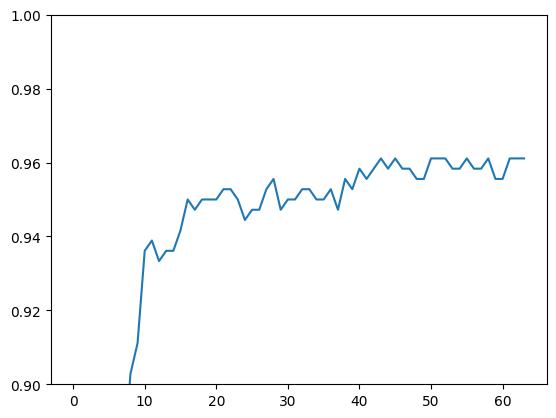

In [ ]:
plt.plot(scores)
plt.ylim(0.9,1)

## 6-2 PrecisionとRecall, f1-score

### PrecisonとRecall

In [ ]:
import numpy as np

from sklearn.datasets import load_breast_cancer

data = load_breast_cancer()

X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
from sklearn import linear_model
clf = linear_model.LogisticRegression(solver='liblinear')

In [ ]:
clf.fit(X_train, y_train)

LogisticRegression(solver='liblinear')

In [ ]:
clf.score(X_test, y_test)

0.956140350877193

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [ ]:
accuracy_score(y_test, y_pred)

0.956140350877193

In [ ]:
cmat = confusion_matrix(y_test, y_pred)
cmat

array([[46,  1],
       [ 4, 63]])

In [ ]:
# accuracy_scoreは対角線/全体
print(cmat.sum())                               #全体
print(cmat.diagonal().sum())                    #対角線の和
print(cmat.diagonal().sum() / cmat.sum())       #accurasy_score

114
109
0.956140350877193


In [ ]:
TP = cmat[0,0]
TN = cmat[1,1]
FP = cmat[1,0]
FN = cmat[0,1]

TP, TN, FP, FN

(46, 63, 4, 1)

In [ ]:
# 上記のように書くのはめんどくさいので、一括で出してくれるレポートがある
from sklearn.metrics import classification_report

In [ ]:
print(classification_report(y_test, y_pred, digits=4))  # digits=4は小数第4位まで

              precision    recall  f1-score   support

           0     0.9200    0.9787    0.9485        47
           1     0.9844    0.9403    0.9618        67

    accuracy                         0.9561       114
   macro avg     0.9522    0.9595    0.9551       114
weighted avg     0.9578    0.9561    0.9563       114



In [ ]:
precision_0 = TP / (TP + FP)
# = 46/(46+4) class 0 precision 適合度，精度

precision_0

0.92

In [ ]:
recall_0 = TP / (TP + FN)

# = 46/(46+1) class 0 recall 再現率，
#             sensitivity 感度,
#             True positive rate (TPR)

recall_0

0.9787234042553191

In [ ]:
recall_1 = TN / (FP + TN)
# 63 / (63 + 4) class 1 recall,
#               sepecficity  特異度

sepecficity = recall_1
sepecficity

0.9402985074626866

In [ ]:
FPR = FP / (FP + TN)
# False Positive Rate
# 1 - sepecficity
FPR

0.05970149253731343

In [ ]:
precision_1 = TN / (TN + FN)
# = 63/(63+1) class 1 precision

precision_1

0.984375

### f1_score

In [ ]:
print(classification_report(y_test, y_pred, digits=4))

              precision    recall  f1-score   support

           0     0.9200    0.9787    0.9485        47
           1     0.9844    0.9403    0.9618        67

    accuracy                         0.9561       114
   macro avg     0.9522    0.9595    0.9551       114
weighted avg     0.9578    0.9561    0.9563       114



In [ ]:
f1_0 = 2 * precision_0 * recall_0 / (precision_0 + recall_0)
f1_0

0.9484536082474226

In [ ]:
f1_1 = 2 * precision_1 * recall_1 / (precision_1 + recall_1)
f1_1

0.9618320610687023

In [ ]:
# f1_scoreを算出するようのモジュール
# pos_labelを引数にすることでf1_0とf1_1を選べる
from sklearn.metrics import f1_score

f1_score(y_test, y_pred, pos_label=0), f1_score(y_test, y_pred, pos_label=1)

(0.9484536082474226, 0.9618320610687023)

In [ ]:
# f1_scoreの拡張したものにfbeta_scoreというモジュールがある
# beta=1でf1スコアを求めることができる

from sklearn.metrics import fbeta_score
fbeta_score(y_test, y_pred, beta=1, pos_label=0)

0.9484536082474226

In [ ]:
# precision、recall、f1_scoreをいっぺんにやる算出するモジュールがある
# classification_reportは値を受け取ることができなかったので、値を受け取りたい場合はこちらを使う
from sklearn.metrics import precision_recall_fscore_support
precision_recall_fscore_support(y_test, y_pred, beta=1)

# precision
# recall
# f1_score

(array([0.92    , 0.984375]),
 array([0.9787234 , 0.94029851]),
 array([0.94845361, 0.96183206]),
 array([47, 67]))

### 多クラス分類のPrecisonとRecall

In [ ]:
from sklearn.datasets import load_digits
data = load_digits()

X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
clf.fit(X_train, y_train)

LogisticRegression(solver='liblinear')

In [ ]:
clf.score(X_test, y_test)

0.95

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred)

0.95

In [ ]:
confusion_matrix(y_test, y_pred)

array([[27,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 31,  0,  0,  0,  0,  1,  0,  3,  0],
       [ 0,  0, 34,  2,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0, 29,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 30,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0, 39,  0,  0,  0,  1],
       [ 0,  1,  0,  0,  0,  0, 43,  0,  0,  0],
       [ 0,  1,  0,  0,  1,  0,  0, 37,  0,  0],
       [ 0,  2,  1,  0,  0,  0,  0,  0, 35,  1],
       [ 0,  0,  0,  1,  0,  1,  0,  0,  2, 37]])

In [ ]:
print(classification_report(y_test, y_pred, digits=4))

              precision    recall  f1-score   support

           0     1.0000    1.0000    1.0000        27
           1     0.8857    0.8857    0.8857        35
           2     0.9714    0.9444    0.9577        36
           3     0.9062    1.0000    0.9508        29
           4     0.9677    1.0000    0.9836        30
           5     0.9750    0.9750    0.9750        40
           6     0.9773    0.9773    0.9773        44
           7     1.0000    0.9487    0.9737        39
           8     0.8750    0.8974    0.8861        39
           9     0.9487    0.9024    0.9250        41

    accuracy                         0.9500       360
   macro avg     0.9507    0.9531    0.9515       360
weighted avg     0.9509    0.9500    0.9500       360



## 6-3 ROC AUC

### ROC, Precision-Recallカーブ

In [ ]:
import numpy as np

from sklearn.datasets import load_breast_cancer

data = load_breast_cancer()

X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
from sklearn import linear_model
clf = linear_model.LogisticRegression(solver='liblinear')

In [ ]:
clf.fit(X_train, y_train)
clf.score(X_test, y_test)
y_pred = clf.predict(X_test)

In [ ]:
y_pred = clf.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [ ]:
accuracy_score(y_test, y_pred)

0.956140350877193

In [ ]:
cmat = confusion_matrix(y_test, y_pred)
cmat

array([[46,  1],
       [ 4, 63]])

In [ ]:
# 12~15のIndexの識別器にかけた生の値はこれ
clf.decision_function(X_test[12:15])

array([ 5.52252588, -1.18967151,  1.40952022])

In [ ]:
#予測のラベル：現状だと閾値：<0 で1を返すようなラベル付けになっている
clf.predict(X_test[12:15])

array([1, 0, 1])

In [ ]:
#上記を式で書くとこんな感じ
(clf.decision_function(X_test[12:15]) > 0).astype(int)

array([1, 0, 1])

In [ ]:
#閾値2にするとこうなる
(clf.decision_function(X_test[12:15]) > 2).astype(int)

array([1, 0, 0])

In [ ]:
# 閾値を-3から7まで変えてみる
# 閾値0以降はラベルが変わっていない → 安定しているという意味
for th in range(-3,7):
  print(th , (clf.decision_function(X_test[12:15]) > th).astype(int))

-3 [1 1 1]
-2 [1 1 1]
-1 [1 0 1]
0 [1 0 1]
1 [1 0 1]
2 [1 0 0]
3 [1 0 0]
4 [1 0 0]
5 [1 0 0]
6 [0 0 0]


In [ ]:
from sklearn.metrics import roc_curve, auc, average_precision_score, precision_recall_curve

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
test_score = clf.decision_function(X_test)

fpr, tpr, th = roc_curve(y_test, test_score)


In [ ]:
fpr

array([0.        , 0.        , 0.        , 0.0212766 , 0.0212766 ,
       0.04255319, 0.04255319, 0.14893617, 0.14893617, 1.        ])

In [ ]:
tpr

array([0.        , 0.01492537, 0.8358209 , 0.8358209 , 0.97014925,
       0.97014925, 0.98507463, 0.98507463, 1.        , 1.        ])

In [ ]:
th

array([ 10.41646986,   9.41646986,   2.05465784,   1.76030463,
        -0.53263804,  -0.66179179,  -1.18967151,  -2.30172469,
        -2.62277403, -41.31284907])

AUC =  0.9942838996506828


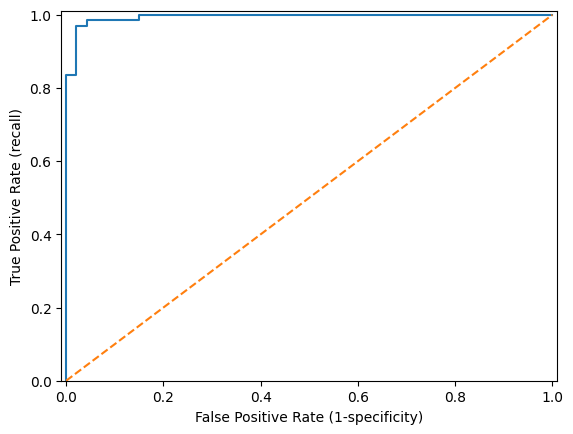

In [ ]:
# ROCカーブ
test_score = clf.decision_function(X_test)

fpr, tpr, _ = roc_curve(y_test, test_score)

plt.plot(fpr, tpr)
print("AUC = ", auc(fpr, tpr))

plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlim([-0.01, 1.01])
plt.ylim([0.0, 1.01])
plt.ylabel('True Positive Rate (recall)')
plt.xlabel('False Positive Rate (1-specificity)');

Text(0, 0.5, 'Precsion')

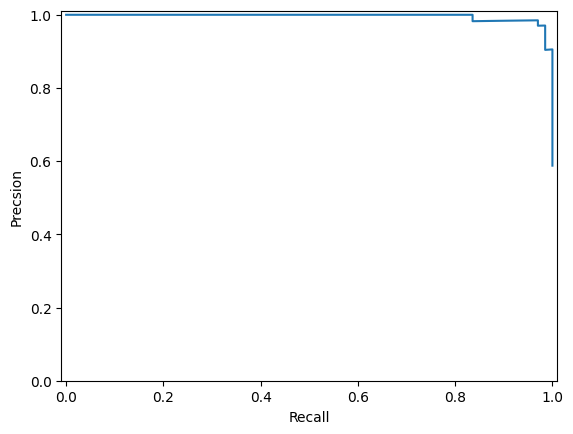

In [ ]:
# Precision-Recall カーブ

test_score = clf.decision_function(X_test)

precision, recall, _ = precision_recall_curve(y_test, test_score)

plt.plot(recall, precision)

plt.xlim([-0.01, 1.01])
plt.ylim([0.0, 1.01])
plt.xlabel('Recall')
plt.ylabel('Precsion')

### ランダムな時実験

result AUC =  0.9942838996506828
chance AUC =  0.4763416957764369
perfect AUC =  1.0


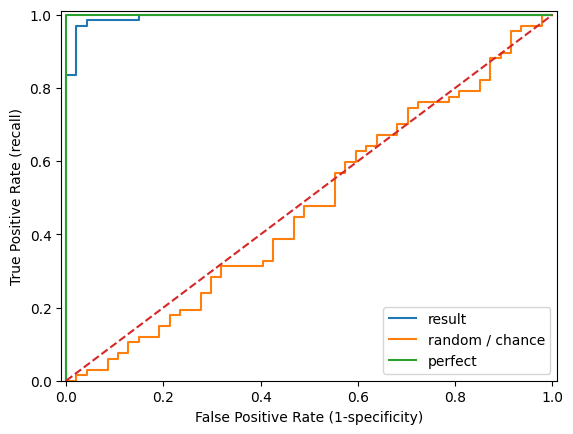

In [ ]:
# テストスコアがランダムの時と完璧な時で実験

# ROCカーブ生成
test_score = clf.decision_function(X_test)
fpr, tpr, _ = roc_curve(y_test, test_score)
plt.plot(fpr, tpr, label="result")
print("result AUC = ", auc(fpr, tpr))

# もしまったくランダムなら
test_score = np.random.uniform(size=y_test.size)
fpr, tpr, _ = roc_curve(y_test, test_score)
plt.plot(fpr, tpr, label="random / chance")
print("chance AUC = ", auc(fpr, tpr))

# 完璧なら
fpr, tpr, _ = roc_curve(y_test, y_test)
plt.plot(fpr, tpr, label="perfect")
print("perfect AUC = ", auc(fpr, tpr))

plt.plot([0, 1], [0, 1], linestyle='--')
plt.legend(loc="best")
plt.xlim([-0.01, 1.01])
plt.ylim([0.0, 1.01])
plt.ylabel('True Positive Rate (recall)')
plt.xlabel('False Positive Rate (1-specificity)');

Text(0, 0.5, 'Precision')

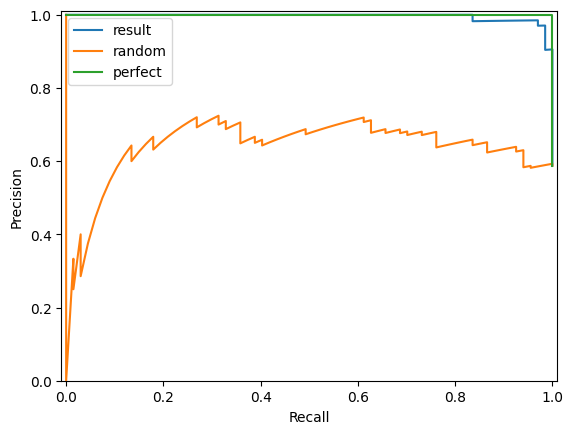

In [ ]:
# Precision-Recallカーブ
test_score = clf.decision_function(X_test)
precision, recall, _ = precision_recall_curve(y_test, test_score)
plt.plot(recall, precision, label="result")

# もしまったくランダムなら
test_score = np.random.uniform(size=y_test.size)
precision, recall, _ = precision_recall_curve(y_test, test_score)
plt.plot(recall, precision, label="random")

# 完璧なら
precision, recall, _ = precision_recall_curve(y_test, y_test)
plt.plot(recall, precision, label="perfect")

plt.legend(loc="best")
plt.xlim([-0.01, 1.01])
plt.ylim([0.0, 1.01])
plt.xlabel('Recall')
plt.ylabel('Precision')

### Precision-Recallカーブの補間とAverage Precision

In [ ]:
# precision-recallカーブはギザギザになるときが多い
# そういう時にはprecision-recallカーブを補間して表示することが多い
# 論文：http://homepages.inf.ed.ac.uk/ckiw/postscript/ijcv_voc09.pdf for average precision and interpolation

In [ ]:
# ランダムな時に補間（interpolating）
test_score = np.random.uniform(size=y_test.size)
precision, recall, _ = precision_recall_curve(y_test, test_score)

# 補間するための変数定義
precision_interp = np.maximum.accumulate(precision)

Text(0, 0.5, 'Precision')

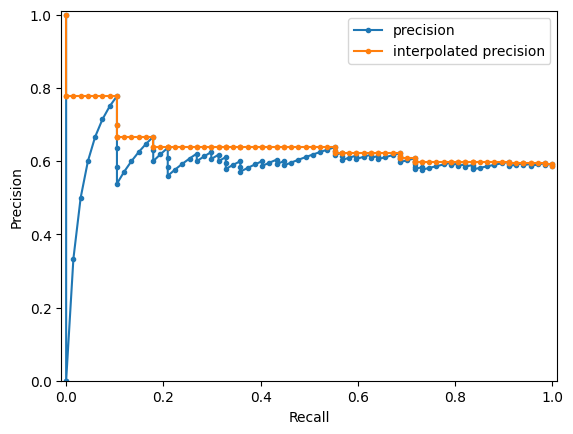

In [ ]:
plt.plot(recall, precision, marker=".", label="precision")
plt.plot(recall, precision_interp, marker=".", label="interpolated precision")

plt.legend(loc="best")
plt.xlim([-0.01, 1.01])
plt.ylim([0.0, 1.01])
plt.xlabel('Recall')
plt.ylabel('Precision')

In [ ]:
# 補間したRacall-Precisionカーブの値が落ちる各点を平均化したものを
# AP：Average Precisionという
all_precision = np.interp(np.arange(0, 1.1, 0.1),
                          recall[::-1],
                          precision_interp[::-1])
AP = all_precision.mean()

In [ ]:
# all_precisionにはinterpolated precisionのy軸の値が入る
# APはその平均値である
print(all_precision)
print(AP)

[0.77777778 0.77777778 0.63793103 0.63793103 0.63793103 0.63793103
 0.62162162 0.60759494 0.59803922 0.59803922 0.5877193 ]
0.6472994528577486


In [ ]:
# Average Precisionは多クラス問題でよく使う手法になる。
# この関数定義は下記
def calc_AP(precision, recall):
    precision_interp = np.maximum.accumulate(precision)
    all_precision = np.interp(np.arange(0, 1.1, 0.1), recall[::-1], precision_interp[::-1])
    AP = all_precision.mean()
    return AP

In [ ]:
test_score = clf.decision_function(X_test)
precision, recall ,_ = precision_recall_curve(y_test, test_score)
calc_AP(precision, recall)

0.9611425257358271

array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0,
       1, 0, 0, 1])

### 10クラス問題

In [ ]:
from sklearn.datasets import load_digits
data = load_digits()

X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
clf.fit(X_train, y_train)

LogisticRegression(solver='liblinear')

In [ ]:
test_score = clf.decision_function(X_test)

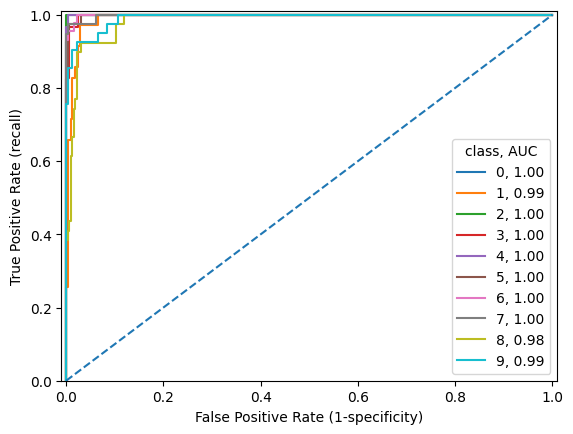

In [ ]:
# 0~9までの識別器について、ROCカーブを描く
# 8や9は他数字に比べてAUCが小さく、識別性能が悪いことが分かる
# 7と1は識別性能がほぼ同じ

for i in range(10):
    fpr, tpr, _ = roc_curve((y_test == i).astype(int),
                            test_score[:,i])
    plt.plot(fpr, tpr, label="{0}, {1:.2f}".format(i, auc(fpr, tpr)))

plt.plot([0, 1], [0, 1], linestyle='--')
plt.legend(loc="best", title="class, AUC")
plt.xlim([-0.01, 1.01])
plt.ylim([0.0, 1.01])
plt.ylabel('True Positive Rate (recall)')
plt.xlabel('False Positive Rate (1-specificity)');

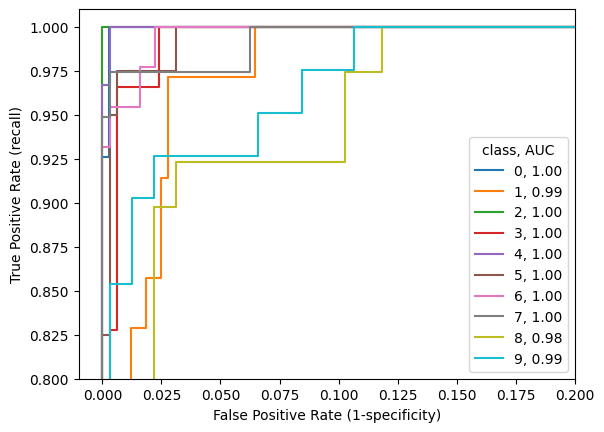

In [ ]:
# 左上の部分だけズーム
for i in range(10):
    fpr, tpr, _ = roc_curve((y_test == i).astype(int),
                            test_score[:,i])
    plt.plot(fpr, tpr, label="{0}, {1:.2f}".format(i, auc(fpr, tpr)))

plt.plot([0, 1], [0, 1], linestyle='--')
plt.legend(loc="best", title="class, AUC")
plt.xlim([-0.01, 0.2])
plt.ylim([0.8, 1.01])
plt.ylabel('True Positive Rate (recall)')
plt.xlabel('False Positive Rate (1-specificity)');

Text(0, 0.5, 'Precision')

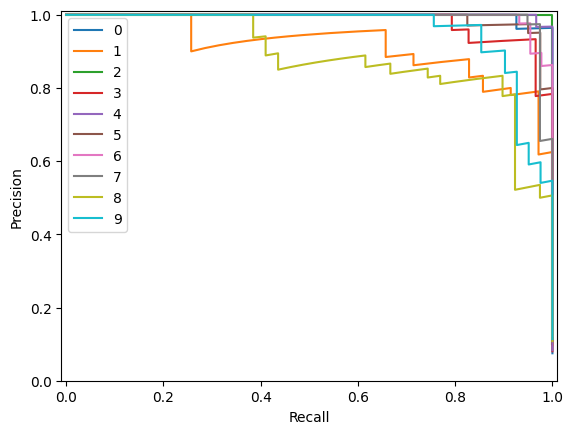

In [ ]:
# Precision-Racallカーブ
for i in range(10):
    precision, recall, _ = precision_recall_curve((y_test == i).astype(int),
                            test_score[:,i])
    plt.plot(recall, precision, label="{0}".format(i))

plt.legend(loc="best")
plt.xlim([-0.01, 1.01])
plt.ylim([0.0, 1.01])
plt.xlabel('Recall')
plt.ylabel('Precision')

In [ ]:
# mAP of PASCAL VOC by http://homepages.inf.ed.ac.uk/ckiw/postscript/ijcv_voc09.pdf

# APsには、各クラスのAveragePrecisionが入る
# mAPは各クラスのAverage Precisionの平均値

APs = []
for i in range(10):

    precision, recall, _ = precision_recall_curve((y_test == i).astype(int), test_score[:,i])
    APs.append( calc_AP(precision, recall) )

APs = np.array(APs)
mAP = APs.mean()

print(f'0~9までの各Average Precision：{APs}')
print("mAP = ", mAP)

0~9までの各Average Precision：[0.91590909 0.86383642 0.91818182 0.90671717 0.91666667 0.91686092
 0.92020202 0.91893939 0.84510644 0.90805001]
mAP =  0.9030469942100477


# 色々な識別器

## 7-1 多クラス分類

In [ ]:
import numpy as np
from sklearn.datasets import make_classification

X, y = make_classification(n_samples=20, # 20個生成
                           n_features=2, # 2次元
                           n_classes=3, # 3クラス
                           n_clusters_per_class=1,
                           n_informative=2,
                           n_redundant=0,
                           n_repeated=0,
                           random_state=8   # 乱数種（再現用）
                           )

In [ ]:
X, y

(array([[ 0.96625625, -1.16083   ],
        [-0.8956197 , -1.1904577 ],
        [-1.12244282, -1.49551075],
        [ 0.19381815,  0.71599453],
        [-0.81613811,  2.50559359],
        [-2.15730517, -0.38081097],
        [ 1.06520392, -1.06613765],
        [ 1.19850953, -1.19674272],
        [-1.28835506, -0.03837451],
        [-0.64803468,  2.03441301],
        [ 0.87697793, -0.61834883],
        [ 0.88418282, -0.59566976],
        [-2.08388511,  0.74825788],
        [ 0.9769429 , -1.30079452],
        [-1.71615661, -1.75243316],
        [-1.3018617 , -0.99043422],
        [-2.03271691,  0.38570548],
        [ 1.05087256, -1.47846795],
        [-0.43685499,  0.32573499],
        [-1.51666496, -1.16409828]]),
 array([1, 2, 2, 0, 0, 0, 1, 1, 2, 0, 1, 1, 0, 1, 2, 2, 0, 1, 0, 2]))

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.set_cmap(plt.cm.brg);

<Figure size 640x480 with 0 Axes>

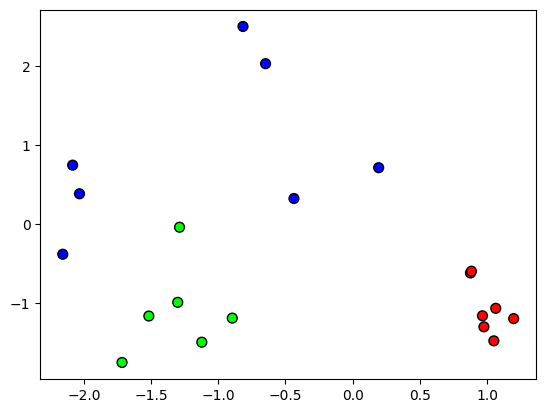

In [ ]:
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k');

In [ ]:
# 境界線を引く関数の定義

def plotBoundary(X, clf, mesh=True, cmap=plt.get_cmap()):

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    Z = clf.predict(np.c_[XX.ravel(), YY.ravel()]) # evaluate the value

    Z = Z.reshape(XX.shape) # just reshape

    if mesh:
        plt.pcolormesh(XX, YY, Z, zorder=-10, cmap=cmap)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

In [ ]:
# K近傍法でモデル生成
from sklearn import neighbors

clf = neighbors.KNeighborsClassifier(n_neighbors=1)

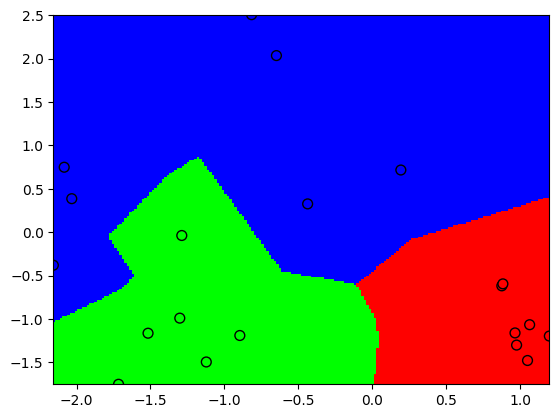

In [ ]:
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

plotBoundary(X, clf) # 境界線の描画

In [ ]:
# ロジスティック回帰
from sklearn import linear_model

clf = linear_model.LogisticRegression()

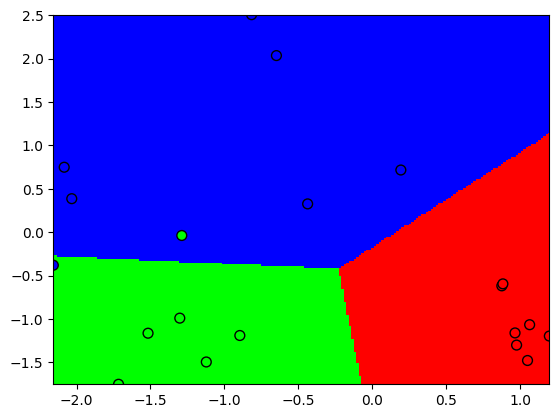

In [ ]:
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

plotBoundary(X, clf) # 境界線の描画

In [ ]:
#線形SVM
from sklearn import svm

clf = svm.SVC(kernel='linear', C=10)

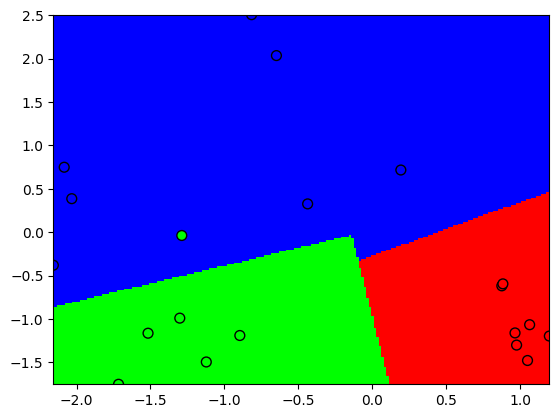

In [ ]:
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

plotBoundary(X, clf) # 境界線の描画

In [ ]:
# 非線形SVM
from sklearn import svm

clf = svm.SVC(kernel='rbf', C=10)

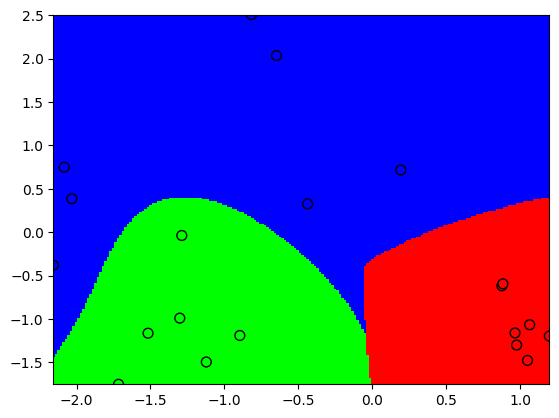

In [ ]:
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

plotBoundary(X, clf) # 境界線の描画

### ロジスティック回帰 One-vs-Rest

In [ ]:
# 境界線を引く関数の定義

def plotBoundary2(X, clf, boundary=True):
    colors = ['k'];
    linestyles = ['-'];
    levels = [0];

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()]) # evaluate the value

    n_classes = Z.shape[1]

    for c in range(n_classes):
        Zc = Z[:,c].reshape(XX.shape) # just reshape

        if boundary:
            plt.contour(XX, YY, Zc,
                        colors=colors,
                        linestyles=linestyles,
                        levels=levels) # draw lines (level=0:boundary)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

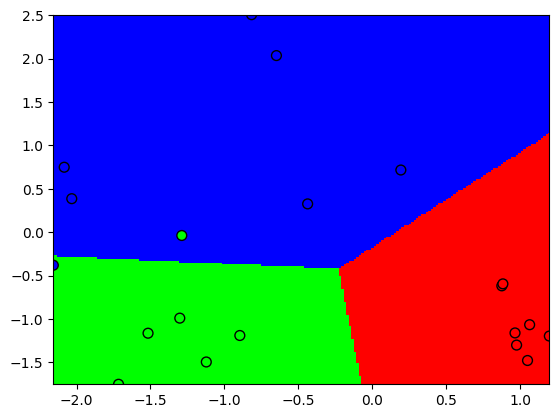

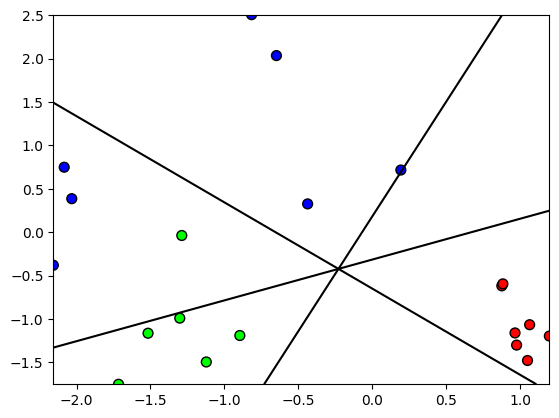

In [ ]:
# ロジスティック回帰の別の境界線で表現
clf = linear_model.LogisticRegression()

clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
plotBoundary(X, clf)
plt.show()

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
plotBoundary2(X, clf)



*   3クラスのロジスティック回帰は3つの直線をもとに識別できる
*   何も引数を記載しないとone-vs-rest（あるクラスとそれ以外）で実施される
*   そのためロジスティック回帰の多クラス問題は、内部で1クラスvsそれ以外の2クラス問題を解いていることと等しい



In [ ]:
# 境界線を引く関数の定義

def plotBoundary3(X, clf, mesh=True, boundary=True):
    colors = ['k'];
    linestyles = ['-.', '-', '--'];
    levels = [-1,0,1];
    cmaps = [plt.cm.Blues, plt.cm.Reds, plt.cm.Greens, plt.cm.Purples]

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()]) # evaluate the value
    print(Z.shape)
    n_classes = Z.shape[1]

    for c in range(n_classes):
        Zc = Z[:,c].reshape(XX.shape) # just reshape
        plt.show()
        if mesh:
            plt.pcolormesh(XX, YY, Zc, zorder=-10, cmap=cmaps[c])
            plt.colorbar()

        if boundary:
            plt.contour(XX, YY, Zc,
                        colors=colors,
                        linestyles=linestyles,
                        levels=levels)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

(40000, 3)


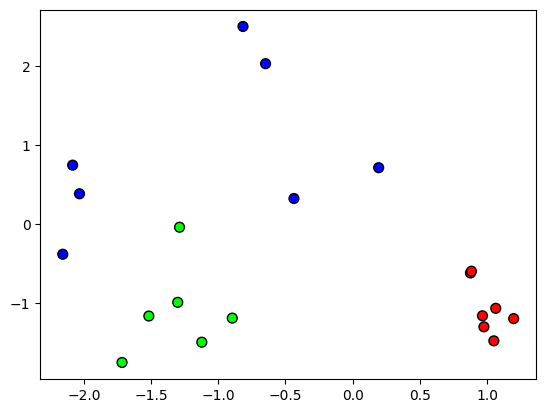

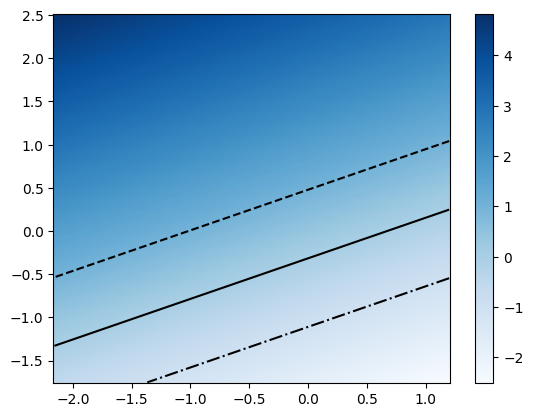

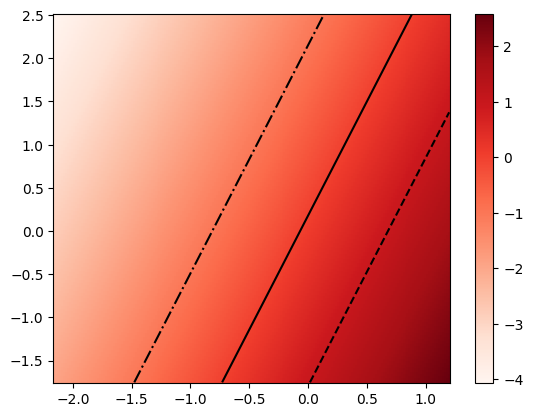

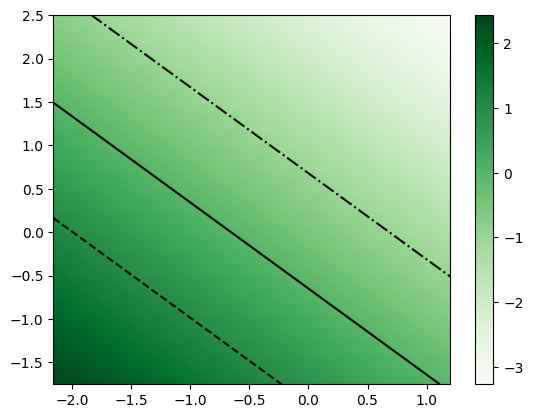

In [ ]:
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
plotBoundary3(X, clf)

In [ ]:
# 境界線を引く関数の定義

import numpy.ma as ma # MaskedArray

def plotBoundary4(X, clf, mesh=True, boundary=True):
    colors = ['k'];
    linestyles = ['-.', '-', '--'];
    levels = [-1,0,1];
    cmaps = [plt.cm.Blues, plt.cm.Reds, plt.cm.Greens, plt.cm.Purples]

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()]) # evaluate the value

    n_classes = Z.shape[1]

    Zmax = Z.argmax(axis=1).reshape(XX.shape)

    for c in range(n_classes):
        Zc = ma.array(Z[:,c].reshape(XX.shape), mask=(Zmax != c))

        if mesh:
            plt.pcolormesh(XX, YY, Zc, zorder=-10, cmap=cmaps[c])

        if boundary:
            plt.contour(XX, YY, Zc,
                        colors=colors,
                        linestyles=linestyles,
                        levels=levels)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)


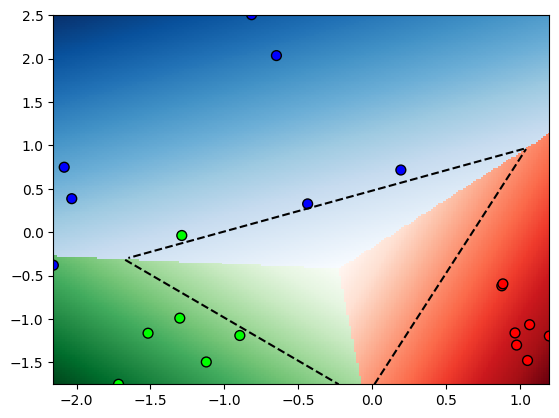

In [ ]:
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
plotBoundary4(X, clf)

### SVM One-vs-Rest

In [ ]:
# 警告を非表示にする（追加コード）
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore', UserWarning)

In [ ]:
# 線形SVM
clf = svm.SVC(kernel='linear',
              decision_function_shape='ovr', C=10)
clf.fit(X, y)

SVC(C=10, kernel='linear')

(40000, 3)


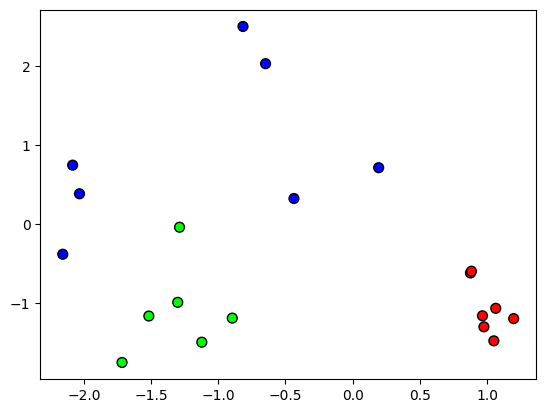

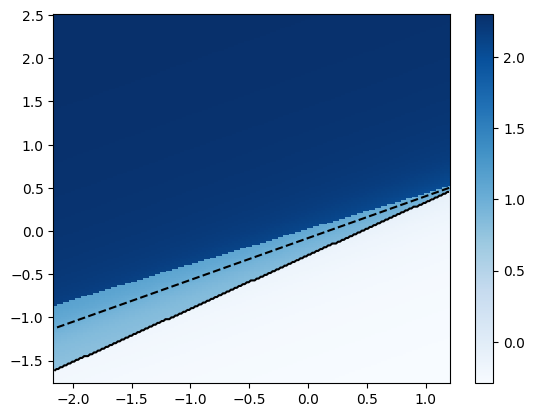

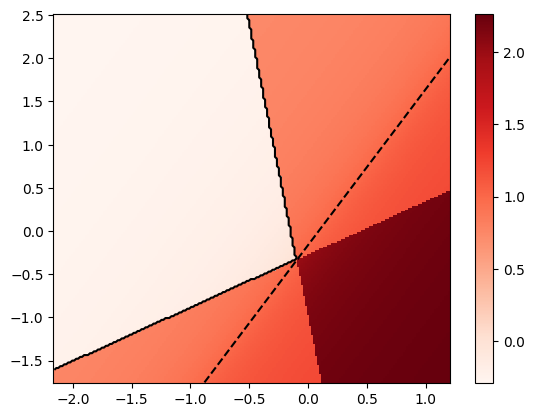

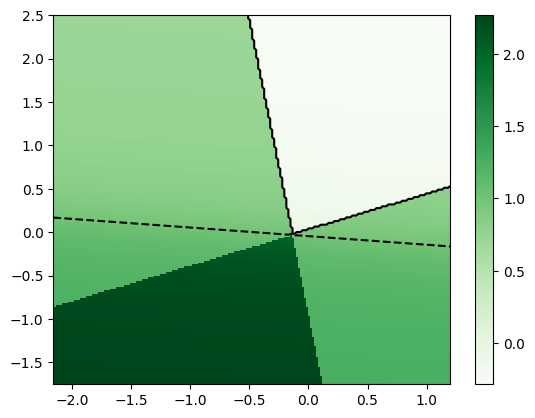

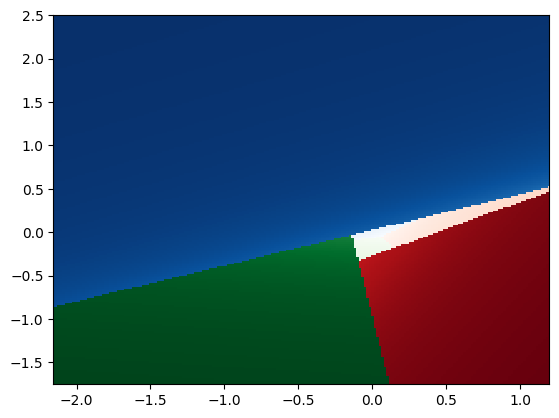

In [ ]:
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
plotBoundary3(X, clf)
plt.show()

plotBoundary4(X, clf)

In [ ]:
# 非線形SVM
clf = svm.SVC(kernel='rbf',
              decision_function_shape='ovr', C=10)
clf.fit(X, y)

SVC(C=10)

(40000, 3)


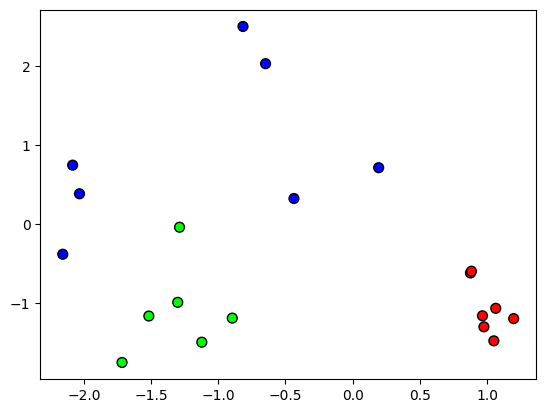

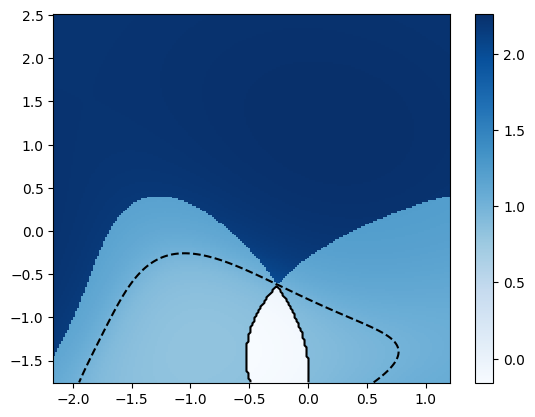

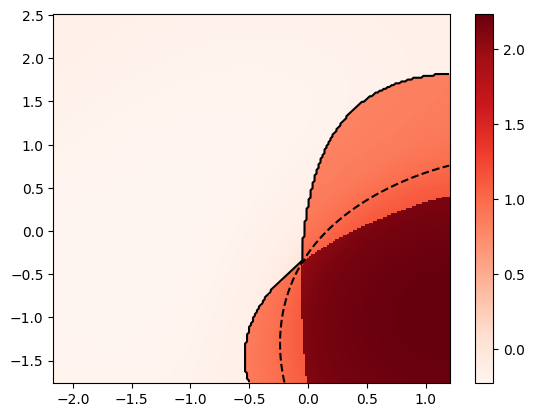

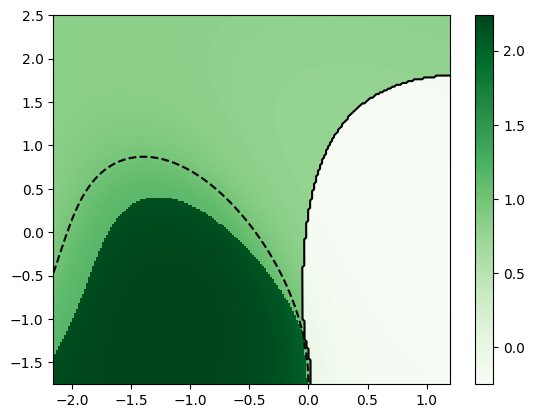

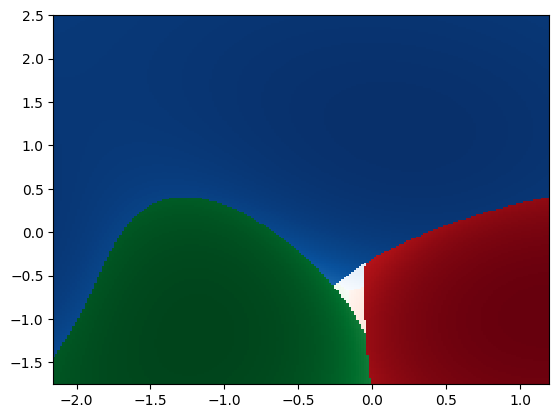

In [ ]:
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
plotBoundary3(X, clf)
plt.show()
plotBoundary4(X, clf)

### one-vs-one

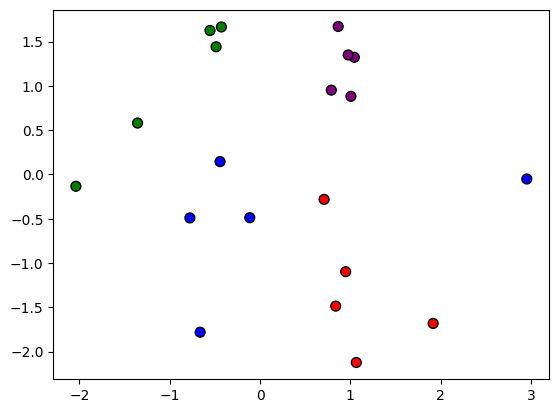

In [ ]:
X, y = make_classification(n_samples=20, # 20個生成
                           n_features=2, # 2次元
                           n_classes=4, # 4クラス
                           n_clusters_per_class=1,
                           n_informative=2,
                           n_redundant=0,
                           n_repeated=0,
                           random_state=8   # 乱数種（再現用）
                           )

from matplotlib.colors import ListedColormap as lcmap
brgp = lcmap(['blue','red','green','purple'])

plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap=brgp, edgecolors='k');

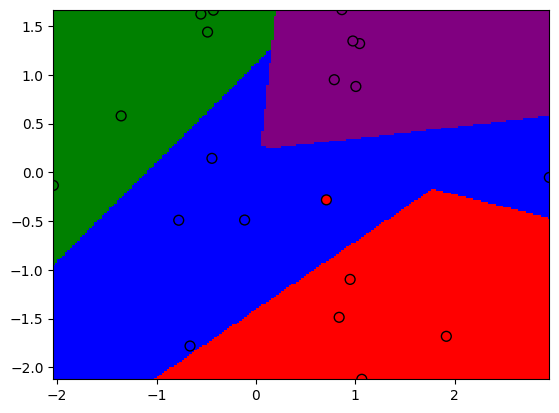

(40000, 4)


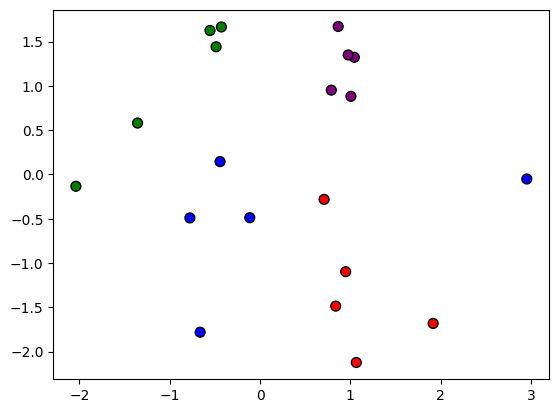

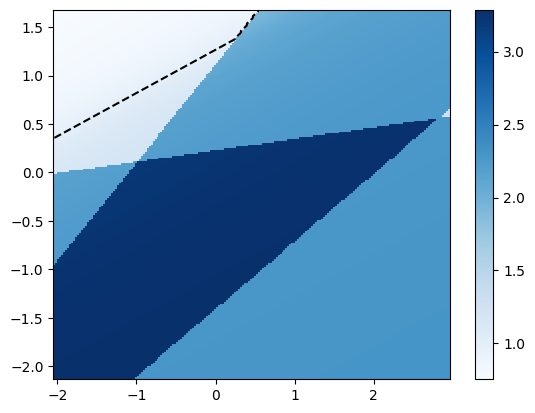

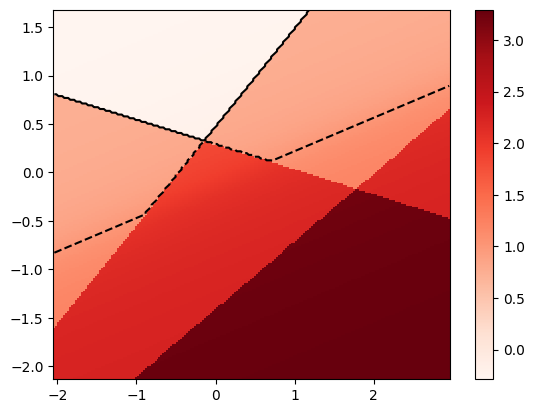

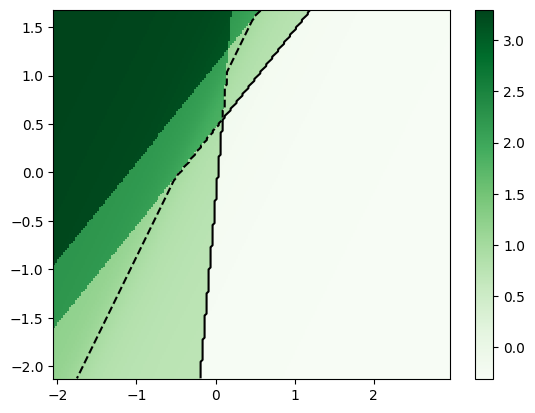

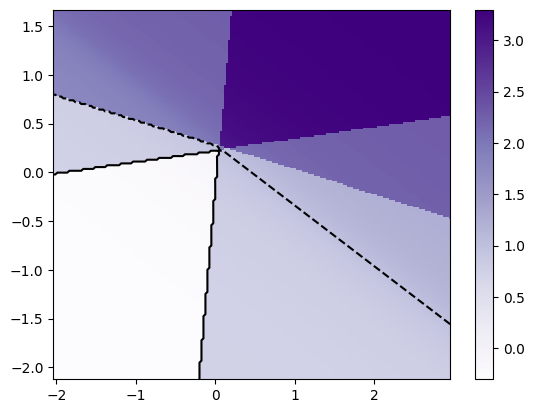

In [ ]:
# 線形SVMのOne-vs-rest
clf = svm.SVC(kernel='linear',
              decision_function_shape='ovr') # one-vs-rest, one-vs-all
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, cmap=brgp, edgecolors='k')
plotBoundary(X, clf, cmap=brgp)
plt.show()

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, cmap=brgp, edgecolors='k')
plotBoundary3(X, clf)

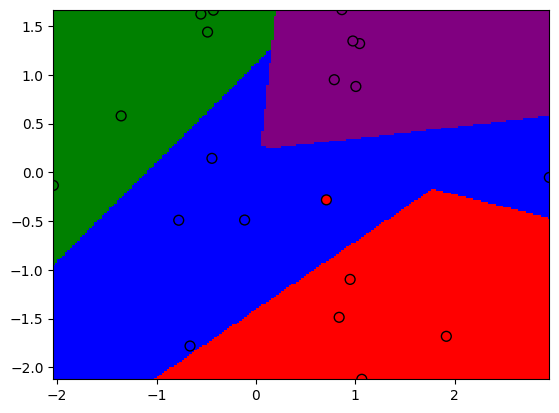

(40000, 6)


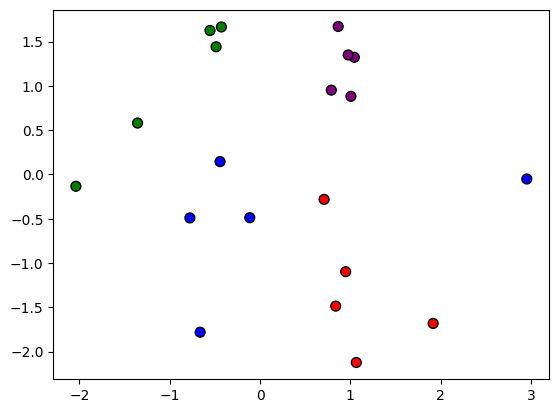

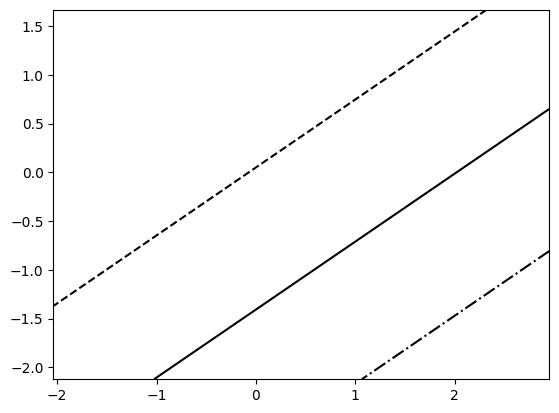

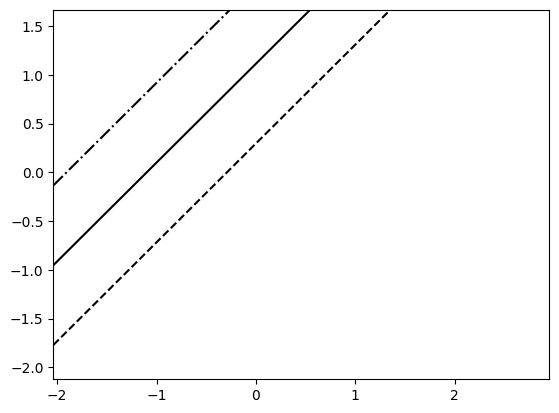

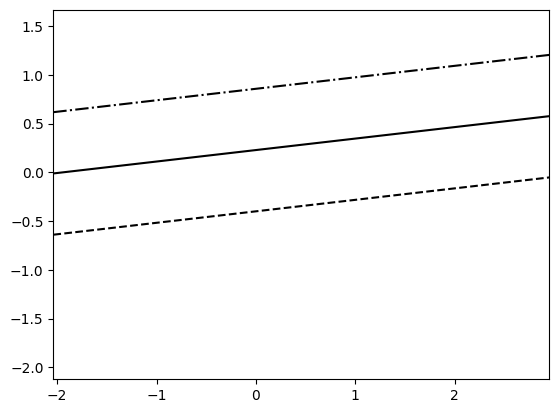

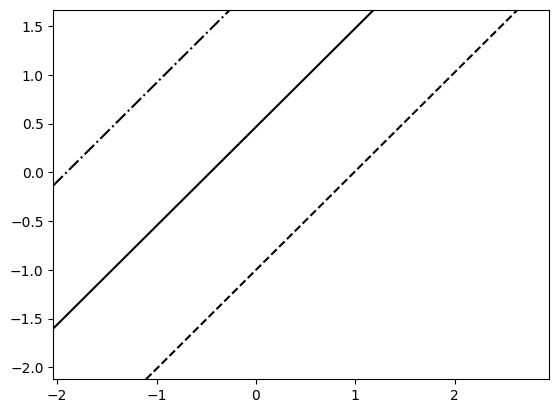

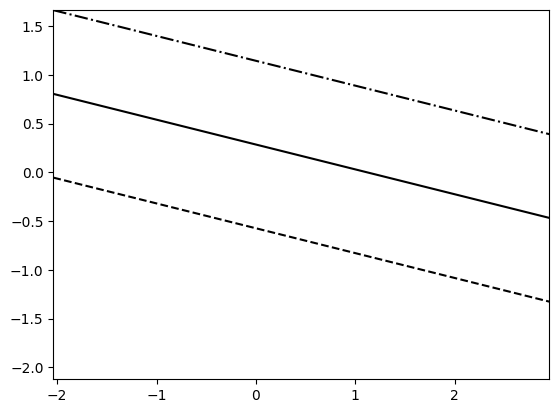

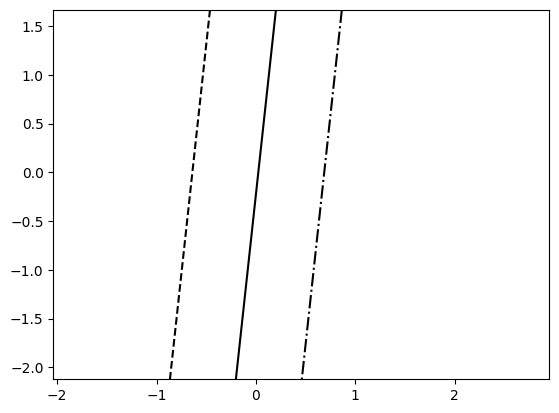

In [ ]:
# 線形SVMのOne-vs-One
clf = svm.SVC(kernel='linear',
              decision_function_shape='ovo') # one-vs-one
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, cmap=brgp, edgecolors='k')
plotBoundary(X, clf, cmap=brgp)
plt.show()

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, cmap=brgp, edgecolors='k')
plotBoundary3(X, clf, mesh=False)




*   One-vs-Oneは1:1で塗り分ける（例えば、1と2、2と3、1と4など）
*   4クラスから2個取り出すので、4C2（=6）通り



In [ ]:
from itertools import combinations

list(combinations([0,1,2,3], 2))

[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]

In [ ]:
list(combinations("ABCD", 2))

[('A', 'B'), ('A', 'C'), ('A', 'D'), ('B', 'C'), ('B', 'D'), ('C', 'D')]

In [ ]:
list(combinations("ABCDEFG", 2))

[('A', 'B'),
 ('A', 'C'),
 ('A', 'D'),
 ('A', 'E'),
 ('A', 'F'),
 ('A', 'G'),
 ('B', 'C'),
 ('B', 'D'),
 ('B', 'E'),
 ('B', 'F'),
 ('B', 'G'),
 ('C', 'D'),
 ('C', 'E'),
 ('C', 'F'),
 ('C', 'G'),
 ('D', 'E'),
 ('D', 'F'),
 ('D', 'G'),
 ('E', 'F'),
 ('E', 'G'),
 ('F', 'G')]

In [ ]:
clf

SVC(decision_function_shape='ovo', kernel='linear')

## 7-2 最近傍識別器(NN)、k近傍法

In [ ]:
import numpy as np
from sklearn.datasets import make_blobs

X, y = make_blobs(n_samples=50, # 20個生成
                  n_features=2, # 2次元
                  centers=5,    # クラスタ中心2個
                  cluster_std = .8, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.set_cmap(plt.cm.gist_ncar)

<Figure size 640x480 with 0 Axes>

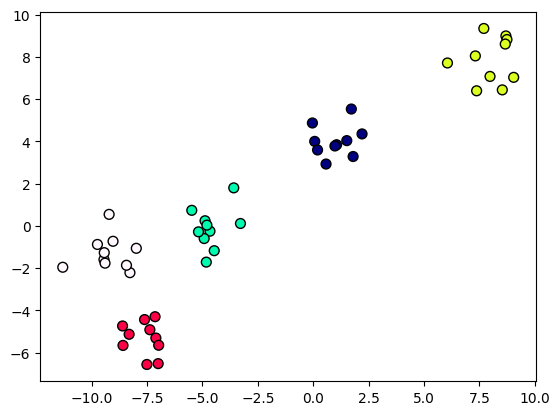

In [ ]:
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k');

In [ ]:
# 境界線を引く関数の定義

def plotBoundary(X, clf, mesh=True, cmap=plt.get_cmap()):

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    Z = clf.predict(np.c_[XX.ravel(), YY.ravel()]) # evaluate the value

    Z = Z.reshape(XX.shape) # just reshape

    if mesh:
        plt.pcolormesh(XX, YY, Z, zorder=-10, cmap=cmap)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

In [ ]:
from sklearn import neighbors

clf = neighbors.KNeighborsClassifier(n_neighbors=1)

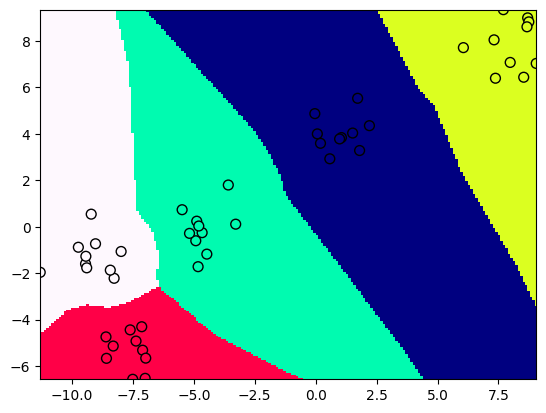

In [ ]:
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

plotBoundary(X, clf) # 境界線の描画

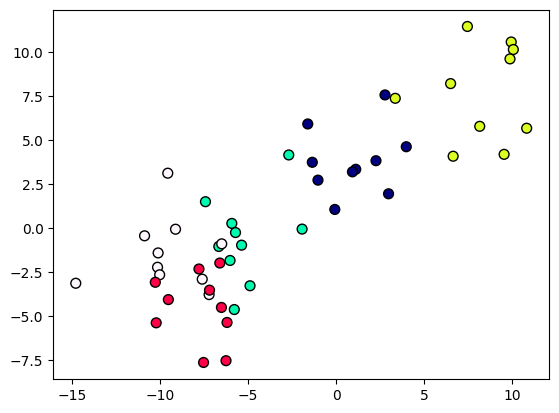

In [ ]:
# 別のサンプルを用意 → 上よりもサンプルが区別しにくい
X, y = make_blobs(n_samples=50, # 20個生成
                  n_features=2, # 2次元
                  centers=5,    # クラスタ中心2個
                  cluster_std =2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k');

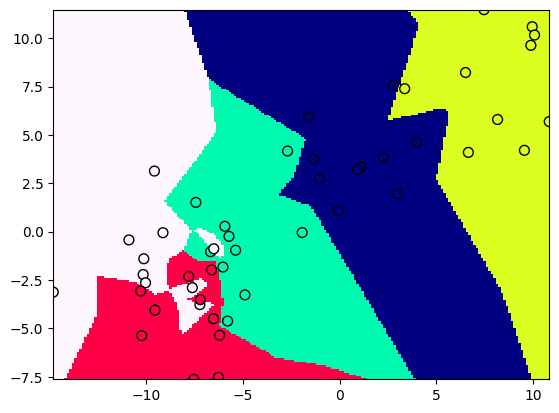

In [ ]:
clf = neighbors.KNeighborsClassifier(n_neighbors=1)
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

plotBoundary(X, clf) # 境界線の描画

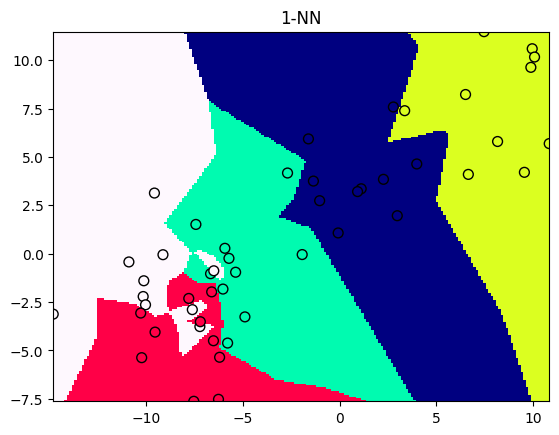

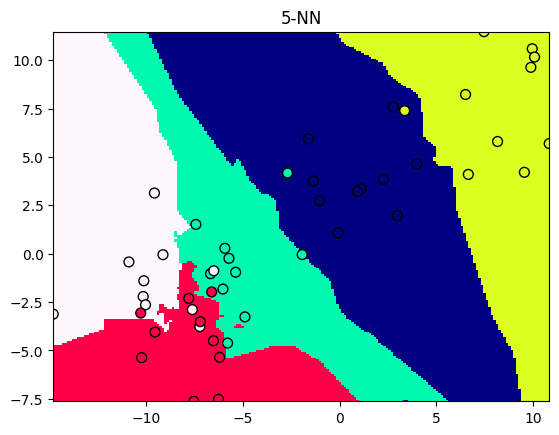

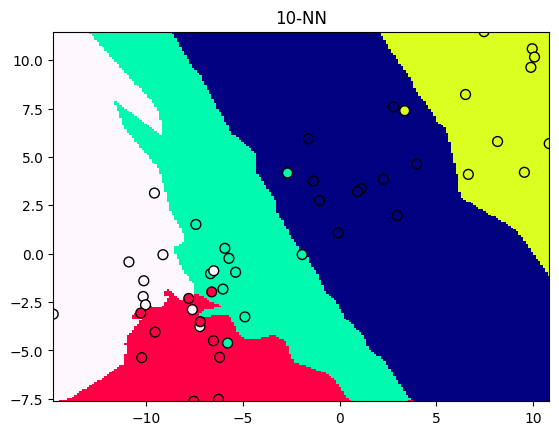

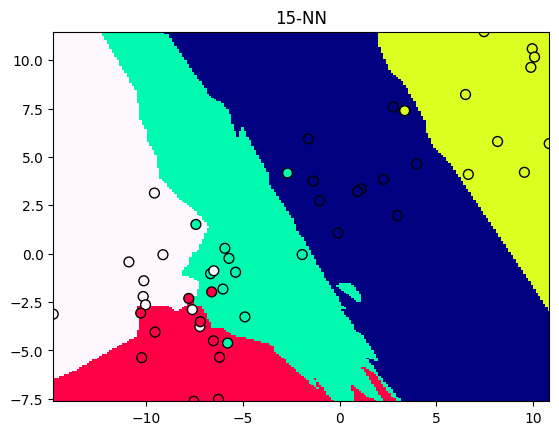

In [ ]:
# K近傍法は区別しにくいデータだと識別境界が複雑になる
# K を1,5,10,15にする識別境界がどうなるか確認
for n in [1, 5, 10, 15]:
    clf.n_neighbors = n
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
    plotBoundary(X, clf)
    plt.title("{0}-NN".format(n))
    plt.show()

In [ ]:
# 癌のデータでK近傍法
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
from sklearn import neighbors

clf = neighbors.KNeighborsClassifier(n_neighbors=1)
clf.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=1)

In [ ]:
clf.score(X_train, y_train)

1.0

In [ ]:
clf.score(X_test, y_test)

0.9122807017543859

In [ ]:
# 近傍の数(k)を1~20まで変えてスコアを見る
n_range = range(1,20)
scores = []
for n in n_range:
    clf.n_neighbors = n
    score = clf.score(X_test, y_test)
    print(n, score)
    scores.append(score)
scores = np.array(scores)

1 0.9122807017543859
2 0.8947368421052632
3 0.9122807017543859
4 0.9210526315789473
5 0.9385964912280702
6 0.9385964912280702
7 0.9473684210526315
8 0.9473684210526315
9 0.9649122807017544
10 0.9473684210526315
11 0.9649122807017544
12 0.9649122807017544
13 0.9649122807017544
14 0.9649122807017544
15 0.9649122807017544
16 0.9649122807017544
17 0.9649122807017544
18 0.9649122807017544
19 0.9649122807017544


(0.8, 1.0)

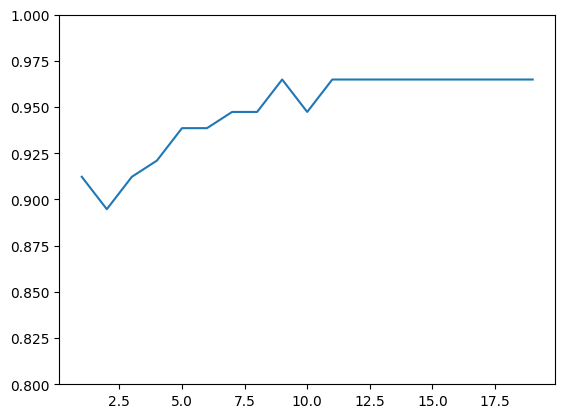

In [ ]:
plt.plot(n_range, scores)
plt.ylim(0.8, 1)

In [ ]:
# スケーリングしてKNN
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scale = scaler.transform(X_train)
clf.fit(X_train_scale, y_train)

KNeighborsClassifier(n_neighbors=1)

In [ ]:
X_test_scale = scaler.transform(X_test)

In [ ]:
clf = neighbors.KNeighborsClassifier(n_neighbors=1)
clf.fit(X_train_scale, y_train)

KNeighborsClassifier(n_neighbors=1)

In [ ]:
n_range = range(1,20)
scores2 = []
for n in n_range:
    clf.n_neighbors = n
    score = clf.score(X_test_scale, y_test)
    print(n, score)
    scores2.append(score)
scores2 = np.array(scores2)

1 0.9473684210526315
2 0.9385964912280702
3 0.9473684210526315
4 0.956140350877193
5 0.956140350877193
6 0.9824561403508771
7 0.9649122807017544
8 0.9736842105263158
9 0.9736842105263158
10 0.9824561403508771
11 0.9736842105263158
12 0.9736842105263158
13 0.9736842105263158
14 0.9736842105263158
15 0.9736842105263158
16 0.9736842105263158
17 0.9736842105263158
18 0.9736842105263158
19 0.9736842105263158


(0.8, 1.0)

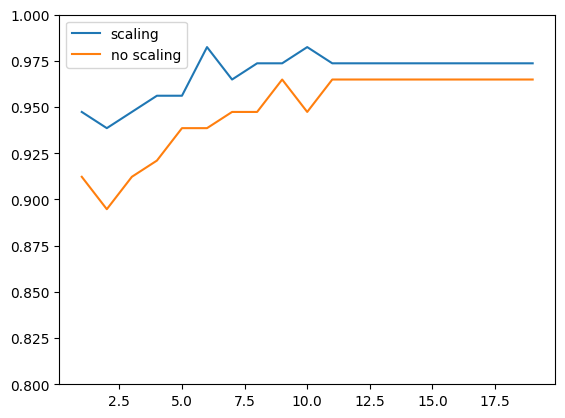

In [ ]:
plt.plot(n_range, scores2, label="scaling")
plt.plot(n_range, scores, label="no scaling")
plt.legend(loc='best')
plt.ylim(0.8, 1)

## 7-3 パーセプトロン

In [ ]:
import numpy as np
from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std = 2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.set_cmap(plt.cm.Paired);

<Figure size 640x480 with 0 Axes>

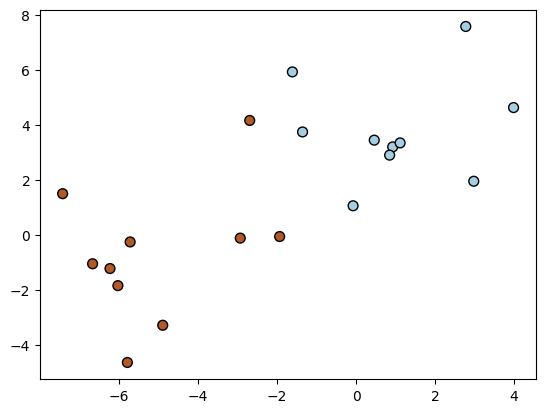

In [ ]:
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k');

In [ ]:
# 境界線を引く関数の定義

def plotBoundary(X, clf, mesh=True, boundary=True, n_neighbors=1):

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    Z = clf.predict(np.c_[XX.ravel(), YY.ravel()]) # evaluate the value

    Z = Z.reshape(XX.shape) # just reshape

    if mesh:
        plt.pcolormesh(XX, YY, Z, zorder=-10) # paint in 2 colors, if Z > 0 or not

    if boundary:
        plt.contour(XX, YY, Z,
                    colors='k', linestyles='-', levels=[0.5])

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

In [ ]:
from sklearn.linear_model import Perceptron

clf = Perceptron()
clf

Perceptron()

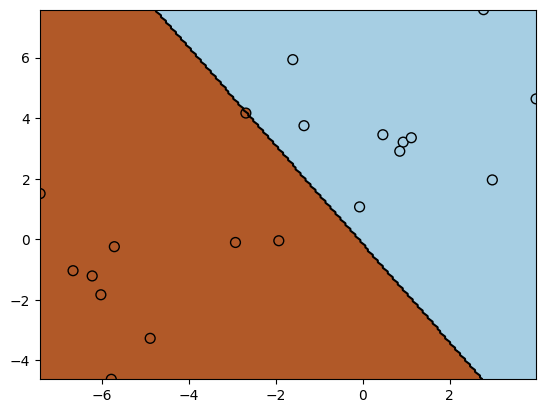

In [ ]:
clf.fit(X, y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

plotBoundary(X, clf) # 境界線の描画

In [ ]:
from IPython.display import IFrame
IFrame("https://www.geogebra.org/material/iframe/id/K8kugARA/width/939/height/469/border/888888/sri/true/sdz/true",
       width="939px", height="469px")



*   パーセプトロンは最初1点ずつランダムに識別境界を見ていく
*   現状の境界線からOK(識別範囲に入っているか)かOKじゃないか見ていく
*   領域が入ってない点の時は傾きと切片を変更する
*   すべての点を1周したら、もう1回同じ識別を実施する（合計2回全点見ていく）



In [ ]:
from IPython.display import IFrame
IFrame("https://www.geogebra.org/material/iframe/id/gMppVQV7/width/930/height/450/border/888888",
       width="930px", height="450px")

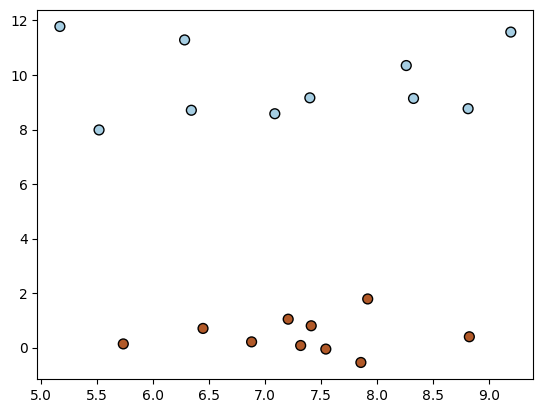

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=8   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k');

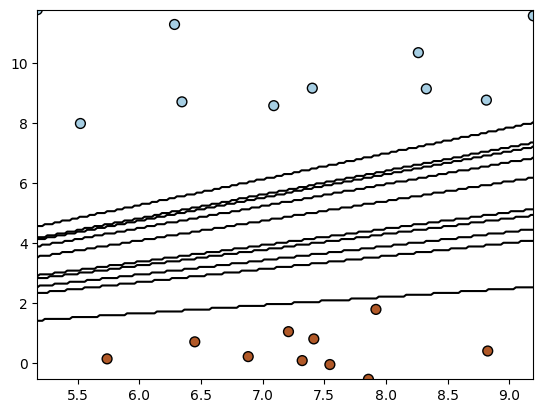

In [ ]:
for s in range(10):

    clf.random_state = s

    clf.fit(X,y)

    plotBoundary(X, clf, mesh=False)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

In [ ]:
clf.coef_, clf.intercept_

(array([[ 10.10985229, -12.7886002 ]]), array([1.]))

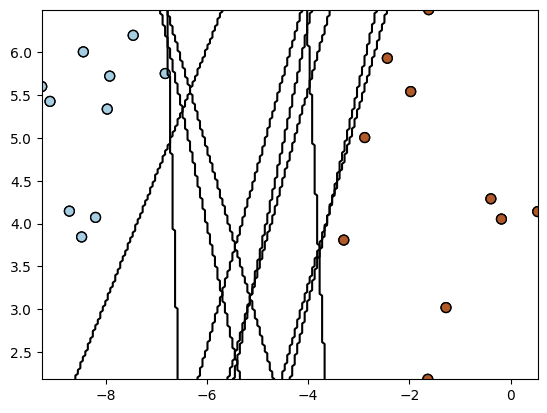

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=7   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k');

clf.warm_start = True

for s in range(10):

    clf.random_state = s

    clf.coef_, clf.intercept_ = np.random.rand(1,2) * 10 - 5, np.random.rand(1) * 10 + 30

    clf.fit(X,y)

    plotBoundary(X, clf, mesh=False)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

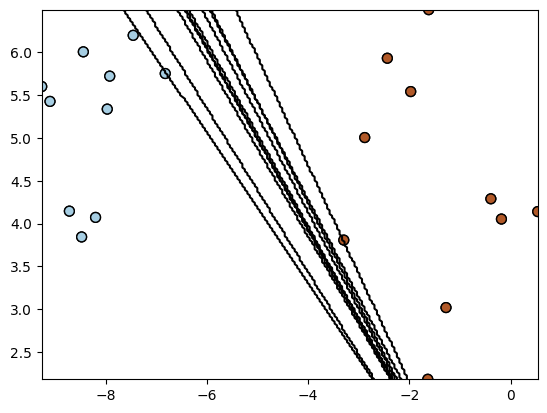

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=7   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k');

clf.warm_start = False

for s in range(10):

    clf.random_state = s

    clf.fit(X,y)

    plotBoundary(X, clf, mesh=False)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

In [ ]:
# 警告を非表示にする（追加コード）
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)
warnings.simplefilter('ignore', UserWarning)

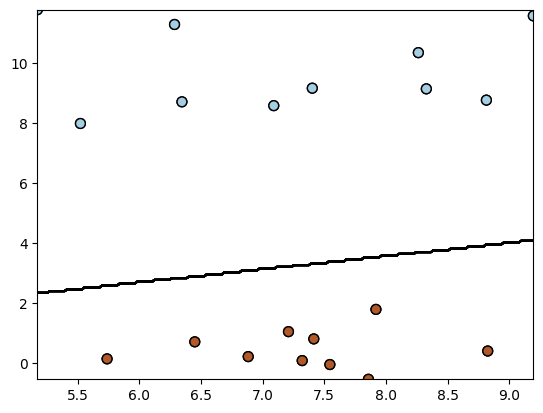

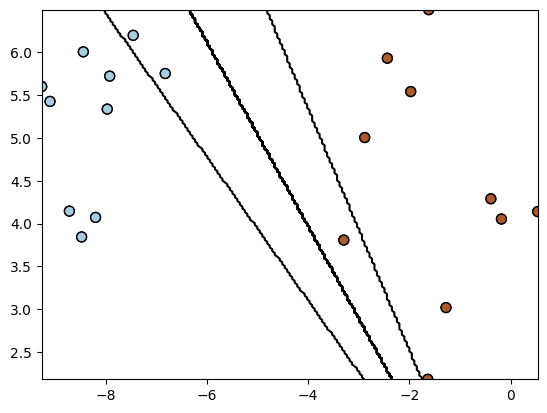

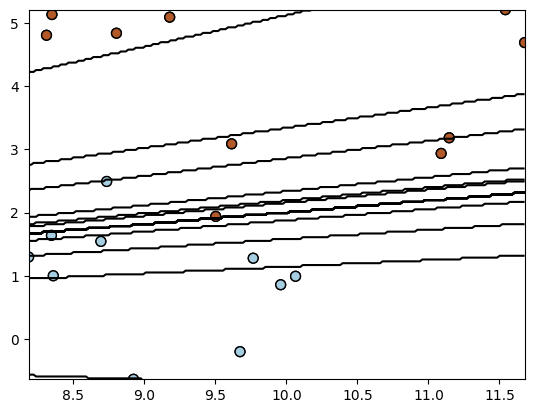

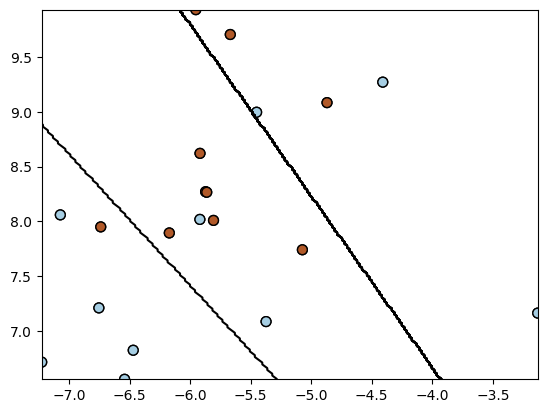

In [ ]:
clf = Perceptron()
clf.random_state = 4

for rs in [8,7,4,5]:

    X, y = make_blobs(n_samples=20, # 20個生成
                      n_features=2, # 2次元
                      centers=2,    # クラスタ中心2個
                      cluster_std =1, # クラスタの大きさ（標準偏差）
                      random_state=rs
                     )
    plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k');


    for i in range(1,20):

        # clf.n_iter = i # epochs
        clf.max_iter = i

        clf.fit(X,y)

        plotBoundary(X, clf, mesh=False)

    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
    plt.show()

In [ ]:
# 癌のデータでパーセプトロン

from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
clf = Perceptron() # default max_iter=5
clf.fit(X_train, y_train) # no scaling
clf.score(X_test, y_test)

0.6491228070175439

1 0.41228070175438597
2 0.4824561403508772
3 0.5789473684210527
4 0.5877192982456141
5 0.5964912280701754
6 0.6052631578947368
7 0.6140350877192983
8 0.6491228070175439
9 0.6491228070175439
10 0.6491228070175439
11 0.6578947368421053
12 0.8157894736842105
13 0.7105263157894737
14 0.7105263157894737
15 0.7280701754385965
16 0.7192982456140351
17 0.7192982456140351
18 0.8157894736842105
19 0.8157894736842105
20 0.7192982456140351
21 0.7280701754385965
22 0.7543859649122807
23 0.8157894736842105
24 0.7719298245614035
25 0.7894736842105263
26 0.7192982456140351
27 0.7719298245614035
28 0.7543859649122807
29 0.7719298245614035
30 0.7807017543859649
31 0.7631578947368421
32 0.7719298245614035
33 0.7807017543859649
34 0.7807017543859649
35 0.7807017543859649
36 0.8157894736842105
37 0.7631578947368421
38 0.7807017543859649
39 0.8157894736842105
40 0.7543859649122807
41 0.7719298245614035
42 0.7631578947368421
43 0.7719298245614035
44 0.8157894736842105
45 0.7719298245614035
46 0.8070175438596

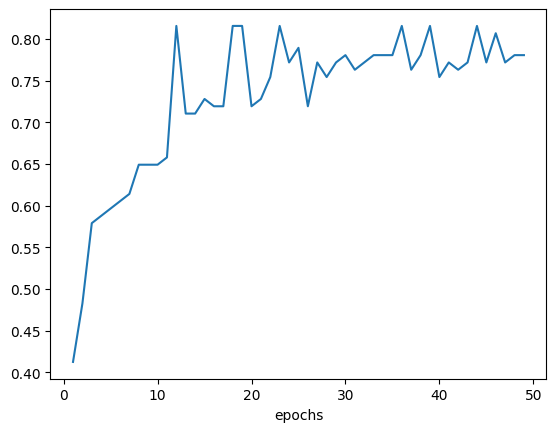

In [ ]:
# パーセプトロンの線形分離を複数回やるとどこに収束するのか？
# clf = Perceptron(warm_start=True, n_iter=1)
clf = Perceptron(warm_start=True, max_iter=1)

scores = []
n_range = range(1,50)
for n in n_range:
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    print(n, score)
    scores.append(score)
scores = np.array(scores)

plt.plot(n_range, scores)
plt.xlabel("epochs")
plt.show()

In [ ]:
# 正規化してみる
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scale = scaler.transform(X_train)
X_test_scale  = scaler.transform(X_test)

1 0.9122807017543859
2 0.9473684210526315
3 0.8245614035087719
4 0.8245614035087719
5 0.8596491228070176
6 0.8333333333333334
7 0.8333333333333334
8 0.9122807017543859
9 0.9736842105263158
10 0.9649122807017544
11 0.9649122807017544
12 0.9385964912280702
13 0.9649122807017544
14 0.9649122807017544
15 0.9649122807017544
16 0.9736842105263158
17 0.9649122807017544
18 0.9649122807017544
19 0.956140350877193
20 0.9035087719298246
21 0.9649122807017544
22 0.9649122807017544
23 0.9736842105263158
24 0.9736842105263158
25 0.956140350877193
26 0.956140350877193
27 0.9736842105263158
28 0.9824561403508771
29 0.9824561403508771
30 0.9736842105263158
31 0.9824561403508771
32 0.9824561403508771
33 0.956140350877193
34 0.956140350877193
35 0.9824561403508771
36 0.9473684210526315
37 0.9385964912280702
38 0.9736842105263158
39 0.956140350877193
40 0.9649122807017544
41 0.9649122807017544
42 0.9122807017543859
43 0.9298245614035088
44 0.9298245614035088
45 0.956140350877193
46 0.9298245614035088
47 0

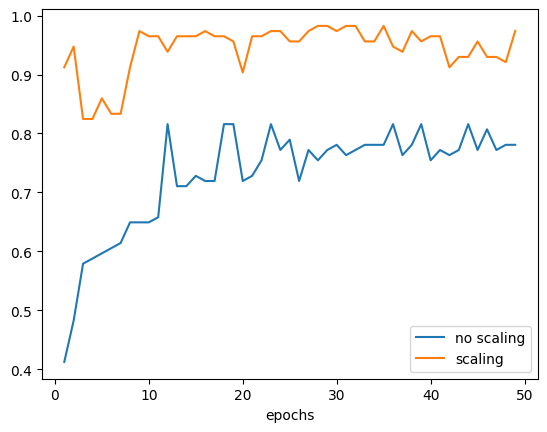

In [ ]:
# clf = Perceptron(warm_start=True, n_iter=1)
clf = Perceptron(warm_start=True, max_iter=1)

scores2 = []
n_range = range(1,50)
for n in n_range:
    clf.fit(X_train_scale, y_train)
    score = clf.score(X_test_scale, y_test)
    print(n, score)
    scores2.append(score)
scores2 = np.array(scores2)

plt.plot(n_range, scores, label="no scaling")
plt.plot(n_range, scores2, label="scaling")
plt.legend(loc="best")
plt.xlabel("epochs")
plt.show()

In [ ]:
# clf = Perceptron(n_iter=50)
clf = Perceptron(max_iter=50)
clf.fit(X_train_scale, y_train)
clf.score(X_test_scale, y_test)

0.9736842105263158

In [ ]:
clf = Perceptron() # default max_iter=5
clf.fit(X_train, y_train) # no scaling
clf.score(X_test, y_test)

0.6491228070175439

## 7-3 ロジスティック回帰

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.set_cmap(plt.cm.Paired)

<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np

from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std = 2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )

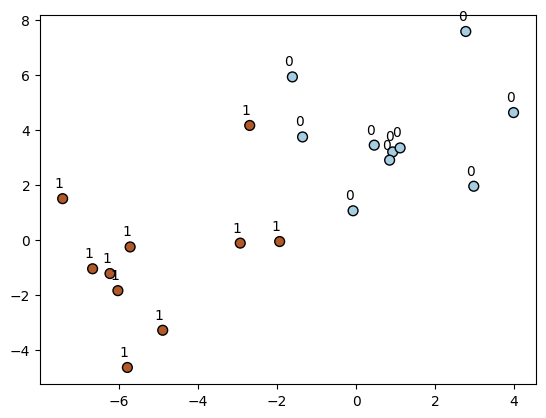

In [ ]:
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット
for l, dx, dy in zip(y, X[:,0], X[:, 1]):
    plt.annotate(l, xy=(dx-0.2, dy+0.4))

In [ ]:
# 境界線を引く関数の定義

def plotBoundary(X, clf, mesh=True, boundary=True, type='predict', clim=(None, None)):

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    if type == 'predict':
        Z = clf.predict(np.c_[XX.ravel(), YY.ravel()])
    else: # 'value', 'probability'
        Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()])

    Z = Z.reshape(XX.shape) # just reshape

    if mesh:
        if type == 'predict':
            plt.pcolormesh(XX, YY, Z, zorder=-10)
        else:
            if type == "probability":
                Z = 1 / (1 + np.exp(-Z)) # sigmoid
            plt.pcolormesh(XX, YY, Z, zorder=-10, cmap=plt.cm.bwr)
            plt.colorbar()
            plt.clim(clim[0], clim[1])

    if boundary:
        level = [0.5]
        if type == "probability":
            level = [0.5]
        plt.contour(XX, YY, Z,
                    colors='k', linestyles='-', levels=level)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

In [ ]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression()

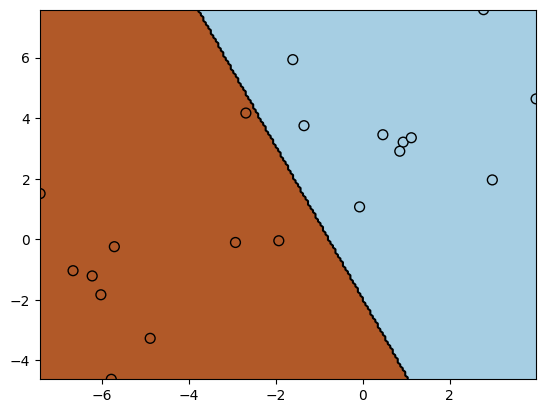

In [ ]:
clf.fit(X,y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット

plotBoundary(X, clf) # 境界線の描画

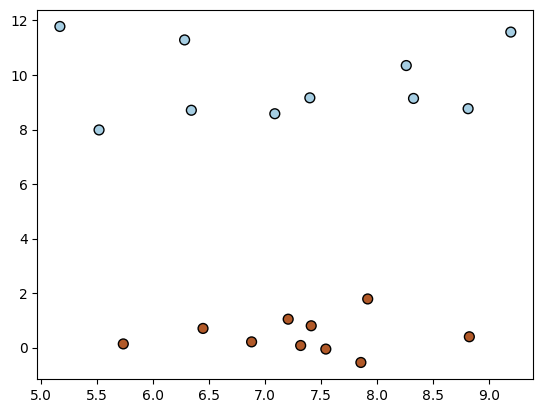

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=8   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

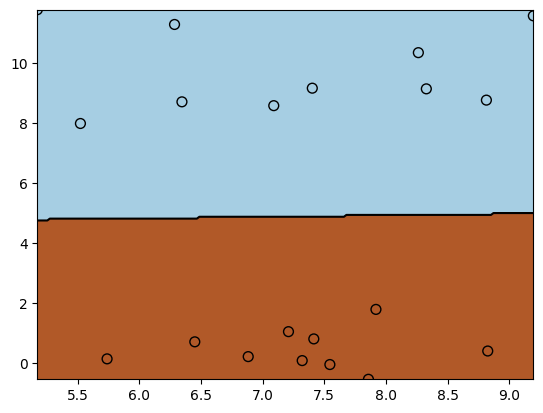

In [ ]:
clf = LogisticRegression()

clf.fit(X,y)

plotBoundary(X, clf)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

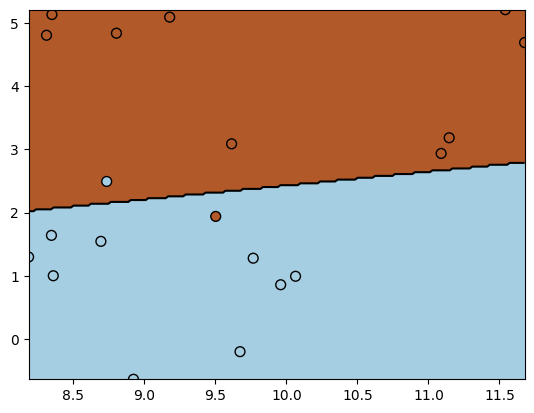

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=4   # 乱数種（再現用）
                 )

clf = LogisticRegression(solver='liblinear')


clf.fit(X,y)

plotBoundary(X, clf)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

In [ ]:
# ロジスティック回帰は直線を引くこと

from IPython.display import IFrame
IFrame("https://www.geogebra.org/material/iframe/id/Nc8s96Sc/width/903/height/549/border/888888/sri/true/sdz/true",
       width="903px", height="549px")

In [ ]:
# ロジスティック回帰は以下のような、係数が負の指数関数のような損失関数を使う
# 領域が合っていても、少しのペナルティを与えるという意味
from IPython.display import IFrame
IFrame("https://www.geogebra.org/material/iframe/id/Ge9pjBJU/width/930/height/450/border/888888/sri/true/sdz/true",
       width="930px", height="450px")

In [ ]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.956140350877193

In [ ]:
# ロジスティック回帰にはいろいろなパラメータがある
# その中でもCといｙパラメータが重要なので、変更し精度確認
clf.C = 1e-3
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9385964912280702

In [ ]:
clf

LogisticRegression(C=0.001, solver='liblinear')

In [ ]:
clf = LogisticRegression(solver='liblinear')
clf.fit(X_train, y_train)
clf.predict(X_test)

array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0,
       1, 0, 0, 1])

In [ ]:
# 識別平面からどれぐらい離れているか出てくる
X_test_value = clf.decision_function(X_test)

In [ ]:
X_test_value

array([ -4.83716095,   3.4631567 ,   6.15452304,   1.49413799,
         9.41646986,   5.82186711,   4.93025796,   6.40315622,
         3.31599033,   8.45898343,   0.45700244,   1.66960922,
         5.52252588,  -1.18967151,   1.40952022,  -4.71784071,
         4.18544711, -20.2628693 ,  -6.472025  , -26.69458511,
       -10.32038267,  -2.30172469,   6.3965982 ,   4.49274195,
        -4.93247836,   4.55807097,   6.2738693 ,  -1.49351051,
         5.72255984, -24.01735232,   7.93066487, -17.78022607,
         0.55945729,  -7.50950191,   8.56264081,  -6.51894423,
         2.4895584 , -13.16325765,   5.44804012,  -7.96552888,
        -2.84709246,   5.45529573,  -6.16112288,   7.03354346,
        -2.62277403, -27.69740066,   8.10275886,   3.53096902,
         6.71676814,  -7.99586953, -12.47131253,  -0.66179179,
       -14.75443302,   5.44151454,   4.76640214,   6.96977719,
         4.20574311,   3.71228808,   4.06892289, -38.48626415,
        -4.18016108,  -9.84847183,   6.1668715 ,   5.35

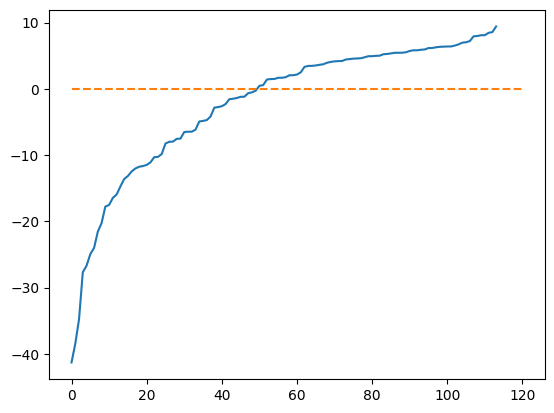

In [ ]:
plt.plot(np.sort(X_test_value))
plt.plot([0,120], [0,0], linestyle='--')

(0.0, 1.0)

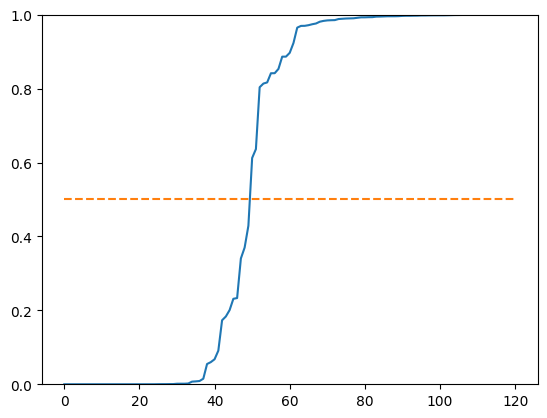

In [ ]:
# シグモイド関数の定義
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

plt.plot(np.sort(sigmoid(X_test_value)))

plt.plot([0, 120], [0.5, 0.5], linestyle='--')
plt.ylim(0,1)

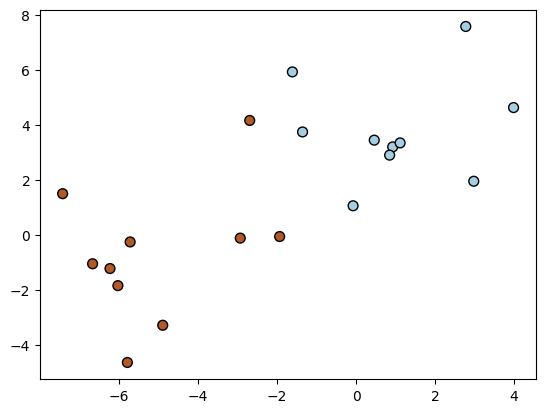

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std = 2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

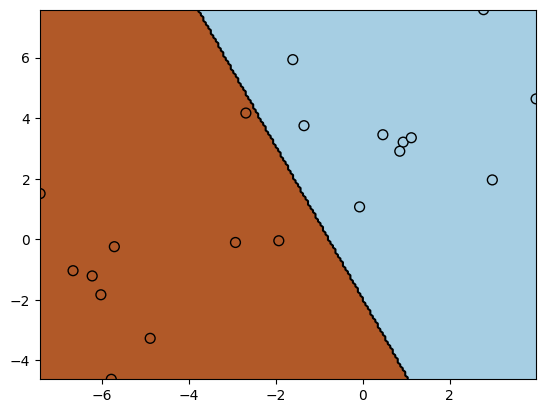

In [ ]:
clf = LogisticRegression()

clf.fit(X,y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット

plotBoundary(X, clf) # 境界線の描画

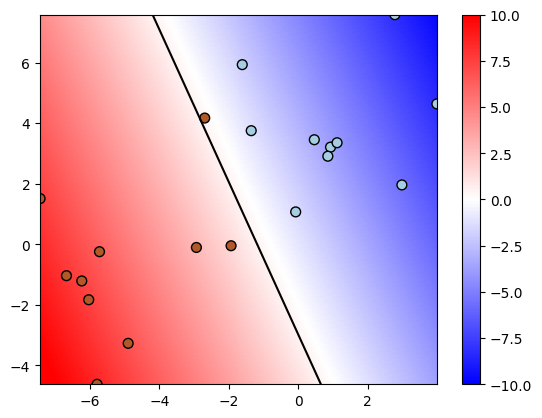

In [ ]:
# シグモイド関数で各サンプルが領域に収まる確率を定義する
# まずは簡単に直線からの距離を表示
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット

plotBoundary(X, clf, type="value", clim=(-10, 10))

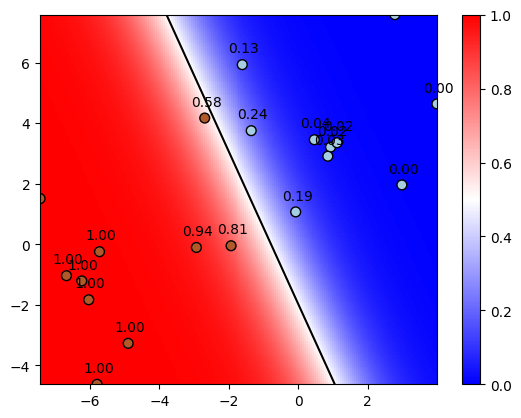

In [ ]:
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット

plotBoundary(X, clf, type="probability", clim=(0, 1))

X_value = clf.decision_function(X)

for l, dx, dy in zip(X_value, X[:,0], X[:, 1]):
    plt.annotate("{0:.2f}".format(sigmoid(l)), xy=(dx-0.4, dy+0.4))

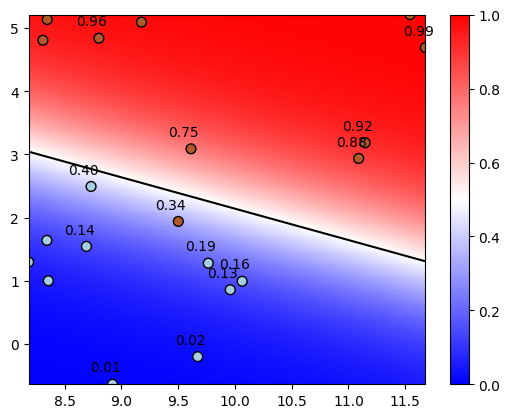

In [ ]:
# サンプルを間違った例で確率を定義するとどうなるか？
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=4   # 乱数種（再現用）
                 )

clf = LogisticRegression()

clf.fit(X,y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

X_value = clf.decision_function(X)

plotBoundary(X, clf, type="probability", clim=(0, 1))

for l, dx, dy in zip(X_value, X[:,0], X[:, 1]):
    plt.annotate("{0:.2f}".format(sigmoid(l)), xy=(dx-0.2, dy+0.2))

## 7-4 SVM

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.set_cmap(plt.cm.Paired)

<Figure size 640x480 with 0 Axes>

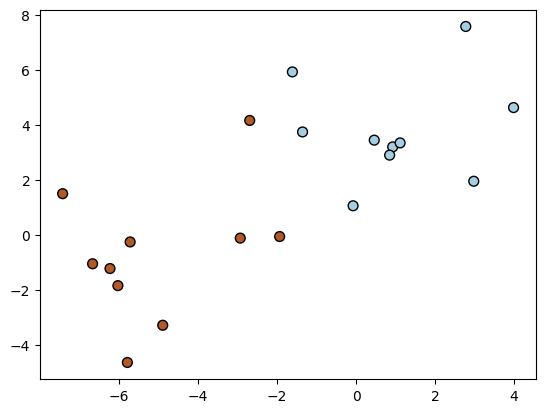

In [ ]:
import numpy as np
from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std = 2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )

plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

In [ ]:
# 境界線を引く関数の定義

def plotBoundary(X, clf, mesh=True, boundary=True, type='predict', clim=(None, None)):

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    if type == 'predict':
        Z = clf.predict(np.c_[XX.ravel(), YY.ravel()])
    elif type == 'probability':
        Z = np.exp(clf.predict_log_proba(np.c_[XX.ravel(), YY.ravel()]))[:, 1]
    else:
        Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()])

    Z = Z.reshape(XX.shape) # just reshape

    if mesh:
        if type == 'predict':
            plt.pcolormesh(XX, YY, Z, zorder=-10)
        else:
            plt.pcolormesh(XX, YY, Z, zorder=-10, cmap=plt.cm.bwr)
            plt.colorbar()
            plt.clim(clim[0], clim[1])

    if boundary:
        level = [0.5]
        if type == "probability":
            level = [0.5]
        plt.contour(XX, YY, Z,
                    colors='k', linestyles='-', levels=level)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

In [ ]:
# SVCはSVMのCrasificationを行う識別器
from sklearn.svm import SVC

clf = SVC(kernel='linear')

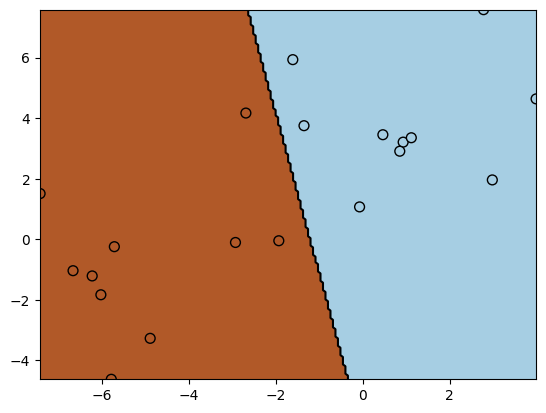

In [ ]:
clf.fit(X,y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット

plotBoundary(X, clf) # 境界線の描画

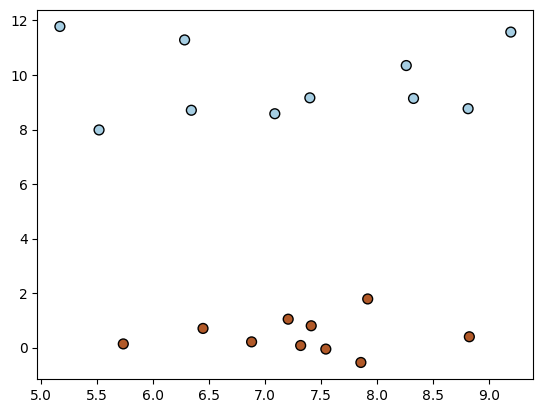

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=8   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

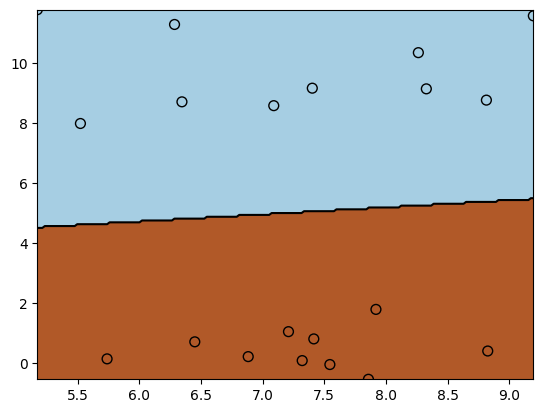

In [ ]:
clf.fit(X,y)

plotBoundary(X, clf)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

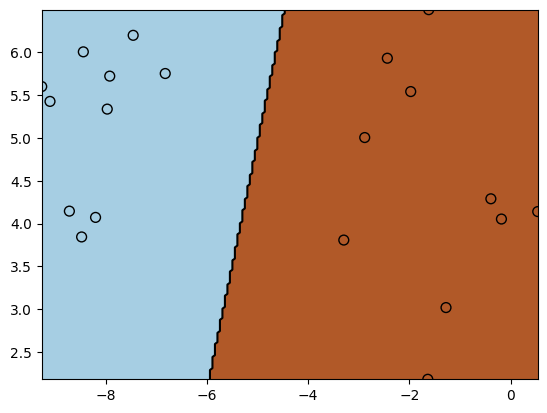

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=7   # 乱数種（再現用）
                 )
clf.fit(X,y)

plotBoundary(X, clf)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

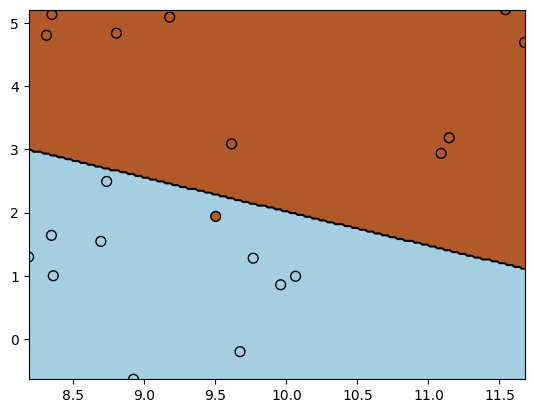

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=4   # 乱数種（再現用）
                 )

clf.fit(X,y)

plotBoundary(X, clf)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

In [ ]:
# SVMの損失関数はパーセプトロンに似たものを使う
# ただし、正のものであっても一部損失をつけている（0-約0.3のマージン領域）
from IPython.display import IFrame
IFrame("https://www.geogebra.org/material/iframe/id/sqPXpNUQ/width/994/height/536/border/888888/sri/true/sdz/true",
       width="994px", height="536px")

In [ ]:
def plotSVMBoundary(X, clf, mesh=True, boundary=True):

    # if SVM, draw margine lines
    colors = ['k']*3
    linestyles = ['-']*3
    levels = [-1, 0, 1]
    # if SVM, plot support vecters
    plt.scatter(clf.support_vectors_[:, 0],
                clf.support_vectors_[:, 1],
                s=80, facecolors='none', edgecolors='k')

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid
    Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()]) # evaluate the value
    Z = Z.reshape(XX.shape) # just reshape

    if mesh:
        plt.pcolormesh(XX, YY, Z > 0, cmap=plt.cm.Paired, zorder=-10)
    if boundary:
        plt.contour(XX, YY, Z,
                    colors=colors,
                    linestyles=linestyles,
                    levels=levels) # draw lines (level=0:boundary, level=+-1:margine lines)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

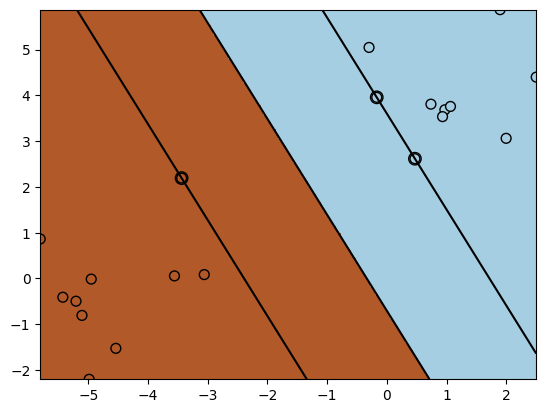

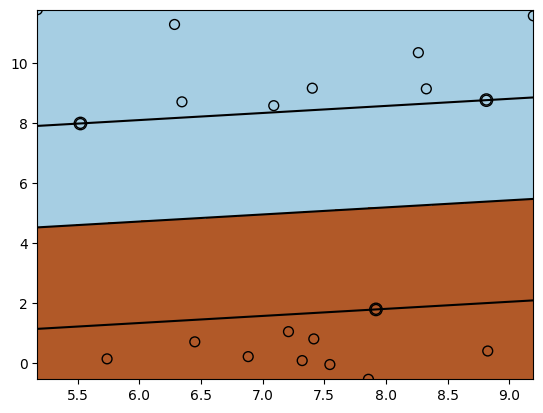

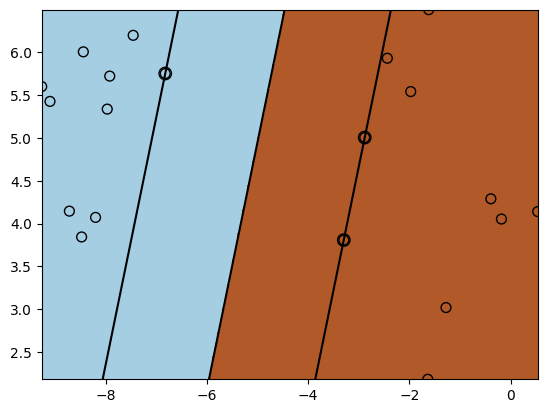

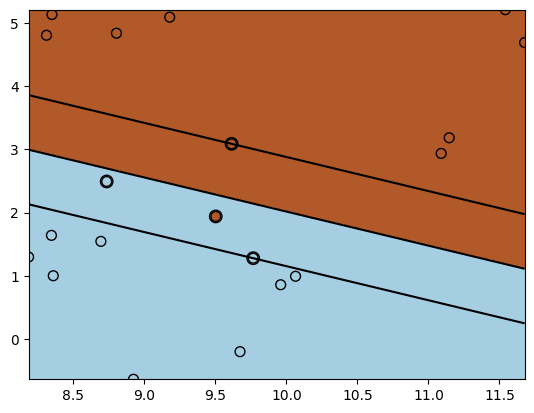

In [ ]:
clf = SVC(kernel='linear')

for rs in [3,8,7,4]:

    X, y = make_blobs(n_samples=20, # 20個生成
                      n_features=2, # 2次元
                      centers=2,    # クラスタ中心2個
                      cluster_std =1, # クラスタの大きさ（標準偏差）
                      random_state=rs   # 乱数種（再現用）
                     )
    clf.fit(X,y)

    plotSVMBoundary(X, clf)

    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

    plt.show()

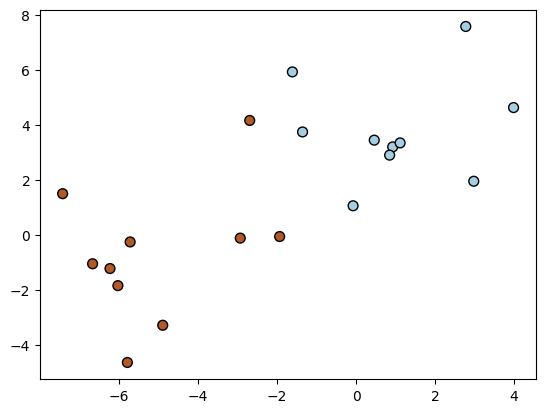

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std = 2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

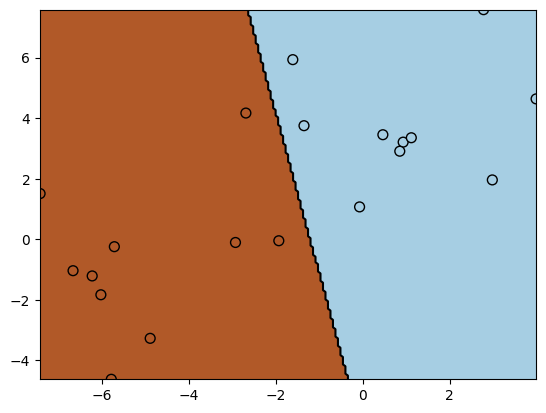

In [ ]:
clf.probability = True
clf.fit(X,y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット

plotBoundary(X, clf) # 境界線の描画

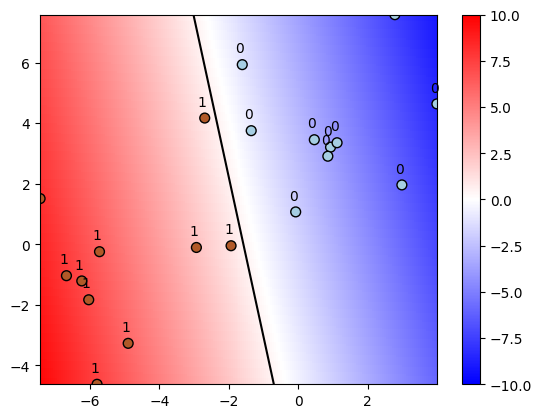

In [ ]:
# 境界線からの距離をプロット
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット

plotBoundary(X, clf, type="value", clim=(-10, 10))

for l, dx, dy in zip(y, X[:,0], X[:, 1]):
    plt.annotate(l, xy=(dx-0.2, dy+0.4)) # plot label

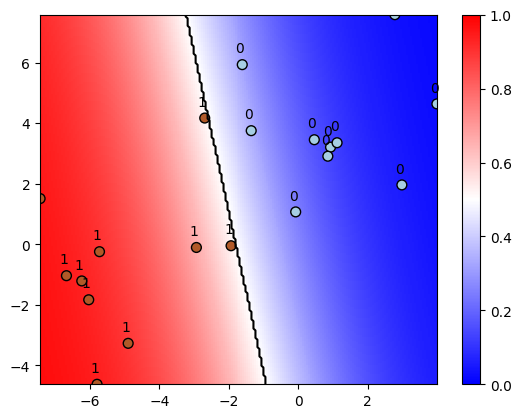

In [ ]:
# type="probability"にすることで、確率を示す
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット

plotBoundary(X, clf, type="probability", clim=(0,1))

for l, dx, dy in zip(y, X[:,0], X[:, 1]):
    plt.annotate(l, xy=(dx-0.2, dy+0.4)) # plot label

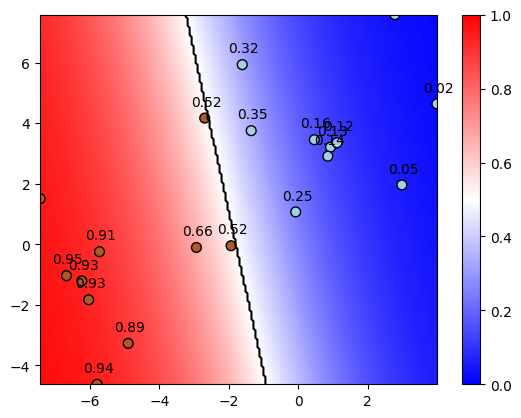

In [ ]:
# 一度logをを取ってから指数関数にすることで確率の詳細値になる
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット

plotBoundary(X, clf, type="probability", clim=(0,1))

X_test_value = np.exp(clf.predict_log_proba(X))[:, 1]

for l, dx, dy in zip(X_test_value, X[:,0], X[:, 1]):
    plt.annotate("{0:.2f}".format(l), xy=(dx-0.4, dy+0.4)) # plot probabilities

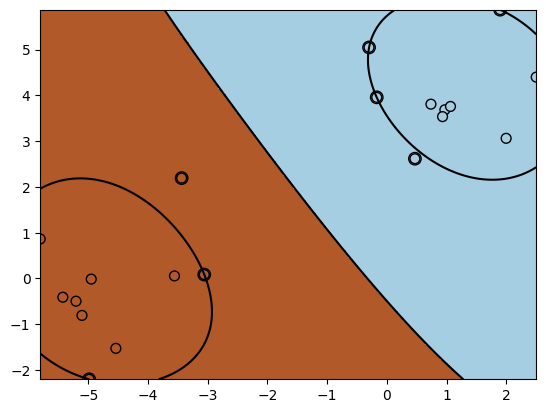

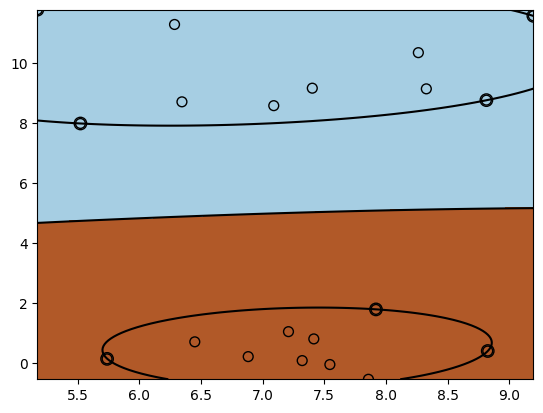

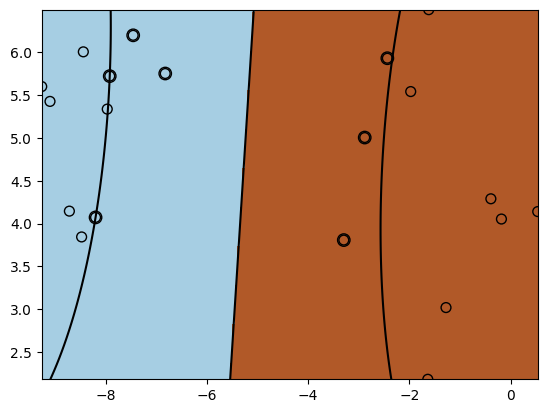

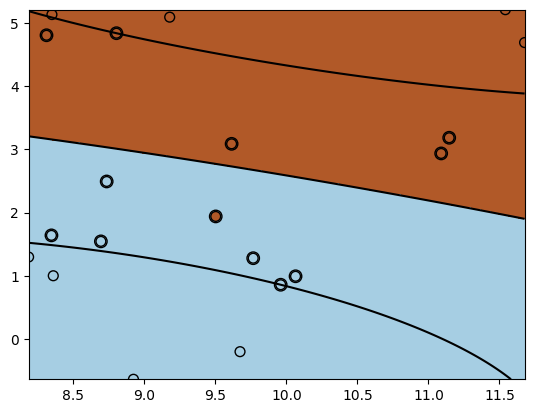

In [ ]:
# 非線形SVM：kernel=rbf
for rs in [3,8,7,4]:

    X, y = make_blobs(n_samples=20, # 20個生成
                      n_features=2, # 2次元
                      centers=2,    # クラスタ中心2個
                      cluster_std =1, # クラスタの大きさ（標準偏差）
                      random_state=rs   # 乱数種（再現用）
                     )

    clf.kernel = 'rbf' # default

    clf.fit(X,y)
    plotSVMBoundary(X, clf, mesh=True)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

    plt.show()

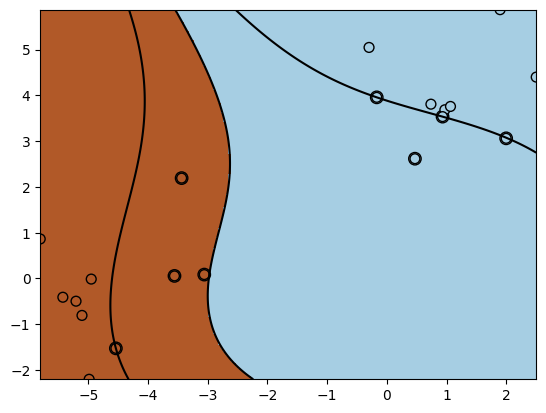

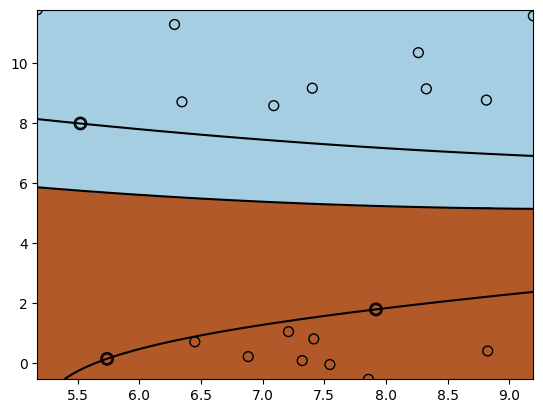

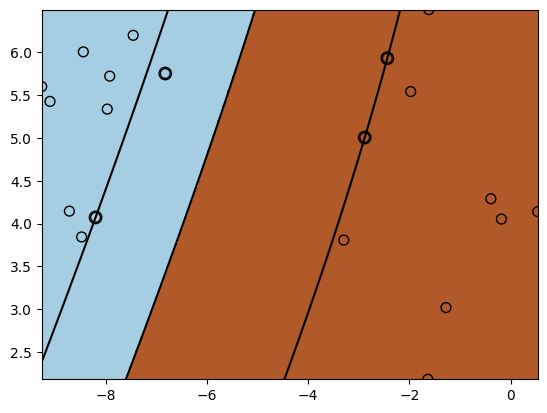

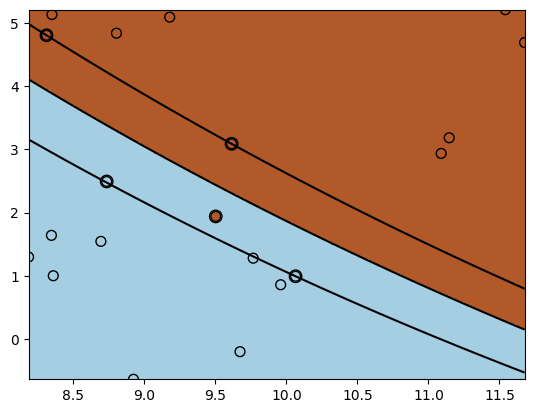

In [ ]:
# kernel = 'poly' polynominal：多項式
for rs in [3,8,7,4]:

    X, y = make_blobs(n_samples=20, # 20個生成
                      n_features=2, # 2次元
                      centers=2,    # クラスタ中心2個
                      cluster_std =1, # クラスタの大きさ（標準偏差）
                      random_state=rs   # 乱数種（再現用）
                     )
    clf.kernel = 'poly'

    clf.fit(X,y)
    plotSVMBoundary(X, clf, mesh=True)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

    plt.show()

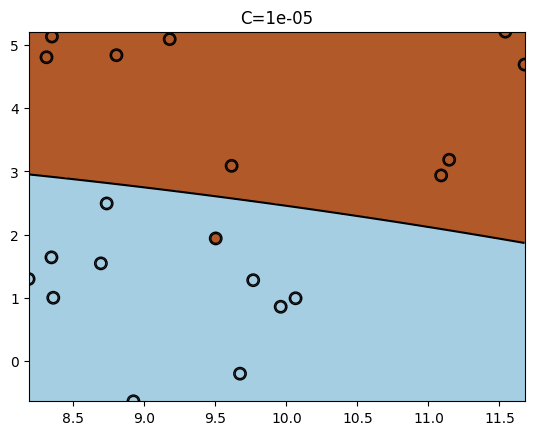

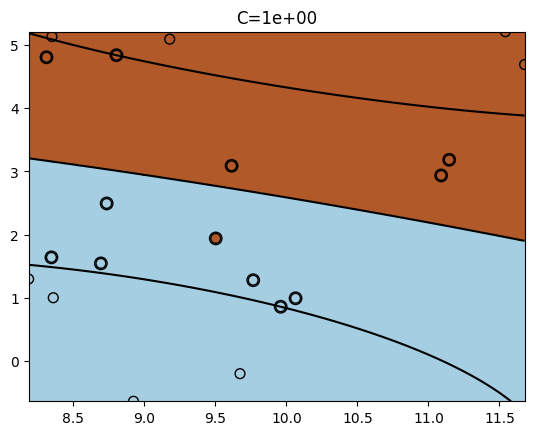

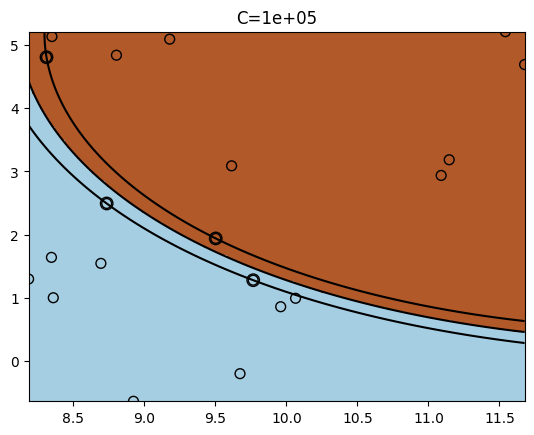

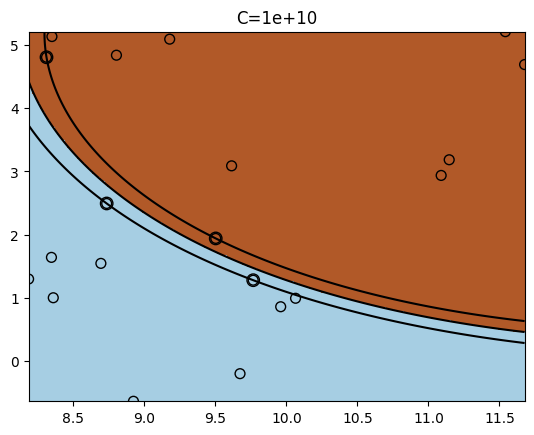

In [ ]:
# SVMでもCというパラメータが重要
# rbfでCパラメータを変えながら識別境界を可視化
for C in [1e-5, 1, 1e5, 1e10]:

    X, y = make_blobs(n_samples=20, # 20個生成
                      n_features=2, # 2次元
                      centers=2,    # クラスタ中心2個
                      cluster_std =1, # クラスタの大きさ（標準偏差）
                      random_state=4   # 乱数種（再現用）
                     )
    clf.kernel = 'rbf'

    clf.C = C
    clf.fit(X,y)
    plotSVMBoundary(X, clf, mesh=True)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
    plt.title("C={0:.0e}".format(C))

    plt.show()

In [ ]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
clf = SVC()

In [ ]:
# 線形SVM
clf.kernel = 'linear'

clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.956140350877193

In [ ]:
# 非線形SVM
# 精度については非線形SVMの方が低くなることが多い、よって、最初に使うのは線形SVMでそのあとに非線形を使うのが良い
clf.kernel = 'rbf'

clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9298245614035088

In [ ]:
# 非線形だと精度が弱いので、スケーリングする
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scale = scaler.transform(X_train)
X_test_scale  = scaler.transform(X_test)

In [ ]:
clf.kernel = 'linear'

clf.fit(X_train_scale, y_train)
clf.score(X_test_scale, y_test)

0.9649122807017544

In [ ]:
# 非線形SVMで精度が上がった > 非線形SVMの精度向上にはスケーリングすることが必須
clf.kernel = 'rbf'

clf.fit(X_train_scale, y_train)
clf.score(X_test_scale, y_test)

0.9736842105263158

In [ ]:
clf.kernel = 'poly'

clf.fit(X_train_scale, y_train)
clf.score(X_test_scale, y_test)

0.9824561403508771

##  7-6 多層パーセプトロン（MLP）

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
plt.set_cmap(plt.cm.Paired) # 色設定

<Figure size 640x480 with 0 Axes>

In [ ]:
# 境界線を引く関数の定義

def plotBoundary(X, clf, mesh=True, boundary=True, type='predict'):

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    if type == 'predict':
        Z = clf.predict(np.c_[XX.ravel(), YY.ravel()])
    elif type == 'probability':
        Z = np.exp(clf.predict_log_proba(np.c_[XX.ravel(), YY.ravel()]))[:, 1]
    else:
        Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()])

    Z = Z.reshape(XX.shape) # just reshape

    if mesh:
        if type == 'predict':
            plt.pcolormesh(XX, YY, Z, zorder=-10) # paint in 2 colors, if Z > 0 or not
        else:
            plt.pcolormesh(XX, YY, Z, zorder=-10, cmap=plt.cm.bwr)
            plt.colorbar()

    if boundary:
        level = [0.5]
        if type == "probability":
            level = [0.5]
        plt.contour(XX, YY, Z,
                    colors='k', linestyles='-', levels=level)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

In [ ]:
# 多層パーセプトロンはMLPClassifierにはいっている
from sklearn.neural_network import MLPClassifier

clf = MLPClassifier(random_state=8)

clf.alpha = 1
clf.max_iter = 2000
clf.hidden_layer_sizes=(10,)

clf

MLPClassifier(alpha=1, hidden_layer_sizes=(10,), max_iter=2000, random_state=8)

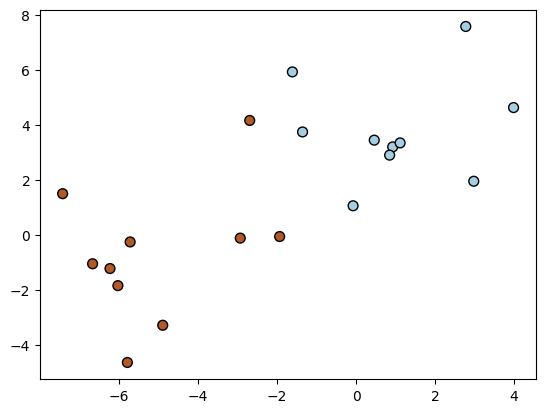

In [ ]:
from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std = 2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )

plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

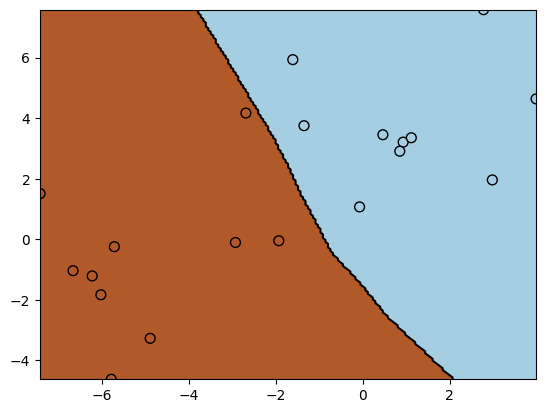

In [ ]:
# ぐにゃっと曲がったような感じだが、MLPはいい感じに識別できている
clf.fit(X,y)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット

plotBoundary(X, clf)

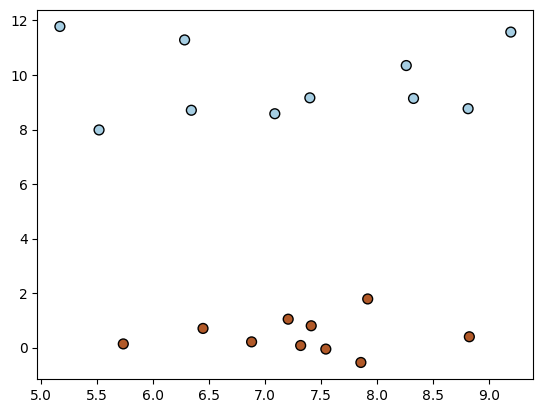

In [ ]:
# 上と下に分かれた2クラス問題だとどうなるか？
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=8   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

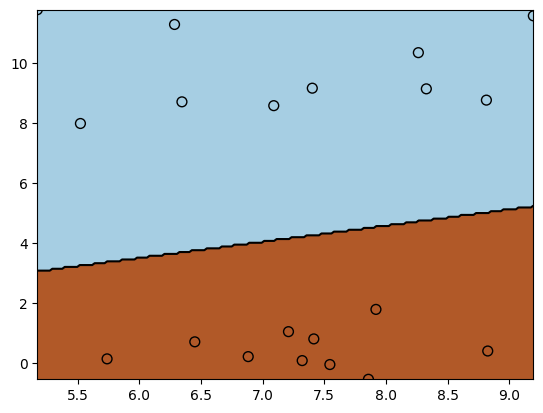

In [ ]:
# きれいな直線で引ける
clf.fit(X,y)

plotBoundary(X, clf)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

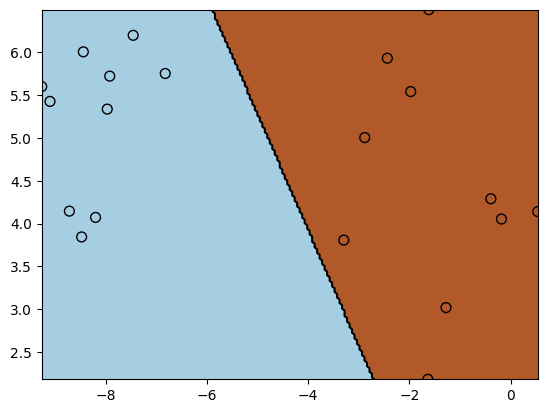

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=7   # 乱数種（再現用）
                 )
clf.fit(X,y)

plotBoundary(X, clf)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

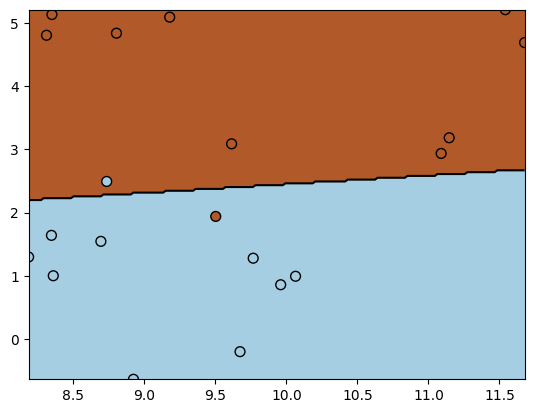

In [ ]:
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=4   # 乱数種（再現用）
                 )
clf.fit(X,y)

plotBoundary(X, clf)

plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')

In [ ]:
# modified from https://gist.github.com/craffel/2d727968c3aaebd10359

def draw_neural_net(layer_sizes, left=.1, right=.9, bottom=.1, top=.9, size=5):
    '''
    Draw a neural network cartoon using matplotilb.

    :usage:
        >>> fig = plt.figure(figsize=(12, 12))
        >>> draw_neural_net(fig.gca(), .1, .9, .1, .9, [4, 7, 2])

    :parameters:
        - ax : matplotlib.axes.AxesSubplot
            The axes on which to plot the cartoon (get e.g. by plt.gca())
        - left : float
            The center of the leftmost node(s) will be placed here
        - right : float
            The center of the rightmost node(s) will be placed here
        - bottom : float
            The center of the bottommost node(s) will be placed here
        - top : float
            The center of the topmost node(s) will be placed here
        - layer_sizes : list of int
            List of layer sizes, including input and output dimensionality
    '''
    fig = plt.figure(figsize=(size, size))
    ax = fig.gca()
    ax.axis('off')

    n_layers = len(layer_sizes)
    v_spacing = (top - bottom)/float(max(layer_sizes))
    h_spacing = (right - left)/float(len(layer_sizes) - 1)
    # Nodes
    for n, layer_size in enumerate(layer_sizes):
        layer_top = v_spacing*(layer_size - 1)/2. + (top + bottom)/2.
        for m in range(layer_size):
            circle = plt.Circle((n*h_spacing + left, layer_top - m*v_spacing), v_spacing/4.,
                                color='w', ec='k', zorder=4)
            ax.add_artist(circle)
    # Edges
    for n, (layer_size_a, layer_size_b) in enumerate(zip(layer_sizes[:-1], layer_sizes[1:])):
        layer_top_a = v_spacing*(layer_size_a - 1)/2. + (top + bottom)/2.
        layer_top_b = v_spacing*(layer_size_b - 1)/2. + (top + bottom)/2.
        for m in range(layer_size_a):
            for o in range(layer_size_b):
                line = plt.Line2D([n*h_spacing + left, (n + 1)*h_spacing + left],
                                  [layer_top_a - m*v_spacing, layer_top_b - o*v_spacing], c='k')
                ax.add_artist(line)

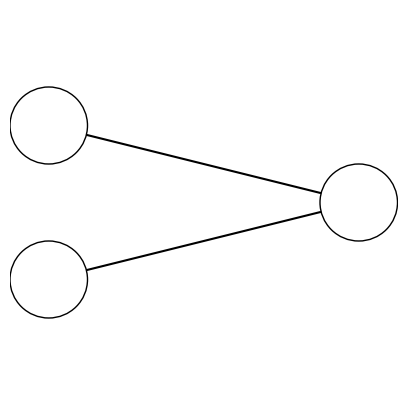

In [ ]:
draw_neural_net([2, 1])

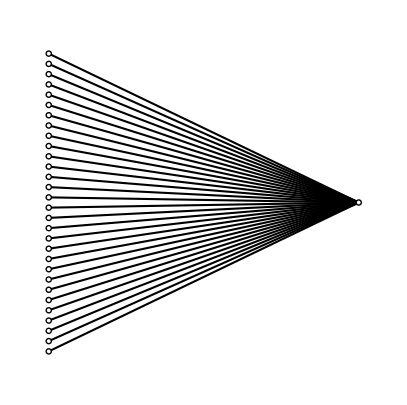

In [ ]:
draw_neural_net([30, 1])

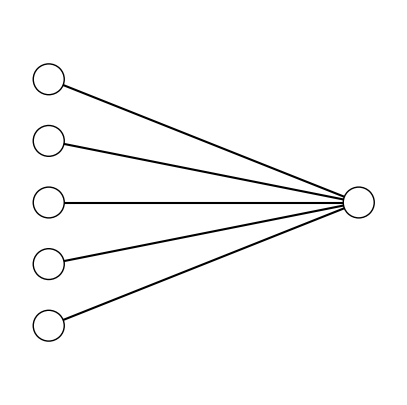

In [ ]:
draw_neural_net([5, 1])

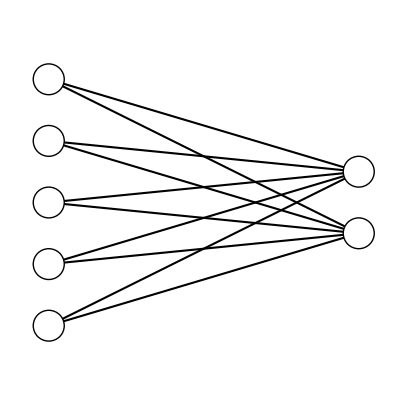

In [ ]:
draw_neural_net([5, 2])

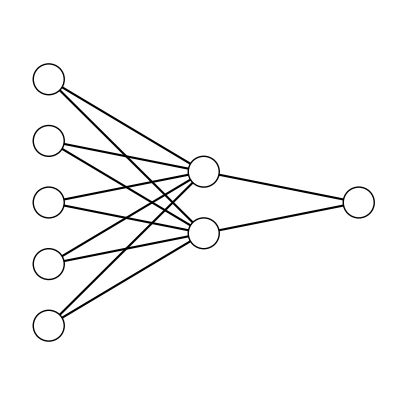

In [ ]:
draw_neural_net([5, 2, 1])

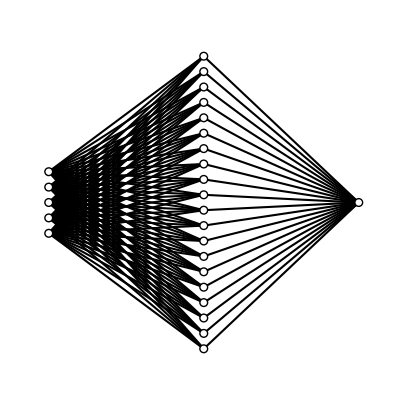

In [ ]:
# 普通は隠れ層を増やす
draw_neural_net([5, 20, 1])

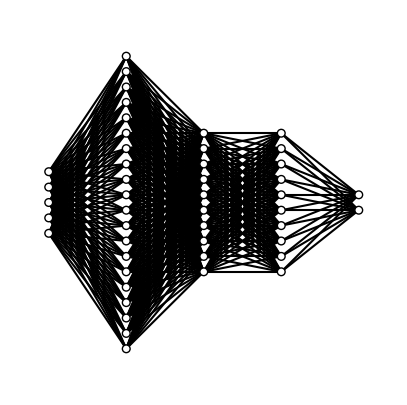

In [ ]:
#　DeepLearningの名前の由来はこの層を何層も増やすことにある
draw_neural_net([5, 20, 10, 10, 2])

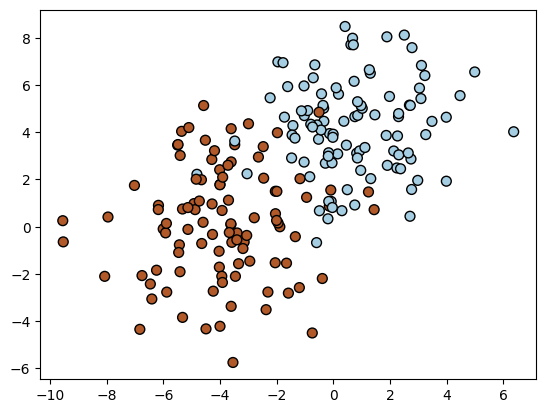

In [ ]:
# 層を変えてみる
X, y = make_blobs(n_samples=200, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

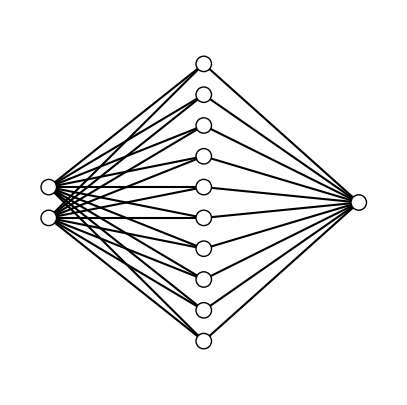

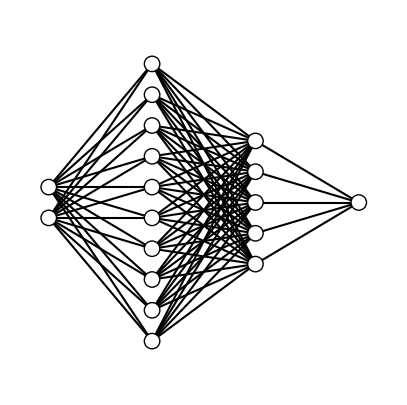

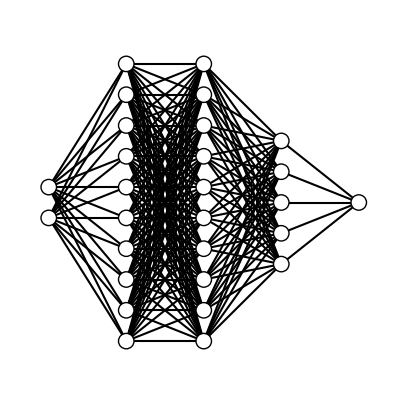

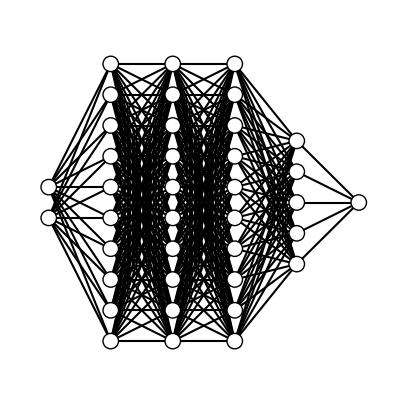

In [ ]:
draw_neural_net([2, 10, 1], size=5)
draw_neural_net([2, 10, 5, 1], size=5)
draw_neural_net([2, 10, 10, 5, 1], size=5)
draw_neural_net([2, 10, 10, 10, 5, 1], size=5)

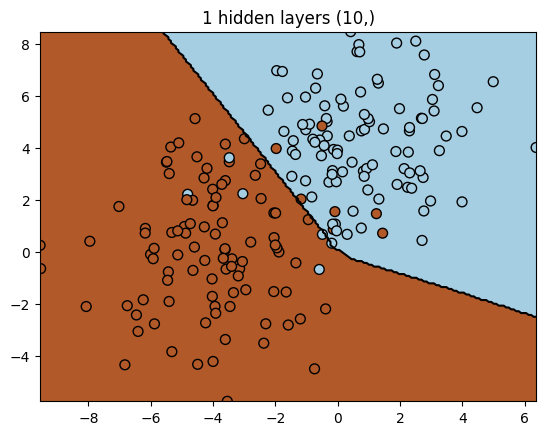

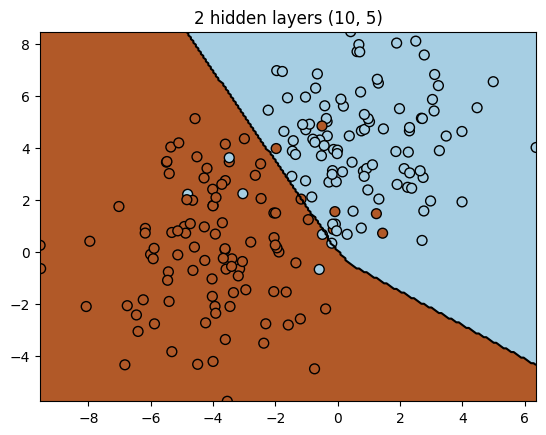

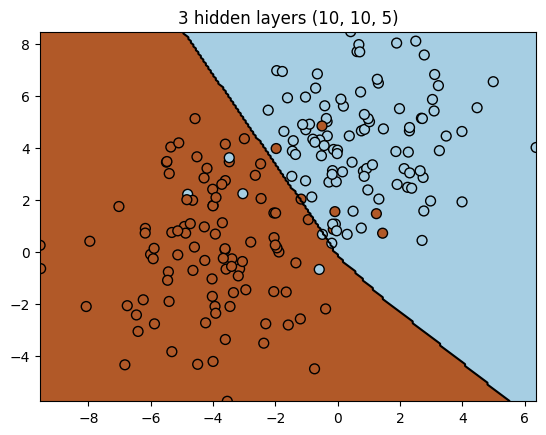

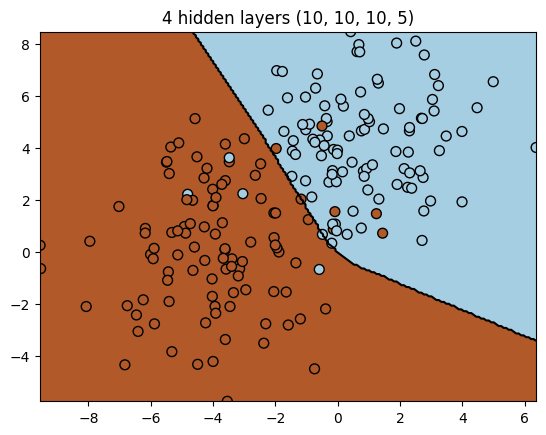

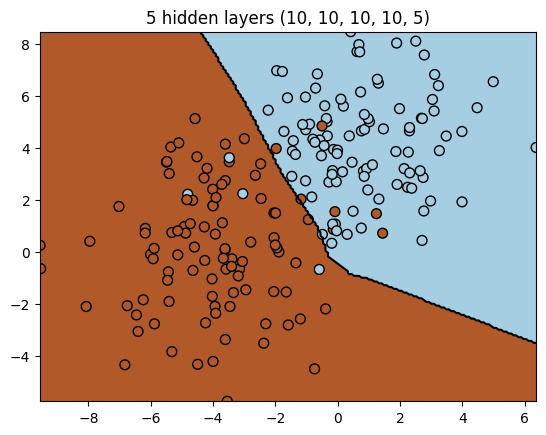

In [ ]:
# 層を変えた識別境界を描く

clf.random_state = 10

for layers in [(10,),
               (10, 5),
               (10, 10, 5),
               (10, 10, 10, 5),
               (10, 10, 10, 10, 5)]:

    clf.hidden_layer_sizes = layers #隠れ層のパラメータがhidden_layer_sizeにある

    clf.fit(X,y)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
    plotBoundary(X, clf)
    plt.title("{0} hidden layers {1}".format(len(layers), layers))
    plt.show()

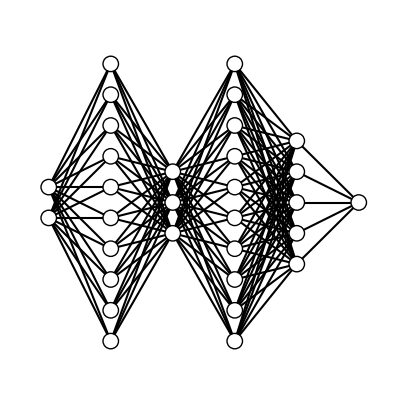

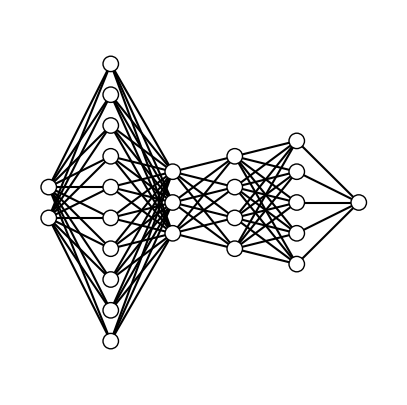

In [ ]:
# 中間層を何層にするか？中間層を増やすか減らすかがパラメータ設計の見せ所
draw_neural_net([2, 10, 3, 10, 5, 1], size=5)
draw_neural_net([2, 10, 3, 4, 5, 1], size=5)

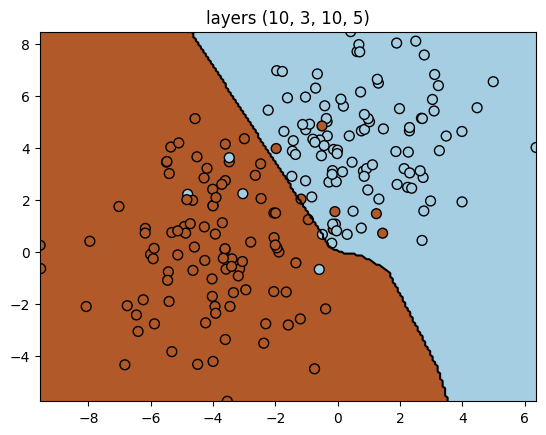

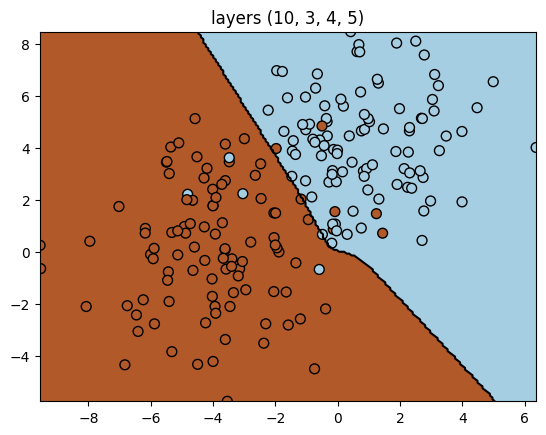

In [ ]:
clf.random_state = 10

for layers in [(10,3,10,5),
               (10,3,4,5)]:
    clf.hidden_layer_sizes = layers

    clf.fit(X,y)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
    plotBoundary(X, clf)
    plt.title("layers {0}".format(layers))
    plt.show()

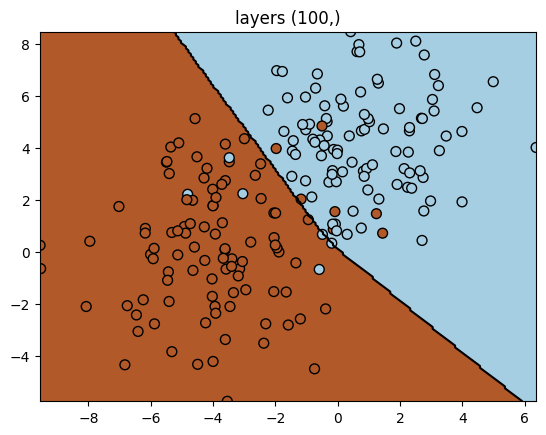

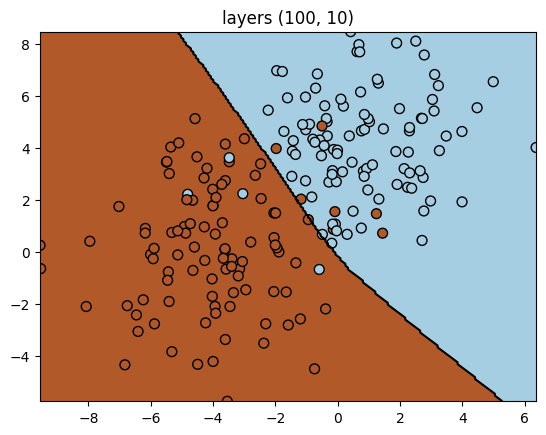

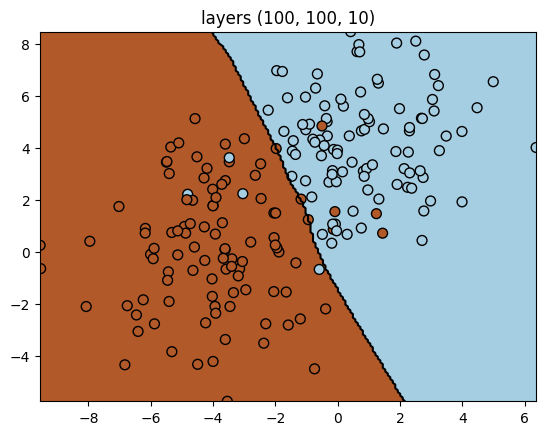

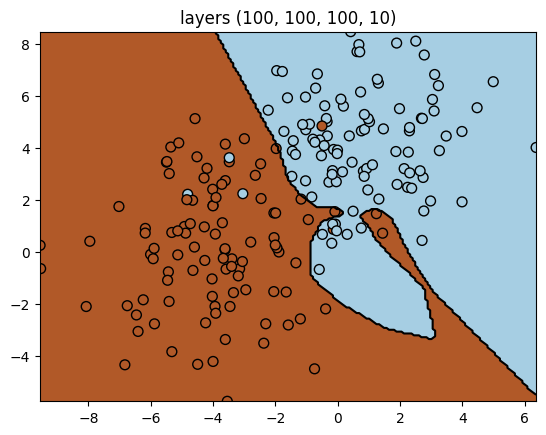

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (2000) reached and the optimization hasn't converged yet.
  warnings.warn(


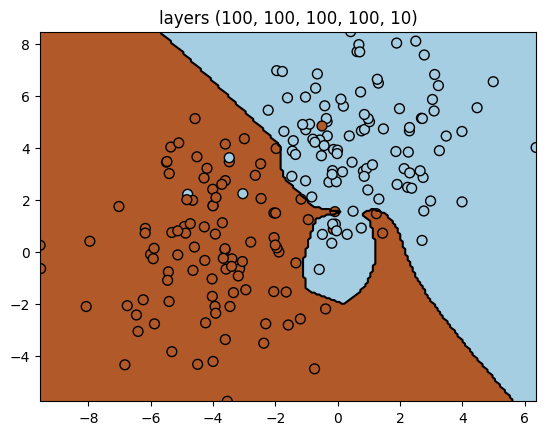

In [ ]:
clf.random_state = 10

for layers in [(100,),
               (100,10),
               (100,100,10),
               (100,100,100,10),
               (100,100,100,100,10)]:
    clf.hidden_layer_sizes=layers
    clf.fit(X,y)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
    plotBoundary(X, clf)
    plt.title("layers {0}".format(layers))
    plt.show()

In [ ]:
ｃｌｆ

MLPClassifier(alpha=1, hidden_layer_sizes=(100, 100, 100, 100, 10),
              max_iter=2000, random_state=10)

In [ ]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
clf = MLPClassifier()

In [ ]:
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9473684210526315

In [ ]:
clf

MLPClassifier()

In [ ]:
# 警告を非表示にする（追加コード）
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore', ConvergenceWarning)

In [ ]:
for layers in [(100,),
               (100,10),
               (100,100,10),
               (100,100,100,10),
               (100,100,100,100,10),
               (100,100,100,100,100,10)]:

    clf.hidden_layer_sizes = layers
    clf.fit(X_train, y_train)
    print("{0} hidden layers".format(len(layers)), clf.score(X_test, y_test))

1 hidden layers 0.9385964912280702
2 hidden layers 0.9385964912280702
3 hidden layers 0.9122807017543859
4 hidden layers 0.8596491228070176
5 hidden layers 0.9385964912280702
6 hidden layers 0.9210526315789473


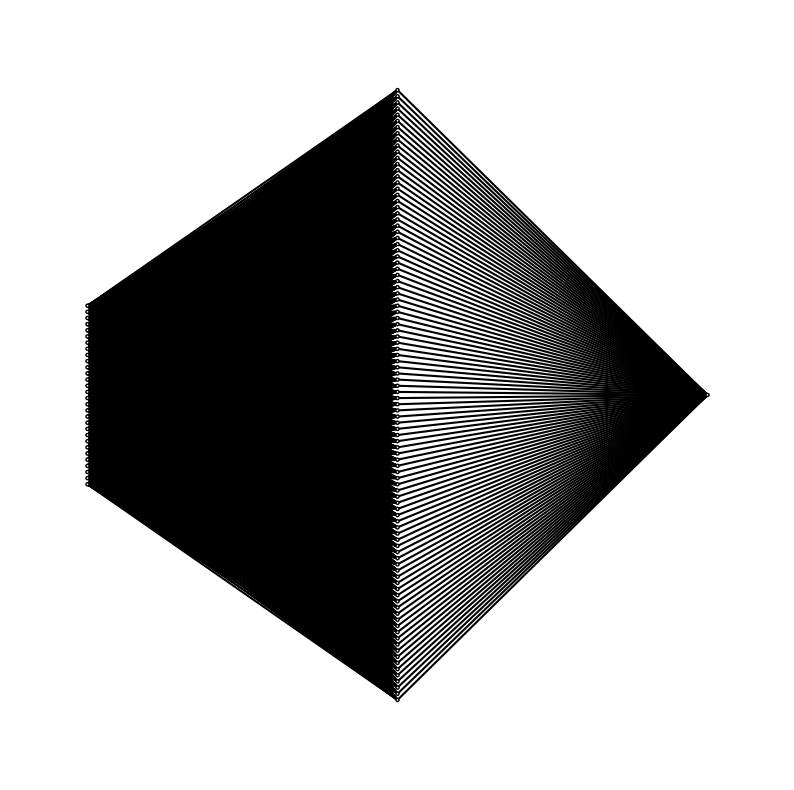

In [ ]:
draw_neural_net([30,100,1], size=10)

In [ ]:
# スケーリングするとどうなるか？
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scale = scaler.transform(X_train)
X_test_scale  = scaler.transform(X_test)

In [ ]:
clf = MLPClassifier()

In [ ]:
clf.fit(X_train_scale, y_train)
clf.score(X_test_scale, y_test)

0.9736842105263158

In [ ]:
# alphaはMLPのパラメータ
clf.alpha = 1
clf.fit(X_train_scale, y_train)
clf.score(X_test_scale, y_test)

0.9649122807017544

In [ ]:
# スケーリングしたもので層の数を変える
for layers in [(100,),
               (100,10),
               (100,100,10),
               (100,100,100,10),
               (100,100,100,100,10),
               (100,100,100,100,100,10)]:
    clf.hidden_layer_sizes = layers
    clf.fit(X_train_scale, y_train)
    print("{0} hidden layers".format(len(layers)), clf.score(X_test_scale, y_test))

1 hidden layers 0.956140350877193
2 hidden layers 0.9649122807017544
3 hidden layers 0.9649122807017544
4 hidden layers 0.9736842105263158
5 hidden layers 0.9649122807017544
6 hidden layers 0.9649122807017544


1 hidden layer with 1 nodes 0.5877192982456141
1 hidden layer with 2 nodes 0.5877192982456141
1 hidden layer with 3 nodes 0.9035087719298246
1 hidden layer with 4 nodes 0.8771929824561403
1 hidden layer with 5 nodes 0.5877192982456141
1 hidden layer with 6 nodes 0.5877192982456141
1 hidden layer with 7 nodes 0.9298245614035088
1 hidden layer with 8 nodes 0.9298245614035088
1 hidden layer with 9 nodes 0.9298245614035088
1 hidden layer with 10 nodes 0.9298245614035088
1 hidden layer with 11 nodes 0.9298245614035088
1 hidden layer with 12 nodes 0.9298245614035088
1 hidden layer with 13 nodes 0.9298245614035088
1 hidden layer with 14 nodes 0.9298245614035088
1 hidden layer with 15 nodes 0.9298245614035088
1 hidden layer with 16 nodes 0.9298245614035088
1 hidden layer with 17 nodes 0.9298245614035088
1 hidden layer with 18 nodes 0.9473684210526315
1 hidden layer with 19 nodes 0.9298245614035088


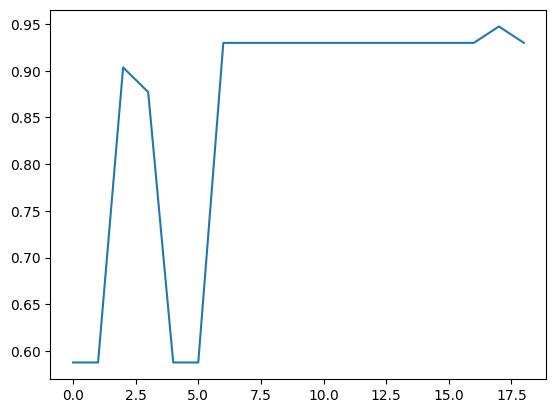

In [ ]:
# ノードの数を変える
scores = []
for nodes in range(1, 20):

    clf.hidden_layer_sizes = (nodes,)

    clf.fit(X_train_scale, y_train)
    score = clf.score(X_test_scale, y_test)
    print("1 hidden layer with {0} nodes".format(nodes), score)
    scores.append( score )

socres = np.array(scores)
plt.plot(scores)

## 7-7 ランダムフォレスト

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
plt.set_cmap(plt.cm.Paired) # 色設定

<Figure size 640x480 with 0 Axes>

In [ ]:
# 境界線を引く関数の定義

def plotBoundary(X, clf, mesh=True, boundary=True, type='predict'):

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid

    if type == 'predict':
        Z = clf.predict(np.c_[XX.ravel(), YY.ravel()])
    elif type == 'probability':
        Z = np.exp(clf.predict_log_proba(np.c_[XX.ravel(), YY.ravel()]))[:, 1]
    else:
        Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()])

    Z = Z.reshape(XX.shape) # just reshape

    if mesh:
        if type == 'predict':
            plt.pcolormesh(XX, YY, Z, zorder=-10) # paint in 2 colors, if Z > 0 or not
        else:
            plt.pcolormesh(XX, YY, Z, zorder=-10, cmap=plt.cm.bwr)
            plt.colorbar()

    if boundary:
        level = [0.5]
        if type == "probability":
            level = [0.5]
        plt.contour(XX, YY, Z,
                    colors='k', linestyles='-', levels=level)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

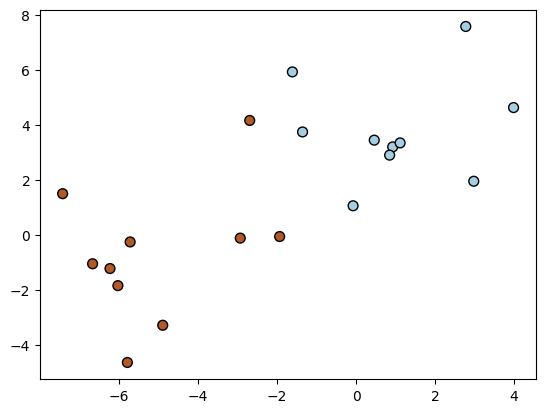

In [ ]:
from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std = 2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )

plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

In [ ]:
# ランダムフォレストのモジュールインポート
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(random_state=8)
clf.max_depth = 1

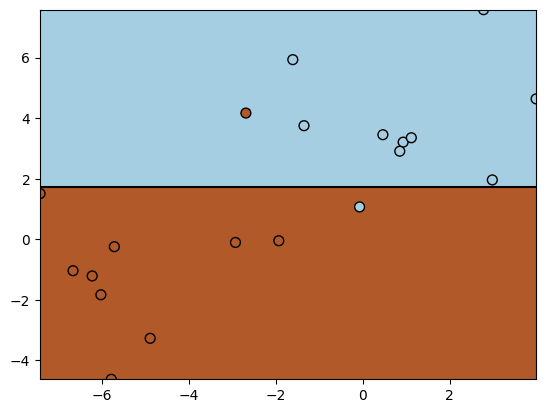

In [ ]:
# 使うツリーの数がn_estimators
# max_depthは決定木と同じ木の深さ
clf.n_estimators=1

clf.fit(X,y)
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット
plotBoundary(X, clf)

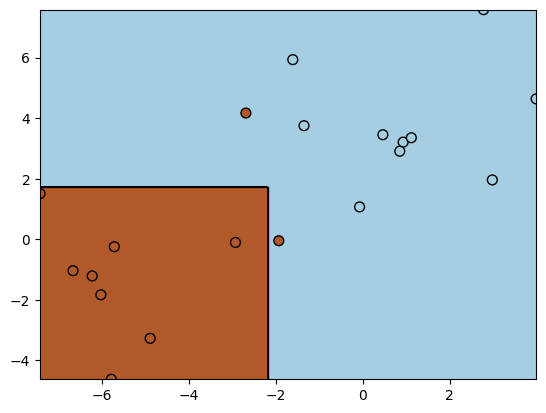

In [ ]:
# 決定木が2個ると、2本でスパンと切れる
clf.n_estimators=2

clf.fit(X,y)
plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット
plotBoundary(X, clf)

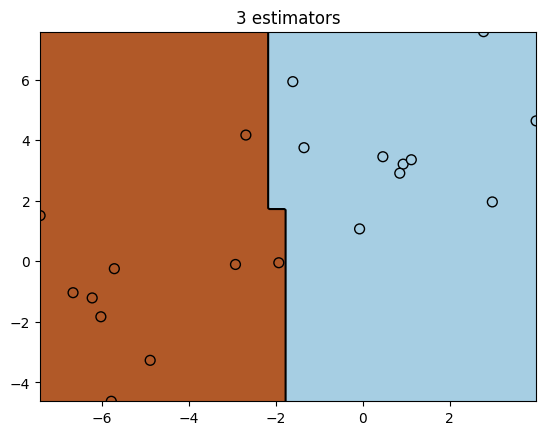

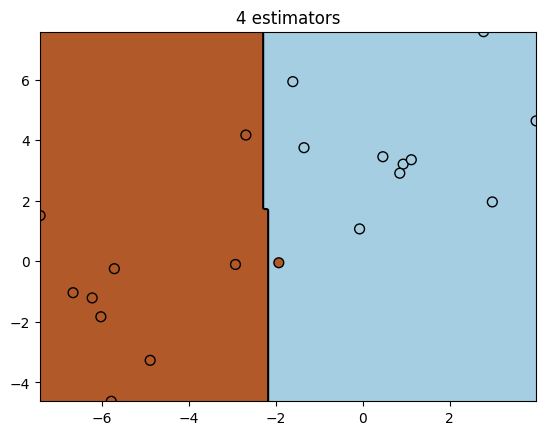

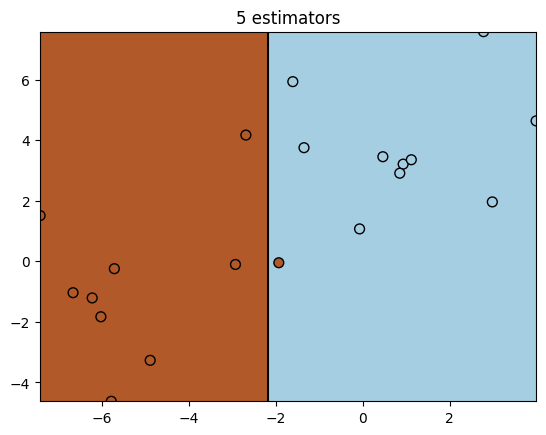

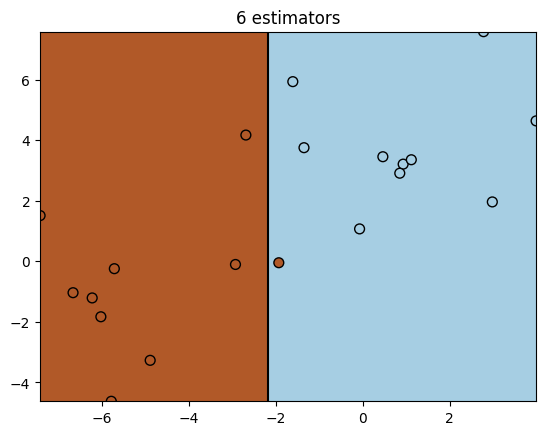

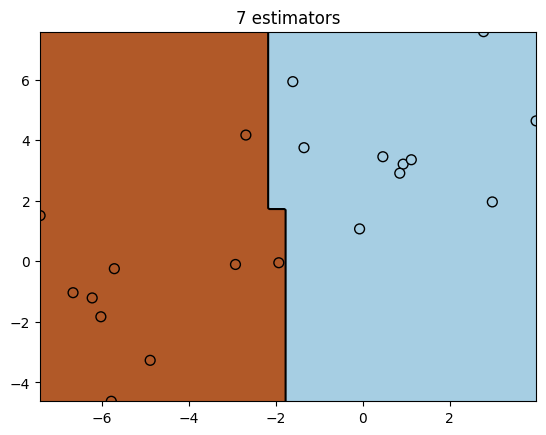

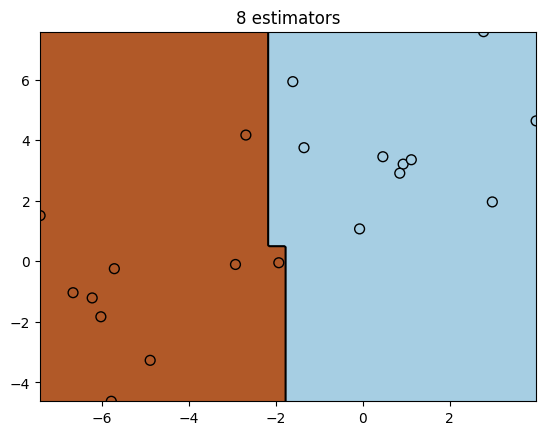

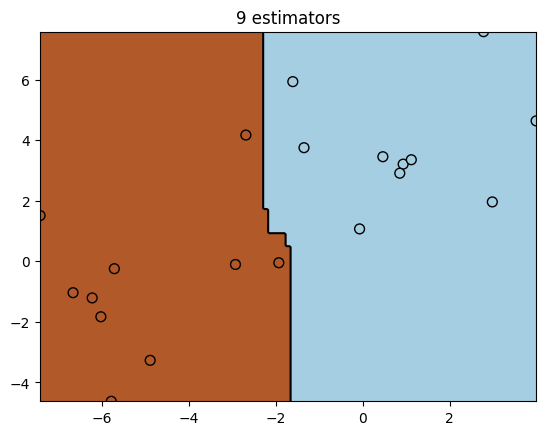

In [ ]:
# max_depthが1で木の数を変えるとどうなるか？
for i in range(3,10):
    clf.n_estimators = i
    clf.fit(X,y)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット
    plotBoundary(X, clf)
    plt.title("{0} estimators".format(i))
    plt.show()

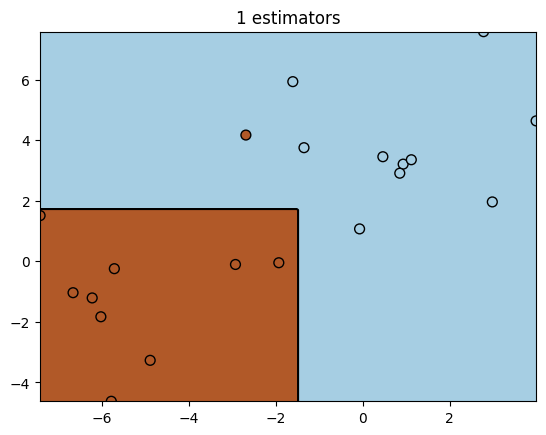

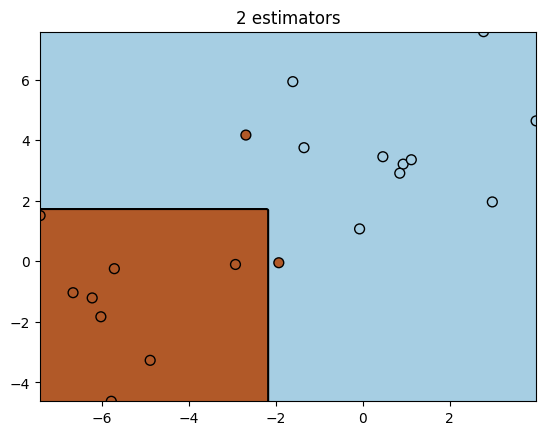

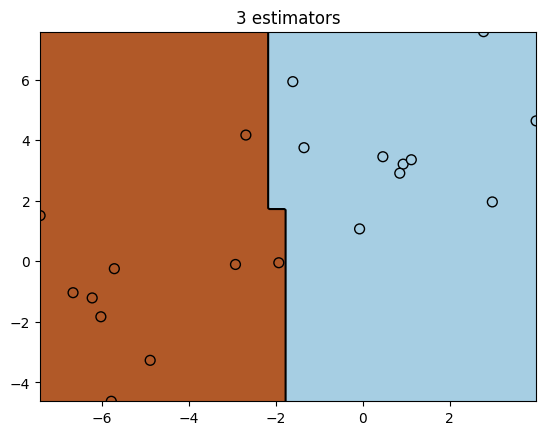

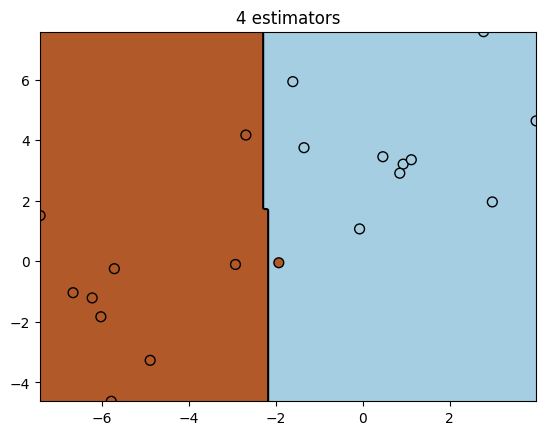

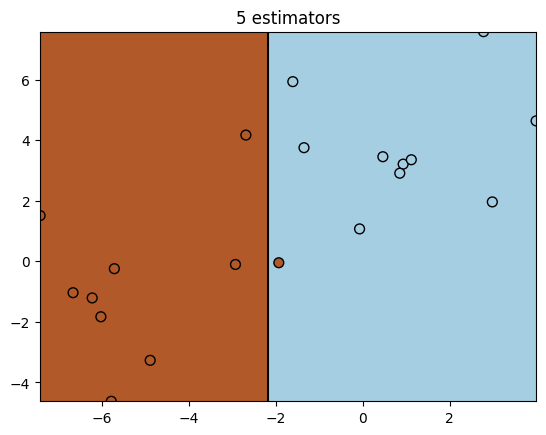

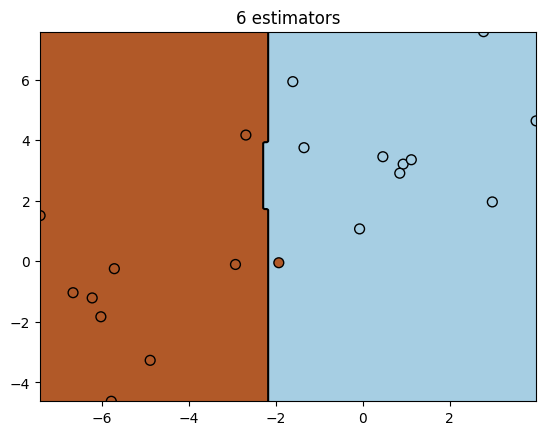

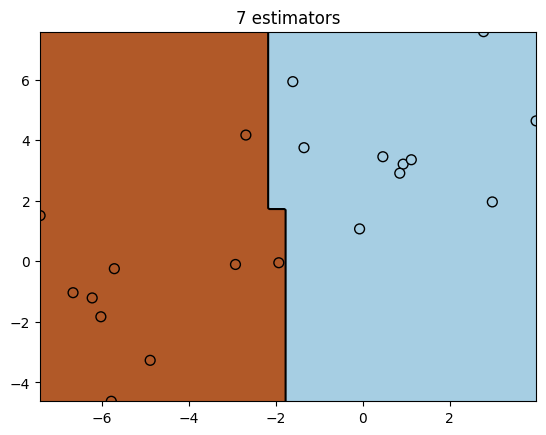

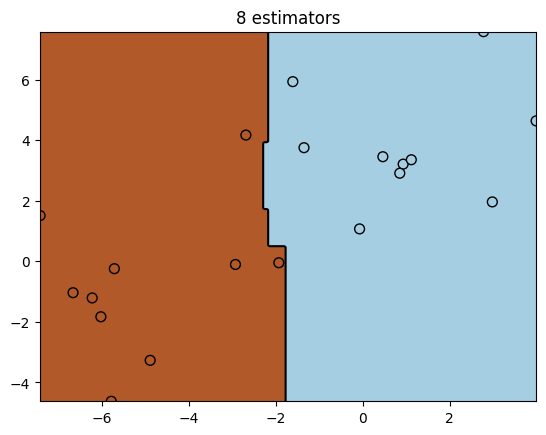

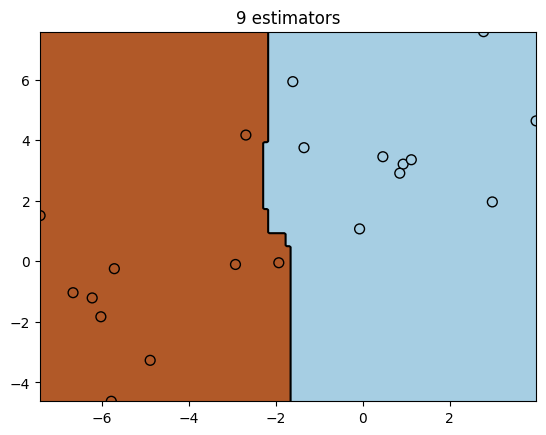

In [ ]:
# max_depthを1にせずDefaultにして層を変えるとどうなるか？
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(random_state=8) # max_depth != 1

for i in range(1,10):
    clf.n_estimators=i
    clf.fit(X,y)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット
    plotBoundary(X, clf)
    plt.title("{0} estimators".format(i))
    plt.show()

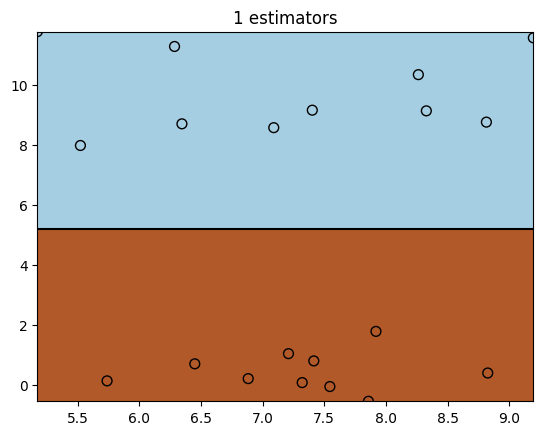

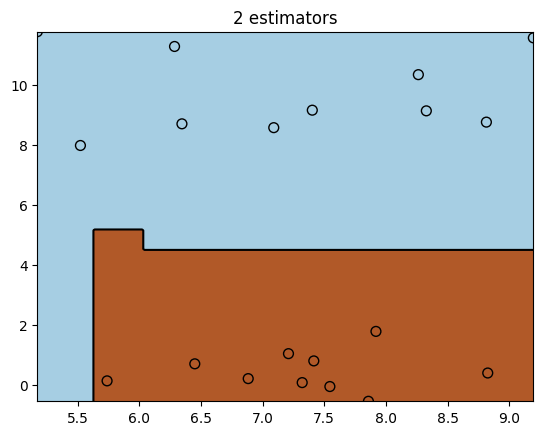

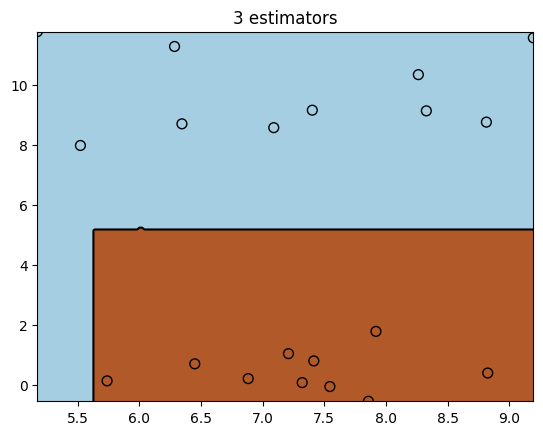

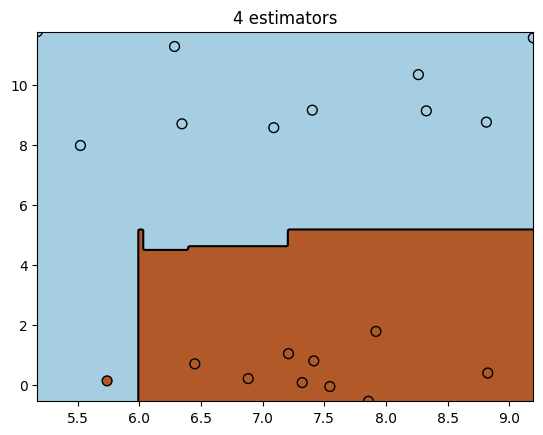

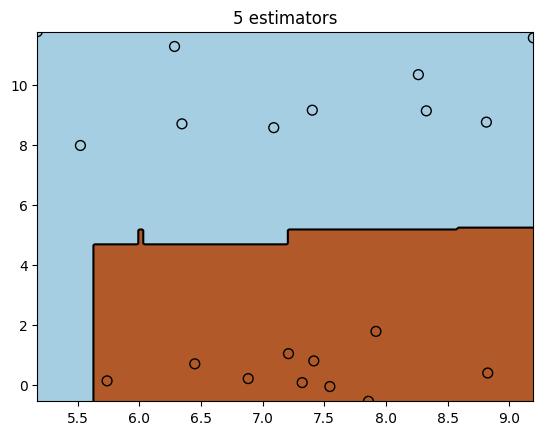

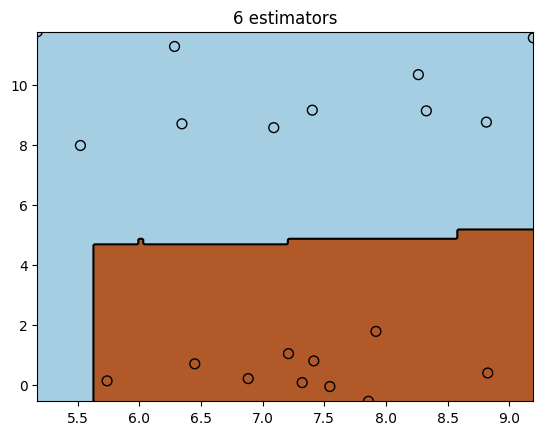

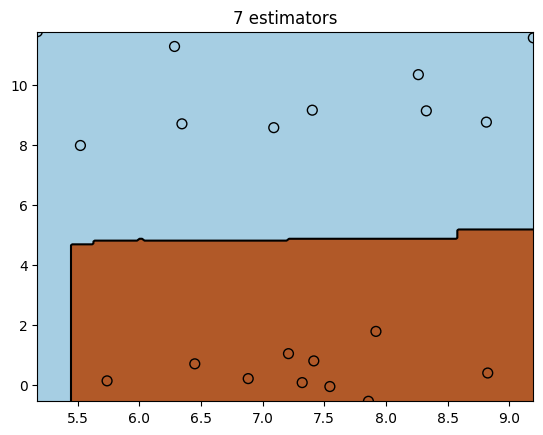

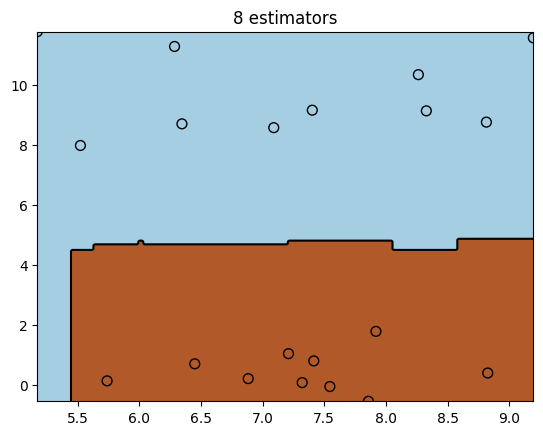

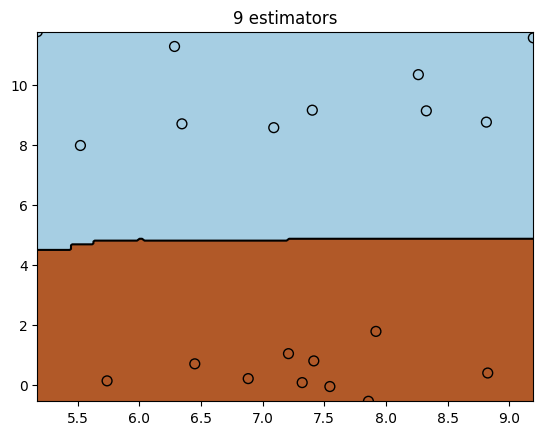

In [ ]:
# 別の2次元データで実施
X, y = make_blobs(n_samples=20, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =1, # クラスタの大きさ（標準偏差）
                  random_state=8   # 乱数種（再現用）
                 )

for i in range(1,10):
    clf.n_estimators=i
    clf.fit(X,y)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k') # 2次元散布図でプロット
    plotBoundary(X, clf)
    plt.title("{0} estimators".format(i))
    plt.show()

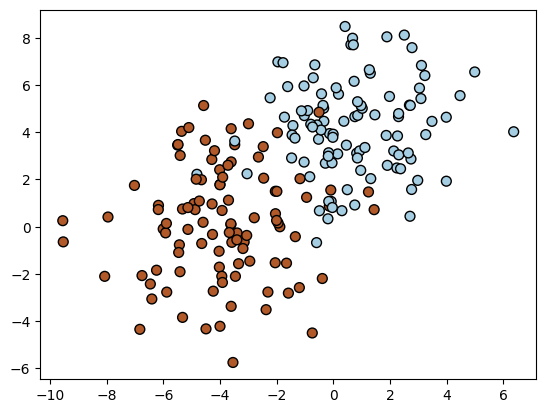

In [ ]:
# 別のデータで実施
X, y = make_blobs(n_samples=200, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

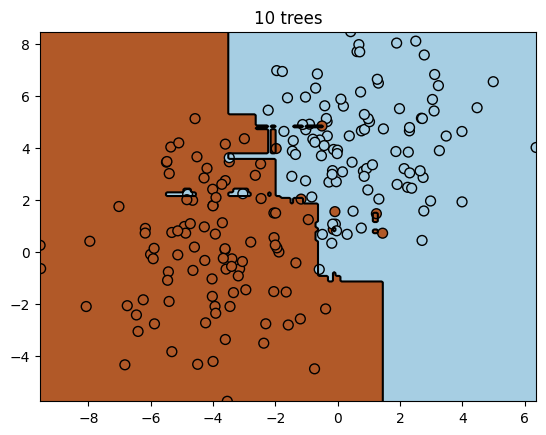

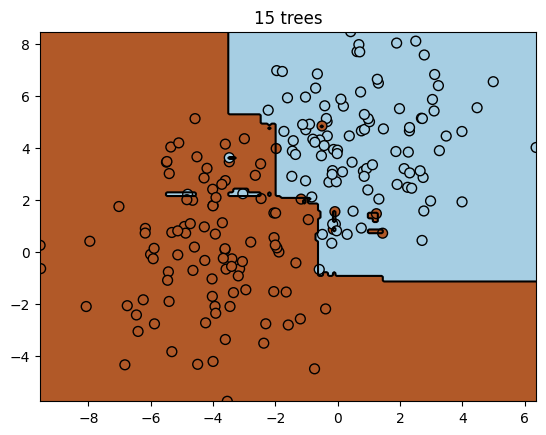

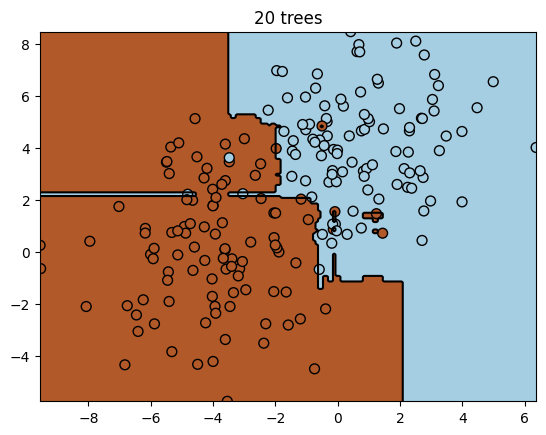

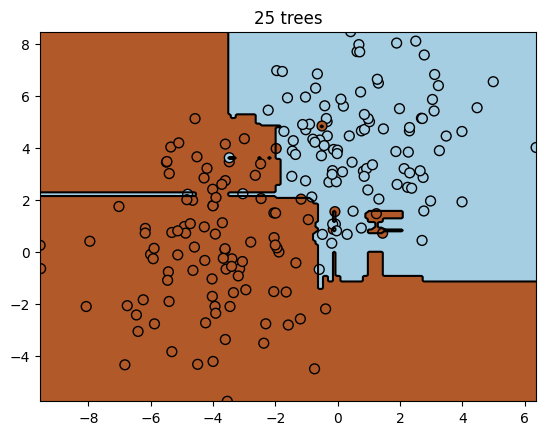

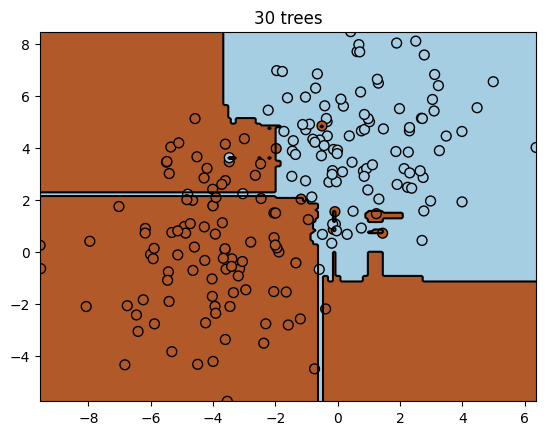

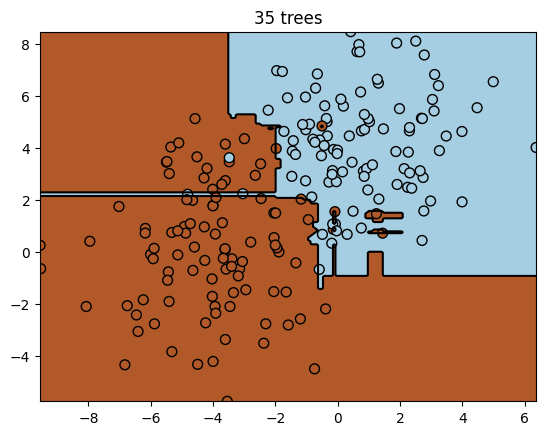

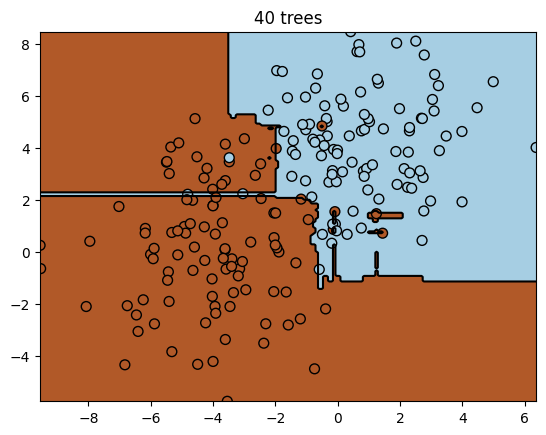

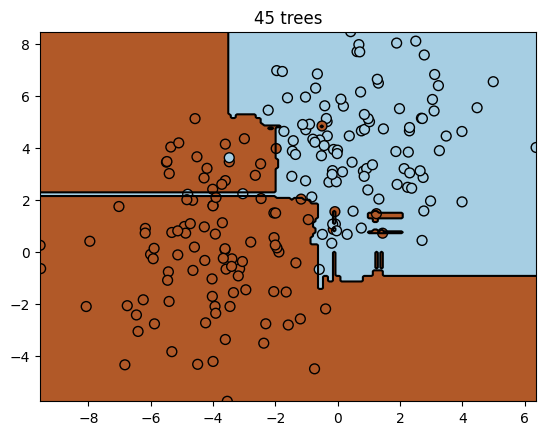

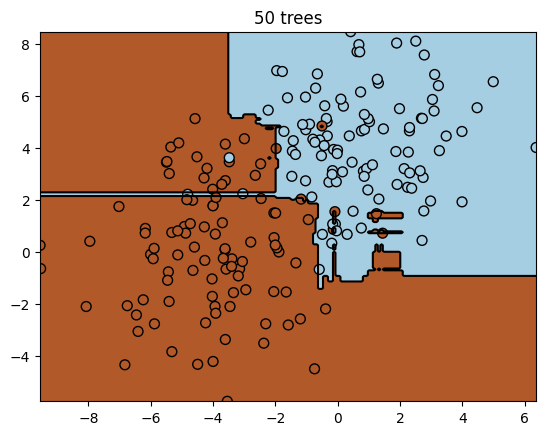

In [ ]:
# ツリーの数を10から5ずつ50までに変えてみる
for n in range(10,51,5):
    clf.n_estimators = n
    clf.fit(X,y)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
    plotBoundary(X, clf)
    plt.title("{0} trees".format(n))
    plt.show()


In [ ]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
clf = RandomForestClassifier(random_state=8)

In [ ]:
scores = []
n_range = range(1,100, 10)
for n in n_range:
    clf.n_estimators = n
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    print("{0} trees".format(n), score)
    scores.append(score)
scores = np.array(scores)

1 trees 0.8859649122807017
11 trees 0.9736842105263158
21 trees 0.9736842105263158
31 trees 0.9824561403508771
41 trees 0.9824561403508771
51 trees 0.9736842105263158
61 trees 0.9736842105263158
71 trees 0.9736842105263158
81 trees 0.9736842105263158
91 trees 0.9736842105263158


Text(0.5, 0, 'number of estimators')

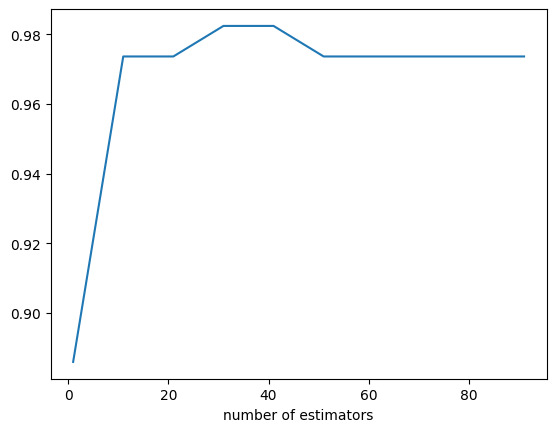

In [ ]:
# ツリーの数を変えた精度の可視化
plt.plot(n_range, scores)
plt.xlabel("number of estimators")

In [ ]:
# スケーリングするとどうなるか？

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scale = scaler.transform(X_train)
X_test_scale  = scaler.transform(X_test)

In [ ]:
scores2 = []
n_range = range(1,100, 10)
for n in n_range:
    clf.n_estimators=n
    clf.fit(X_train_scale, y_train)
    score = clf.score(X_test_scale, y_test)
    print("{0} trees".format(n), score)
    scores2.append(score)
scores2 = np.array(scores2)

1 trees 0.8859649122807017
11 trees 0.9736842105263158
21 trees 0.9736842105263158
31 trees 0.9824561403508771
41 trees 0.9824561403508771
51 trees 0.9736842105263158
61 trees 0.9736842105263158
71 trees 0.9736842105263158
81 trees 0.9736842105263158
91 trees 0.9736842105263158


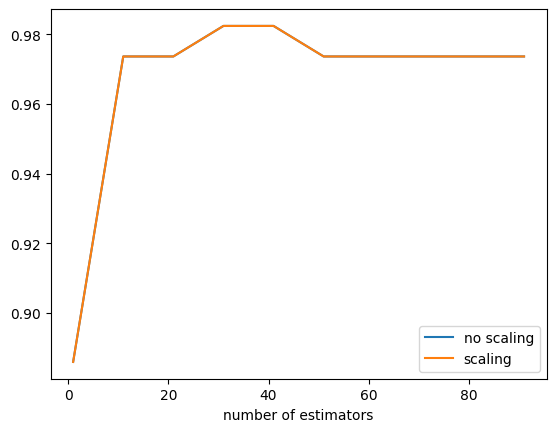

In [ ]:
# ランダムフォレストの場合、スケーリングの意味がない
# 縦と横の軸で切ることが多いため。
# 斜めに引くような直線の場合、スケーリングは有効
plt.plot(n_range, scores, label="no scaling")
plt.plot(n_range, scores2, label="scaling")
plt.xlabel("number of estimators")
plt.legend(loc="best")

# パラメータ調整

## 8-1 グリッドサーチ

### 1パラメータのロジスティック回帰

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
# この先スケーリングしてパラメータ調整を実施する
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test  = scaler.transform(X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(solver='liblinear')

In [ ]:
clf

LogisticRegression(solver='liblinear')

In [ ]:
# C=1の時にはどうなるか
clf.C = 1.0
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.956140350877193

In [ ]:
# C=100の時には？

clf.C = 100.0
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9736842105263158

In [ ]:
C_range = [1e-5, 1e-3, 1e-2, 1, 1e2, 1e5, 1e10]

In [ ]:
# 最適なCを見つけるためにグリッドサーチを使う
# グリッドサーチは格子状で探索するという意味
# Cは100倍など大きめに変えていって良い

In [ ]:
C_range_exp = np.arange(-15.0, 21.0)
C_range = 10 ** C_range_exp

In [ ]:
C_range

array([1.e-15, 1.e-14, 1.e-13, 1.e-12, 1.e-11, 1.e-10, 1.e-09, 1.e-08,
       1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00,
       1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06, 1.e+07, 1.e+08,
       1.e+09, 1.e+10, 1.e+11, 1.e+12, 1.e+13, 1.e+14, 1.e+15, 1.e+16,
       1.e+17, 1.e+18, 1.e+19, 1.e+20])

In [ ]:
from sklearn.model_selection import GridSearchCV

param = {'C' : C_range}

gs = GridSearchCV(clf, param)  # どの識別器を使うのか？どのパラメータを使うのか？
gs.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


GridSearchCV(estimator=LogisticRegression(C=100.0, solver='liblinear'),
             param_grid={'C': array([1.e-15, 1.e-14, 1.e-13, 1.e-12, 1.e-11, 1.e-10, 1.e-09, 1.e-08,
       1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00,
       1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06, 1.e+07, 1.e+08,
       1.e+09, 1.e+10, 1.e+11, 1.e+12, 1.e+13, 1.e+14, 1.e+15, 1.e+16,
       1.e+17, 1.e+18, 1.e+19, 1.e+20])})

In [ ]:
# 下記で全ての結果を実行できる
gs.cv_results_

{'mean_fit_time': array([0.00277343, 0.00167561, 0.00152249, 0.0015379 , 0.00154395,
        0.00142808, 0.00163465, 0.00155506, 0.00153818, 0.00170913,
        0.00168762, 0.00183644, 0.0018043 , 0.00194635, 0.00236363,
        0.00366483, 0.00374541, 0.00480299, 0.00661345, 0.0091248 ,
        0.01215849, 0.01494298, 0.02790504, 0.02565942, 0.02444334,
        0.02482357, 0.03627806, 0.02899985, 0.02754979, 0.02511673,
        0.02998857, 0.02320032, 0.02701173, 0.02840219, 0.03120818,
        0.01692624]),
 'std_fit_time': array([1.42615510e-03, 2.28690972e-04, 4.81301863e-05, 7.84487125e-05,
        8.37244310e-05, 3.36389605e-05, 1.41912731e-04, 5.68554282e-05,
        6.65010237e-05, 8.40498502e-05, 7.49620165e-05, 1.61084781e-04,
        1.75323589e-04, 5.03226114e-05, 1.63688855e-04, 1.62271717e-03,
        3.20255941e-04, 4.94277111e-04, 6.09087369e-04, 4.72833356e-04,
        2.81998137e-03, 5.57834671e-03, 1.61245744e-02, 2.25259545e-02,
        1.62576697e-02, 2.08739456e-0

In [ ]:
# 全部見るのは大変なので、best_paramだけ見てみる

gs.best_params_, gs.best_score_, gs.best_estimator_

({'C': 10.0},
 0.9736263736263735,
 LogisticRegression(C=10.0, solver='liblinear'))

In [ ]:
# 一番いいモデルのスコアを見たいとき、わざわざスコアを代入して実施したが、、、

clf_best = gs.best_estimator_
clf_best.score(X_test, y_test)

0.9649122807017544

In [ ]:
# グリッドサーチした後のベストスコアは下記でも見れる
gs.score(X_test, y_test)

0.9649122807017544

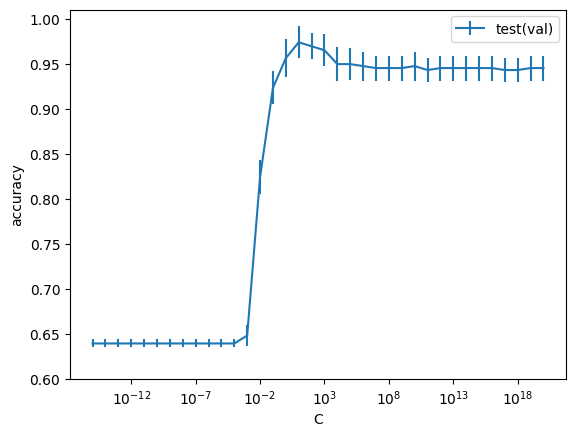

In [ ]:
# plt.errorbar(gs.cv_results_['param_C'].data,
#            gs.cv_results_['mean_train_score'],
#             yerr=gs.cv_results_['std_train_score'],
#             label="training")

plt.errorbar(gs.cv_results_['param_C'].data,
             gs.cv_results_['mean_test_score'],
             yerr=gs.cv_results_['std_test_score'],
             label="test(val)")

plt.ylim(.6, 1.01)
plt.xscale("log")
plt.xlabel("C")
plt.ylabel("accuracy")
plt.legend(loc="best");

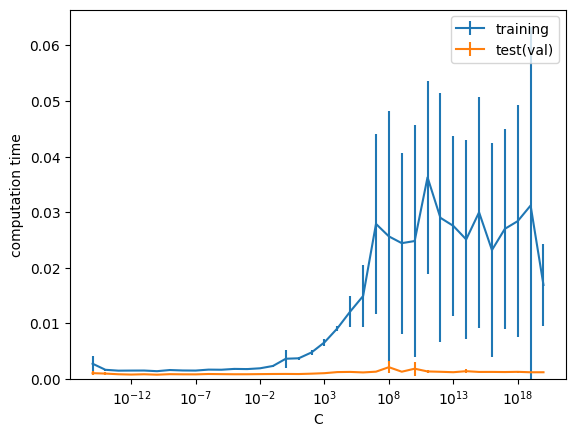

In [ ]:
plt.errorbar(gs.cv_results_['param_C'].data,
             gs.cv_results_['mean_fit_time'],
             yerr=gs.cv_results_['std_fit_time'],
             label="training")

plt.errorbar(gs.cv_results_['param_C'].data,
             gs.cv_results_['mean_score_time'],
             yerr=gs.cv_results_['std_score_time'],
             label="test(val)")

plt.ylim(0,)
plt.xscale("log")
plt.xlabel("C")
plt.ylabel("computation time")
plt.legend(loc="best");

### 2パラメータのSVM

In [ ]:
# Cとカーネル2つのパラメータでグリッドサーチする
from sklearn.svm import SVC

clf = SVC(gamma='auto')

C_range_exp = np.arange(-2.0, 5.0)
C_range = 10 ** C_range_exp

param = {'C': C_range,
         'kernel': ['linear', 'rbf']}

gs = GridSearchCV(clf, param, n_jobs=-1, verbose=2, return_train_score=True)
gs.fit(X_train, y_train)

Fitting 5 folds for each of 14 candidates, totalling 70 fits


GridSearchCV(estimator=SVC(gamma='auto'), n_jobs=-1,
             param_grid={'C': array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04]),
                         'kernel': ['linear', 'rbf']},
             return_train_score=True, verbose=2)

In [ ]:
gs.best_params_, gs.best_score_ , gs.best_estimator_

({'C': 1.0, 'kernel': 'linear'},
 0.9758241758241759,
 SVC(gamma='auto', kernel='linear'))

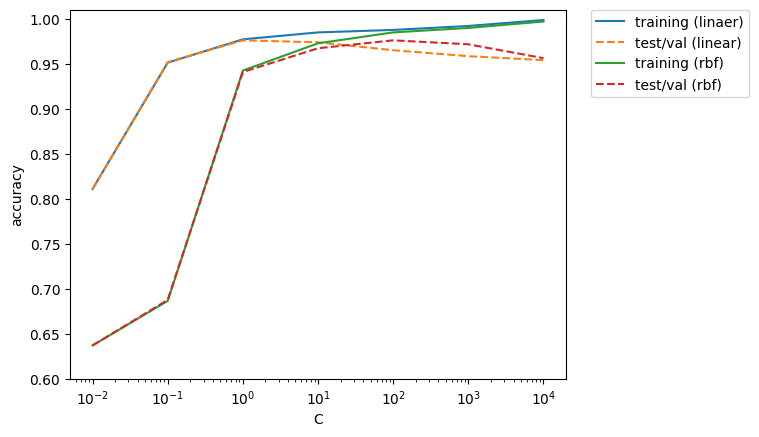

In [ ]:
s_linear = (gs.cv_results_['param_kernel']=='linear').data

plt.plot(gs.cv_results_['param_C'][s_linear].data,
         gs.cv_results_['mean_train_score'][s_linear],
         label="training (linaer)")

plt.plot(gs.cv_results_['param_C'][s_linear].data,
         gs.cv_results_['mean_test_score'][s_linear],
         linestyle="--",
         label="test/val (linear)")


s_rbf = (gs.cv_results_['param_kernel']=='rbf').data

plt.plot(gs.cv_results_['param_C'][s_rbf].data,
         gs.cv_results_['mean_train_score'][s_rbf],
         label="training (rbf)")

plt.plot(gs.cv_results_['param_C'][s_rbf].data,
         gs.cv_results_['mean_test_score'][s_rbf],
         linestyle="--",
         label="test/val (rbf)")



plt.ylim(.6, 1.01)
plt.xscale("log")
plt.xlabel("C")
plt.ylabel("accuracy")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [ ]:
gs.score(X_test, y_test)

0.9649122807017544

### 3パラメータのSVM

In [ ]:
# SVCにはC, kernelだけではなくgammaもある
# gammaも変えたら精度があがるのではないか？

SVC(kernel='rbf').gamma

'scale'

In [ ]:
# 3パラメータ（C, kernal, gamma）のSVM

clf = SVC()

C_range_exp = np.arange(-2.0, 5.0)
C_range = 10 ** C_range_exp

gamma_range_exp = np.arange(-10.0, 0.0, 3)  # 10の-10乗～-1乗まで3つおきに
gamma_range = 10 ** gamma_range_exp


# 3パラメータの時は、グリッドサーチのパラメータをリストにして表現
param = [{'C':C_range,
          'kernel':['linear']},   # こちらが最初のパラメータ

         {'C':C_range,
          'gamma':gamma_range,    # ここの行が追加されている
          'kernel':['rbf']}       # rbf側にしかgamma_rangeはサーチされない
         ]

gs = GridSearchCV(clf, param, n_jobs=-1, verbose=2, return_train_score=True)
gs.fit(X_train, y_train)

Fitting 5 folds for each of 35 candidates, totalling 175 fits


GridSearchCV(estimator=SVC(), n_jobs=-1,
             param_grid=[{'C': array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04]),
                          'kernel': ['linear']},
                         {'C': array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04]),
                          'gamma': array([1.e-10, 1.e-07, 1.e-04, 1.e-01]),
                          'kernel': ['rbf']}],
             return_train_score=True, verbose=2)

In [ ]:
gs.best_params_, gs.best_score_, gs.best_estimator_

({'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'},
 0.9780219780219781,
 SVC(C=10.0, gamma=0.1))

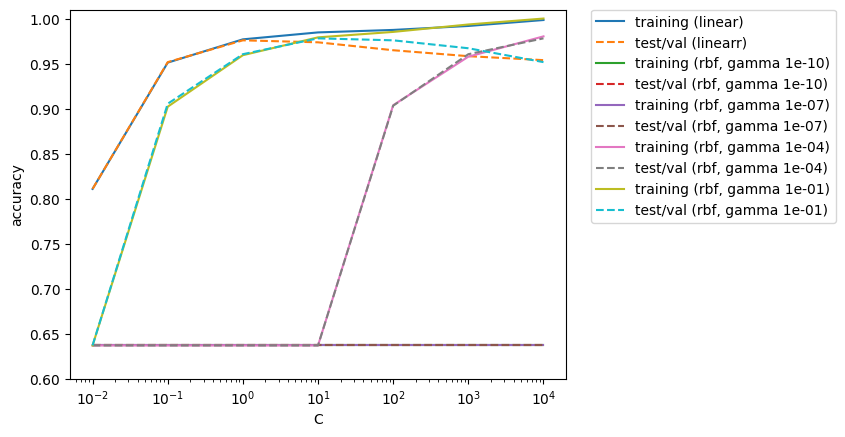

In [ ]:
s_linear = (gs.cv_results_['param_kernel']=='linear').data

plt.plot(gs.cv_results_['param_C'][s_linear].data,
         gs.cv_results_['mean_train_score'][s_linear],
         label="training (linear)")

plt.plot(gs.cv_results_['param_C'][s_linear].data,
         gs.cv_results_['mean_test_score'][s_linear],
         linestyle="--",
         label="test/val (linearr)")





s_rbf = (gs.cv_results_['param_kernel']=='rbf').data

for g in gamma_range:
    s_gamma = (gs.cv_results_['param_gamma'][s_rbf].data == g)

    plt.plot(gs.cv_results_['param_C'][s_rbf][s_gamma].data,
             gs.cv_results_['mean_train_score'][s_rbf][s_gamma],
             label="training (rbf, gamma {0:.0e})".format(g))

    plt.plot(gs.cv_results_['param_C'][s_rbf][s_gamma].data,
             gs.cv_results_['mean_test_score'][s_rbf][s_gamma],
             linestyle="--",
             label="test/val (rbf, gamma {0:.0e})".format(g))

plt.ylim(.6, 1.01)
plt.xscale("log")
plt.xlabel("C")
plt.ylabel("accuracy")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

### KNNでグリッドサーチ

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

clf = KNeighborsClassifier()

In [ ]:
param = {'n_neighbors':range(1,20)}

gs = GridSearchCV(clf, param, return_train_score=True)
gs.fit(X_train,y_train)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 20)}, return_train_score=True)

In [ ]:
gs.best_params_, gs.best_score_, gs.best_estimator_

({'n_neighbors': 3}, 0.9670329670329669, KNeighborsClassifier(n_neighbors=3))

In [ ]:
gs.score(X_test, y_test)

0.9473684210526315

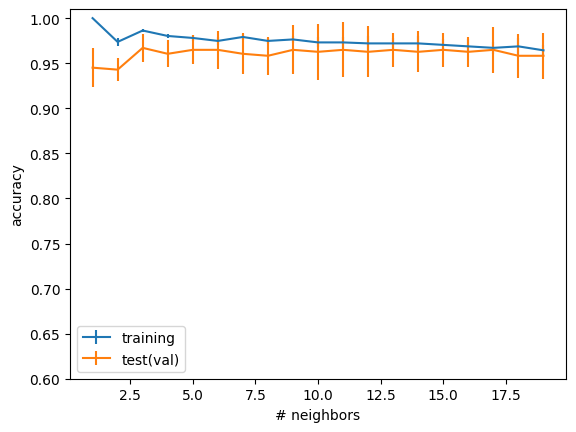

In [ ]:
plt.errorbar(gs.cv_results_['param_n_neighbors'].data,
             gs.cv_results_['mean_train_score'],
             yerr=gs.cv_results_['std_train_score'],
             label="training")

plt.errorbar(gs.cv_results_['param_n_neighbors'].data,
             gs.cv_results_['mean_test_score'],
             yerr=gs.cv_results_['std_test_score'],
             label="test(val)")

plt.ylim(.6, 1.01)
plt.xlabel("# neighbors")
plt.ylabel("accuracy")
plt.legend(loc="best");

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

clf = KNeighborsClassifier()

### MLPでランダムサーチ

In [ ]:
from sklearn.neural_network import MLPClassifier

clf = MLPClassifier(random_state=8, max_iter=2000)
clf

MLPClassifier(max_iter=2000, random_state=8)

In [ ]:
  param = {'hidden_layer_sizes' : [(10, ), (50, ), (100, ),
                                    (10,10, ), (50, 50, ), (100, 100, ), (10, 5, ), (5, 5, ),
                                    (30, 20, 10, ), (100, 1000, 50, ), (1000, 100, 50, ),
                                    (10, 10, 10), (50, 50, 50), (100, 100, 100)],
            'activation' : ['identity', 'logistic', 'tanh', 'relu'],
            'beta_1': [0.9, 0.8, 0.7, 0.6, 0.5],
            'beta_2': [0.999, 0.9, 0.8, 0.7],
            'alpha': [1e-5, 1e-4, 1e-3, 1e-2, 1e-1],
            }

In [ ]:
# 下記コードを実行すると、組み合わせが6720通りあり、終わらない
# そのため、RondomeizedSearchCVを使用する

# gs = GridSearchCV(clf, param, n_jobs=-1, verbose=1, return_train_score=True)
# gs.fit(X_train, y_train)

# # Fitting 3 folds for each of 6720 candidates, totalling 20160 fits

In [ ]:
#RandomizedSearchCV：6720通りの中からランダムにいくつか取り出して試してみようということ

from sklearn.model_selection import RandomizedSearchCV

gs = RandomizedSearchCV(clf, param,
                        n_iter=20,
                        n_jobs=-1, verbose=2)
gs.fit(X_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


KeyboardInterrupt: ignored

In [ ]:
gs.best_params_, gs.best_score_, gs.best_estimator_

In [ ]:
gs.score(X_test,y_test)

## 8-2 パイプライン

### PCAとロジスティック回帰を一緒に

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
# PCAの白色化する

from sklearn.decomposition import PCA

pca = PCA(whiten=True)
pca.fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca  = pca.transform(X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(solver='liblinear')

In [ ]:
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.956140350877193

PythonのPipeline（パイプライン）オブジェクトは、データ処理および機械学習モデリングにおいて、一連の処理ステップを順番に組み合わせるための便利なツールです。主に以下のような用途で利用されます：


* **データ前処理の自動化:**  データ分析や機械学習プロジェクトでは、データのクリーニング、スケーリング、特徴量エンジニアリングなどの前処理ステップが必要です。Pipelineを使用すると、これらのステップを一連の処理ステップとして定義し、データを自動的に処理できます。

* **モデル構築と評価の自動化:**  Pipelineは、モデルの構築、トレーニング、評価のステップをシームレスに統合できます。これにより、モデルのトレーニングと評価を一貫した方法で行うことができます。

* **ハイパーパラメータの最適化:** ハイパーパラメータ最適化の一部として、Pipeline内の各ステップのハイパーパラメータの調整も可能です。これにより、最適なモデル構築プロセスを自動化できます。


PythonのPipelineオブジェクトは、一般的に以下のステップから構成されます：

* 前処理ステップ: データの前処理ステップ（例: 特徴量のスケーリング、欠損値の処*理）が含まれます。
* モデルステップ: モデルの選択およびトレーニングステップが含まれます。
* 評価ステップ: モデルの性能評価ステップ（例: 正確度、F1スコア）が含まれます。

In [ ]:
# pipelineオブジェクトを使うことで、白色化してtransformして、などの処理を省ける

from sklearn.pipeline import Pipeline

# 説明変数のPCA白色化→モデル構築の一連流れをpipelineで書く
estimators = [('pca', PCA(whiten=True)),
              ('clf', LogisticRegression())]

# pipeの中に、作成した流れ(estimators)を入れる
pipe = Pipeline(estimators)

In [ ]:
# 白色化した後に、モデルを構築している
pipe.fit(X_train, y_train)

Pipeline(steps=[('pca', PCA(whiten=True)), ('clf', LogisticRegression())])

In [ ]:
pipe.score(X_test, y_test)

0.9649122807017544

### スケーリングとSVMを一緒に

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC

estimators = [('mms', MinMaxScaler()),
              ('clf', SVC(kernel='rbf', C=1e10))]
pipe = Pipeline(estimators)

In [ ]:
pipe.fit(X_train, y_train)

Pipeline(steps=[('mms', MinMaxScaler()), ('clf', SVC(C=10000000000.0))])

In [ ]:
pipe.score(X_test,y_test)

0.9649122807017544

### 前処理もグリッドサーチで

In [ ]:
estimators = [('pca', PCA(whiten=True)),
              ('clf', LogisticRegression())]

pipe = Pipeline(estimators)

In [ ]:
from sklearn.model_selection import GridSearchCV

param = {'clf__C' : [1e-5, 1e-3, 1e-2, 1, 1e5, 1e10]}

# gsの中にpipelineをいれる
gs = GridSearchCV(pipe, param)
gs.fit(X_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

GridSearchCV(estimator=Pipeline(steps=[('pca', PCA(whiten=True)),
                                       ('clf', LogisticRegression())]),
             param_grid={'clf__C': [1e-05, 0.001, 0.01, 1, 100000.0,
                                    10000000000.0]})

In [ ]:
gs.best_params_, gs.best_score_, gs.best_estimator_

({'clf__C': 1},
 0.9626373626373625,
 Pipeline(steps=[('pca', PCA(whiten=True)), ('clf', LogisticRegression(C=1))]))

In [ ]:
gs.score(X_test, y_test)

0.9649122807017544

In [ ]:
# 前処理+SVMをpipelineでやってみよう

from sklearn.svm import SVC

C_range = [1e-3, 1e-2, 1, 1e2, 1e3]

param = {'clf__C': C_range,
         'clf__kernel': ['linear', 'rbf'],
         'pca__whiten': [True, False],
         'pca__n_components': [30, 20, 10]}

estimators = [('pca', PCA()),
              ('clf', SVC(gamma='auto'))]

pipe = Pipeline(estimators)


from sklearn.model_selection import RandomizedSearchCV

gs = RandomizedSearchCV(pipe, param, n_jobs=-1, verbose=2)
gs.fit(X_train, y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


RandomizedSearchCV(estimator=Pipeline(steps=[('pca', PCA()),
                                             ('clf', SVC(gamma='auto'))]),
                   n_jobs=-1,
                   param_distributions={'clf__C': [0.001, 0.01, 1, 100.0,
                                                   1000.0],
                                        'clf__kernel': ['linear', 'rbf'],
                                        'pca__n_components': [30, 20, 10],
                                        'pca__whiten': [True, False]},
                   verbose=2)

In [ ]:
gs.best_params_, gs.best_score_, gs.best_estimator_

({'pca__whiten': True,
  'pca__n_components': 30,
  'clf__kernel': 'linear',
  'clf__C': 1},
 0.9582417582417582,
 Pipeline(steps=[('pca', PCA(n_components=30, whiten=True)),
                 ('clf', SVC(C=1, gamma='auto', kernel='linear'))]))

In [ ]:
gs.score(X_test, y_test)

0.956140350877193

## 8-3 正則化パラメータ

ここでは、精度に影響を与えるといっていた'C'というパラメータがどういうものか確認する

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
plt.set_cmap(plt.cm.Paired) # 色設定

<Figure size 640x480 with 0 Axes>

In [ ]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X = data.data
y = data.target

In [ ]:
from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test  = scaler.transform(X_test)

In [ ]:
# 非線形SVMでCパラメータがどうなるか確認する
from sklearn.svm import SVC
clf = SVC(kernel='rbf', gamma='auto')

In [ ]:
# Cを変えるとどうなるか？
clf.C = 1
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.956140350877193

In [ ]:
# 良い精度を出すにはCパラメータを調整する必要がある。
# 一方で、Cを調整しすぎると過学習を起こす
clf.C = 1000
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9824561403508771

In [ ]:
import time

In [ ]:
# Cのパラメータを変更したとき、精度と学習時間がどうなるか確認する
# まずは、Cの値による精度を確認

C_range_exp = np.arange(-20., 20.)
C_range = 10 ** C_range_exp

scores = []
comp_time = []

for C in C_range:
  clf.C = C

  st = time.time()
  clf.fit(X_train, y_train)
  comp_time.append(time.time() - st)

  score = clf.score(X_test, y_test)
  print(C, score)
  scores.append(score)

scores = np.array(scores)
comp_time = np.array(comp_time)

1e-20 0.5877192982456141
1e-19 0.5877192982456141
1e-18 0.5877192982456141
1e-17 0.5877192982456141
1e-16 0.5877192982456141
1e-15 0.5877192982456141
1e-14 0.5877192982456141
1e-13 0.5877192982456141
1e-12 0.5877192982456141
1e-11 0.5877192982456141
1e-10 0.5877192982456141
1e-09 0.5877192982456141
1e-08 0.5877192982456141
1e-07 0.5877192982456141
1e-06 0.5877192982456141
1e-05 0.5877192982456141
0.0001 0.5877192982456141
0.001 0.5877192982456141
0.01 0.5877192982456141
0.1 0.6842105263157895
1.0 0.956140350877193
10.0 0.9649122807017544
100.0 0.9649122807017544
1000.0 0.9824561403508771
10000.0 0.9824561403508771
100000.0 0.9824561403508771
1000000.0 0.9824561403508771
10000000.0 0.9824561403508771
100000000.0 0.9824561403508771
1000000000.0 0.9824561403508771
10000000000.0 0.9824561403508771
100000000000.0 0.9824561403508771
1000000000000.0 0.9824561403508771
10000000000000.0 0.9824561403508771
100000000000000.0 0.9824561403508771
1000000000000000.0 0.9824561403508771
1e+16 0.9824561

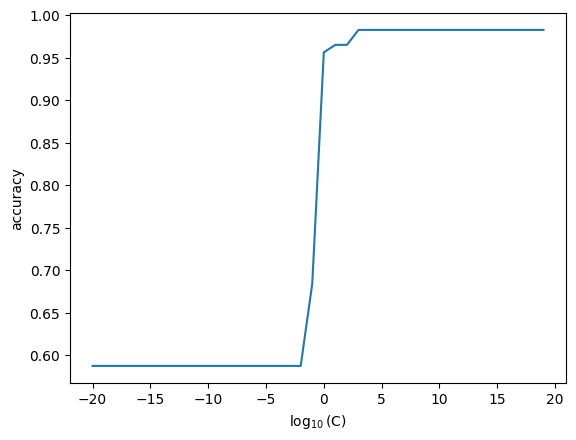

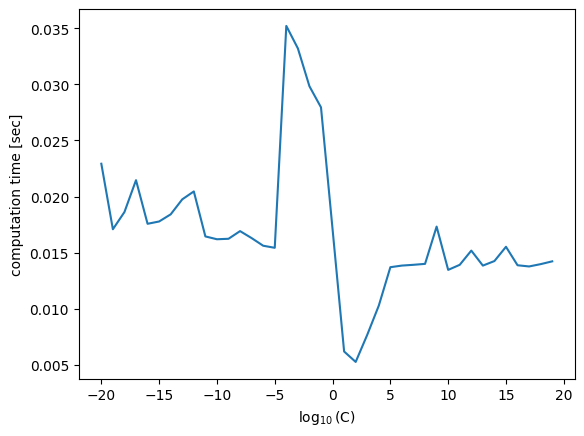

In [ ]:
# 精度と学習時間を可視化
plt.plot(C_range_exp, scores)
plt.ylabel("accuracy")
plt.xlabel(r"$\log_{10}$(C)");
plt.show()

plt.plot(C_range_exp, comp_time)
plt.ylabel("computation time [sec]")
plt.xlabel(r"$\log_{10}$(C)");

In [ ]:
# ロジスティック回帰でも同様のことを確認する

from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()

In [ ]:
clf.C = 1
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9649122807017544

In [ ]:
clf.C = 1000
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9473684210526315

In [ ]:
clf.C = 100
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.9736842105263158

In [ ]:
C_range_exp = np.arange(-20., 20.)
C_range = 10 ** C_range_exp

scores = []
comp_time = []

for C in C_range:
  clf.C = C

  st = time.time()
  clf.fit(X_train, y_train)
  comp_time.append(time.time() - st)

  score = clf.score(X_test, y_test)
  print(C, score)
  scores.append(score)

scores = np.array(scores)
comp_time = np.array(comp_time)

1e-20 0.41228070175438597
1e-19 0.41228070175438597
1e-18 0.5877192982456141
1e-17 0.5877192982456141
1e-16 0.5877192982456141
1e-15 0.5877192982456141
1e-14 0.5877192982456141
1e-13 0.5877192982456141
1e-12 0.5877192982456141
1e-11 0.5877192982456141
1e-10 0.5877192982456141
1e-09 0.5877192982456141
1e-08 0.5877192982456141
1e-07 0.5877192982456141
1e-06 0.5877192982456141
1e-05 0.5877192982456141
0.0001 0.5877192982456141
0.001 0.5877192982456141
0.01 0.7192982456140351
0.1 0.9473684210526315
1.0 0.9649122807017544
10.0 0.9649122807017544
100.0 0.9736842105263158
1000.0 0.9473684210526315
10000.0 0.9473684210526315
100000.0 0.9473684210526315
1000000.0 0.9473684210526315
10000000.0 0.956140350877193
100000000.0 0.956140350877193
1000000000.0 0.9473684210526315
10000000000.0 0.956140350877193
100000000000.0 0.9473684210526315
1000000000000.0 0.9473684210526315
10000000000000.0 0.9473684210526315
100000000000000.0 0.9473684210526315
1000000000000000.0 0.9473684210526315
1e+16 0.9473684

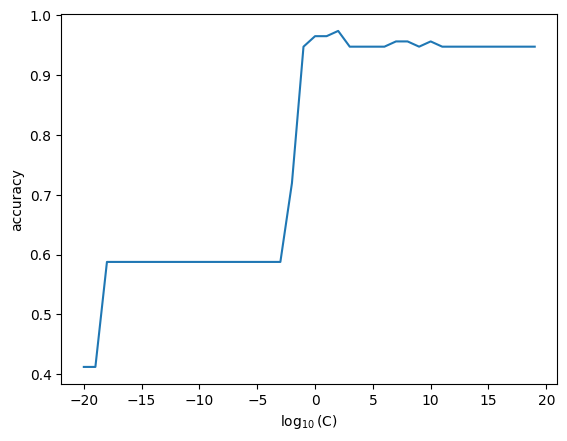

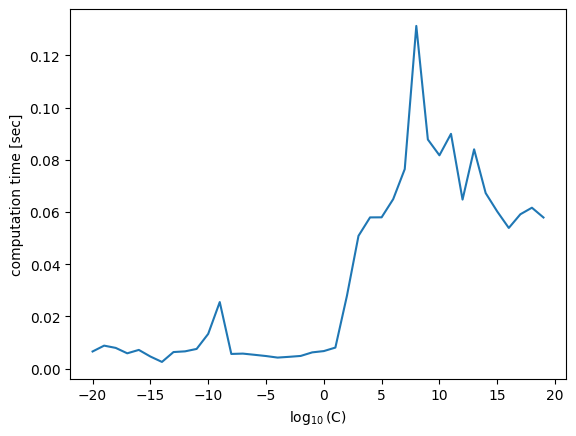

In [ ]:
# 精度と学習時間を可視化
plt.plot(C_range_exp, scores)
plt.ylabel("accuracy")
plt.xlabel(r"$\log_{10}$(C)");
plt.show()

plt.plot(C_range_exp, comp_time)
plt.ylabel("computation time [sec]")
plt.xlabel(r"$\log_{10}$(C)");

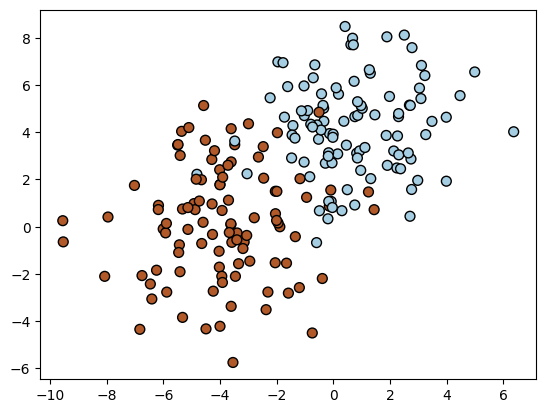

In [ ]:
# 下記の散布図をCを変えながら識別境界を変えてみる
from sklearn.datasets import make_blobs

X, y = make_blobs(n_samples=200, # 20個生成
                  n_features=2, # 2次元
                  centers=2,    # クラスタ中心2個
                  cluster_std =2, # クラスタの大きさ（標準偏差）
                  random_state=3   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット

In [ ]:
def plotSVMBoundary(X, clf, mesh=True, boundary=True):

    # if SVM, draw margine lines
    colors = ['k']*3
    linestyles = ['-']*3
    levels = [-1, 0, 1]
    # if SVM, plot support vecters
    plt.scatter(clf.support_vectors_[:, 0],
                clf.support_vectors_[:, 1],
                s=80, facecolors='none', edgecolors='k')

    # plot range
    x_min = min(X[:,0])
    x_max = max(X[:,0])
    y_min = min(X[:,1])
    y_max = max(X[:,1])

    # visualizing decision function
    XX, YY = np.mgrid[x_min:x_max:200j, y_min:y_max:200j] # make a grid
    Z = clf.decision_function(np.c_[XX.ravel(), YY.ravel()]) # evaluate the value
    Z = Z.reshape(XX.shape) # just reshape

    if mesh:
        plt.pcolormesh(XX, YY, Z > 0, cmap=plt.cm.Paired, zorder=-10)
    if boundary:
        plt.contour(XX, YY, Z,
                    colors=colors,
                    linestyles=linestyles,
                    levels=levels) # draw lines (level=0:boundary, level=+-1:margine lines)

    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)

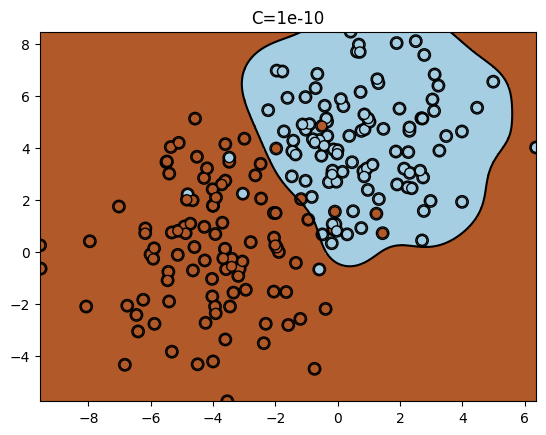

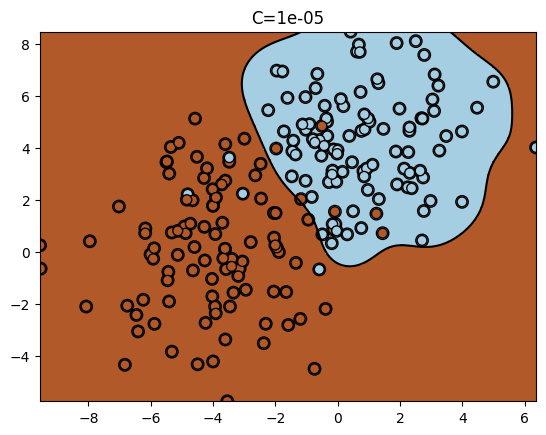

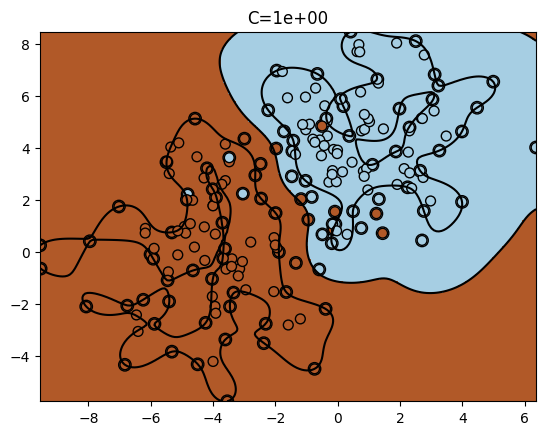

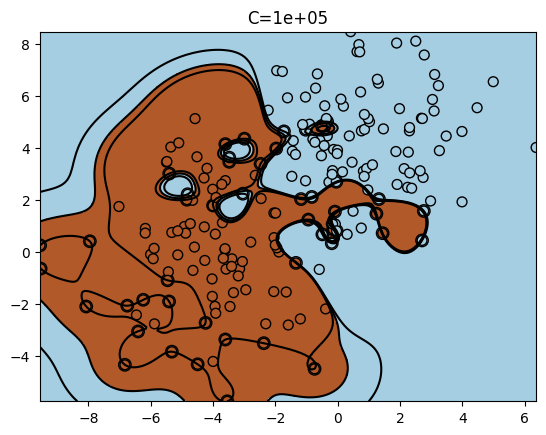

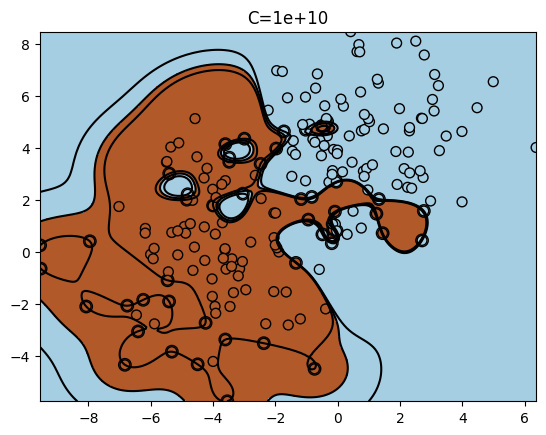

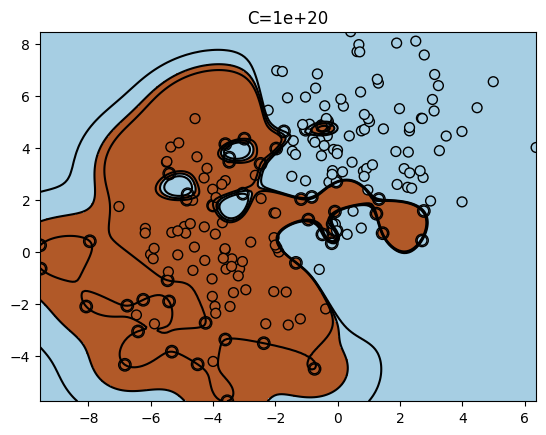

In [ ]:
# Cを増加させていくと境界線が複雑化し過学習しているのがよくわかる
from sklearn.svm import SVC

clf = SVC()
clf.kernel = 'rbf'
clf.gamma = 'auto'

for C in [1e-10, 1e-5, 1, 1e5, 1e10, 1e20]:

    clf.C = C
    clf.fit(X,y)
    plotSVMBoundary(X, clf, mesh=True)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
    plt.title("C={0:.0e}".format(C))

    plt.show()

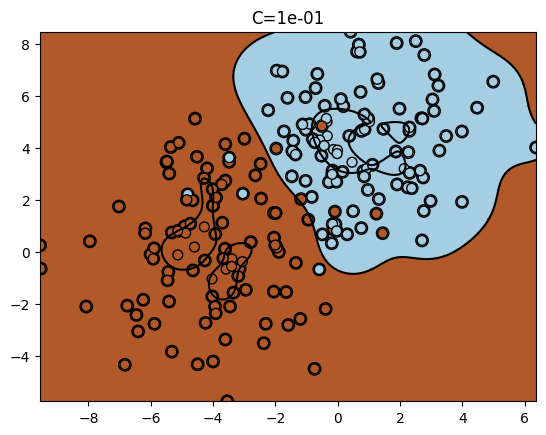

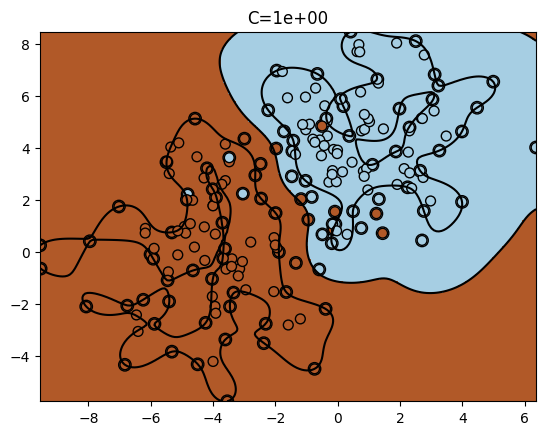

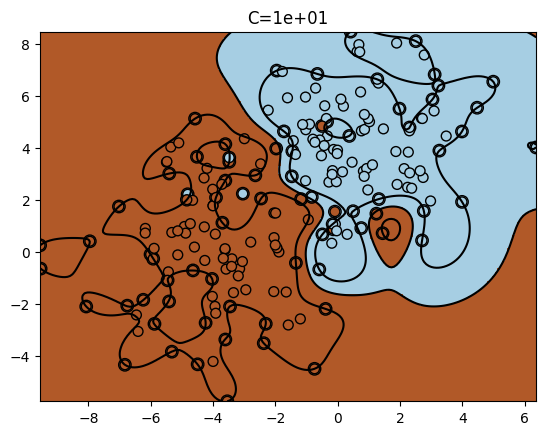

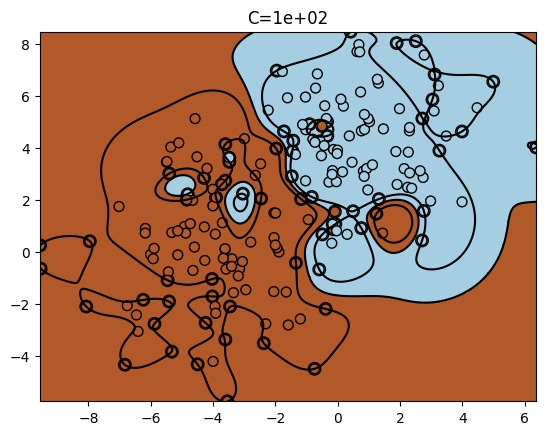

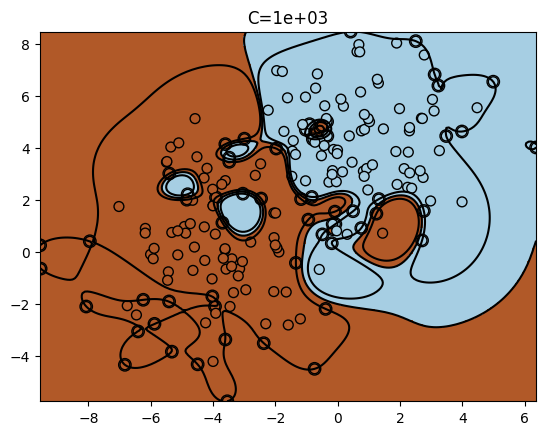

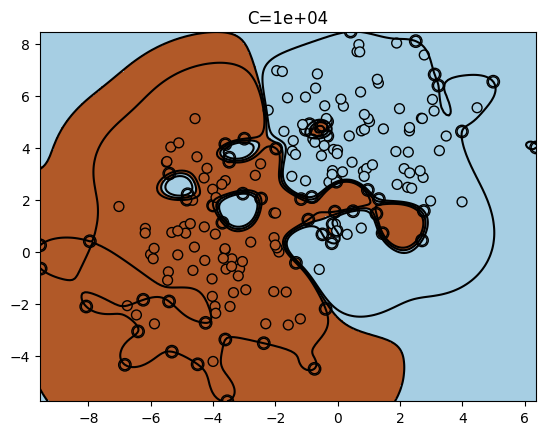

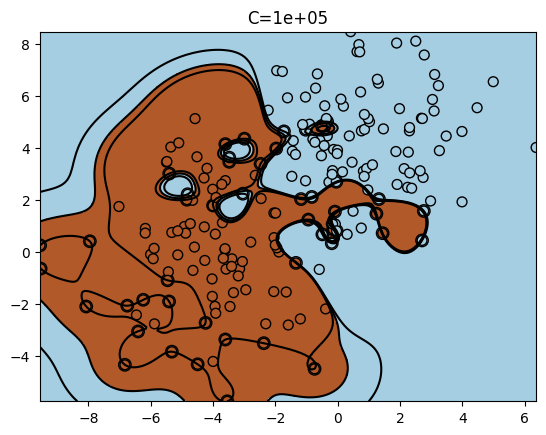

In [ ]:
# Cの値が10の―1~10の範囲で識別境界が大きく変わっていたので、その間を細かく見る
# Cを-1~`6の値で見る

from sklearn.svm import SVC

clf = SVC()
clf.kernel = 'rbf'
clf.gamma = 'auto'

for C in 10 ** np.arange(-1.0, 6.0):

    clf.C = C
    clf.fit(X,y)
    plotSVMBoundary(X, clf, mesh=True)
    plt.scatter(X[:, 0], X[:, 1], marker='o', s=50, c=y, edgecolors='k')
    plt.title("C={0:.0e}".format(C))

    plt.show()

(-10.0, 10.0)

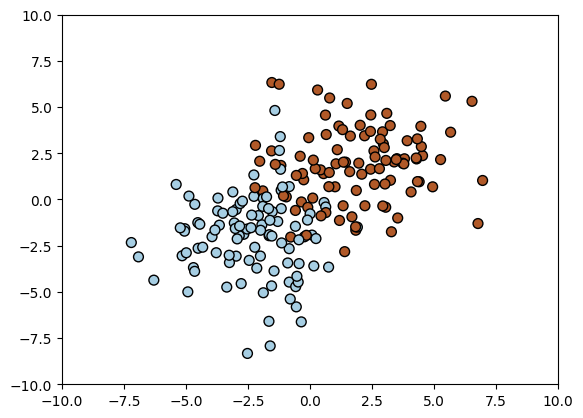

In [ ]:
# 毎回サンプルを変えた場合どうなるのか？
# 最初のサンプルで学習して、次のランダムサンプルを当てることはできるのか？を確認する
from sklearn.datasets import make_blobs

X, y = make_blobs(n_samples=200, # 20個生成
                  n_features=2, # 2次元
                  centers=[(-2, -2), (2, 2)],    # クラスタ中心2個
                  cluster_std=2, # クラスタの大きさ（標準偏差）
                  # random_state=3   # 乱数種（再現用）
                 )
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, edgecolors='k'); # 2次元散布図でプロット
plt.xlim(-10,10)
plt.ylim(-10,10)

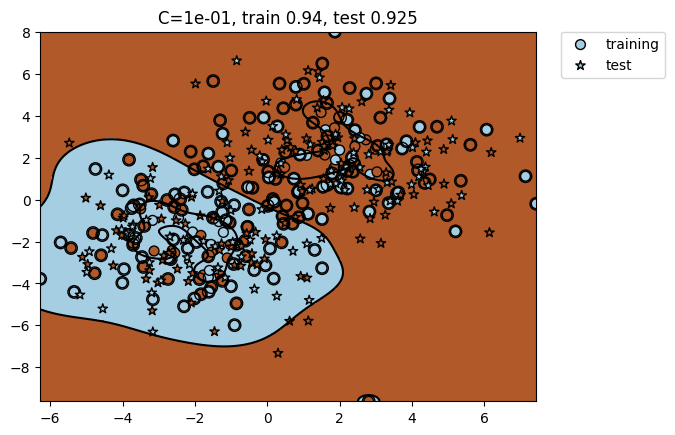

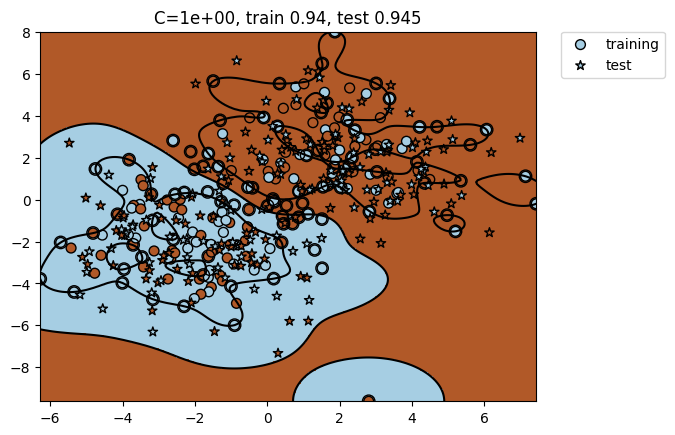

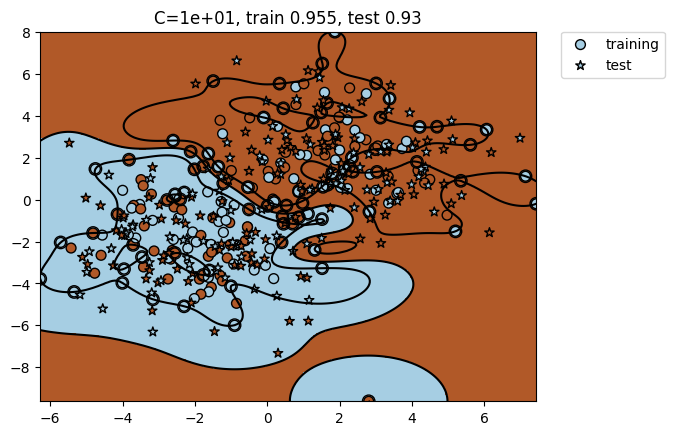

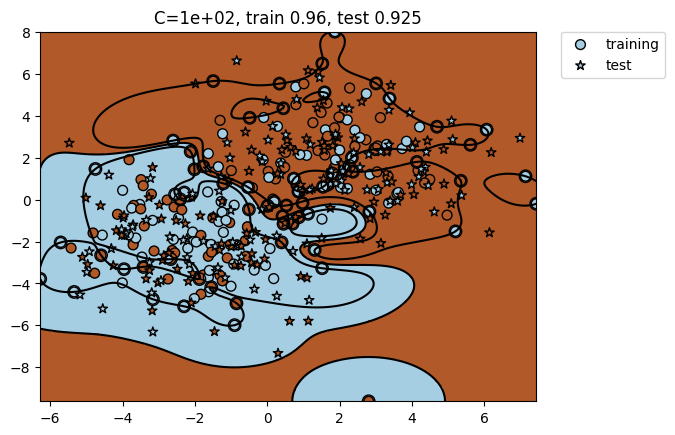

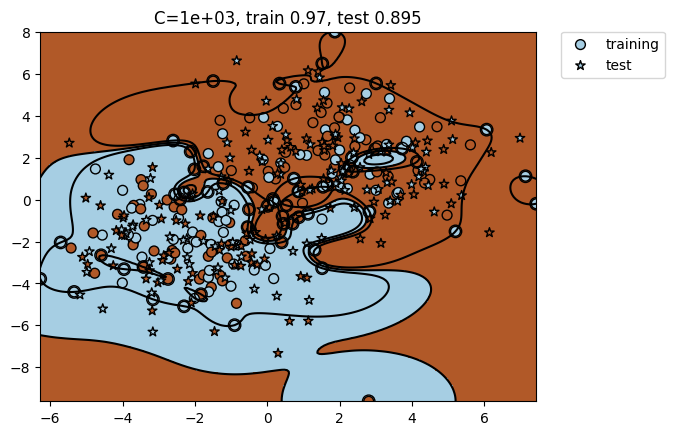

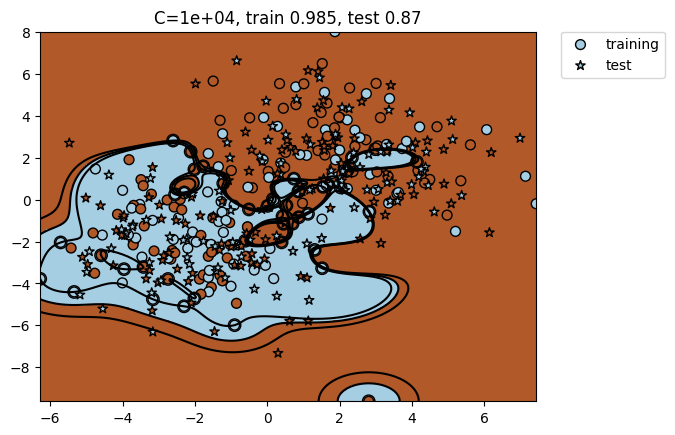

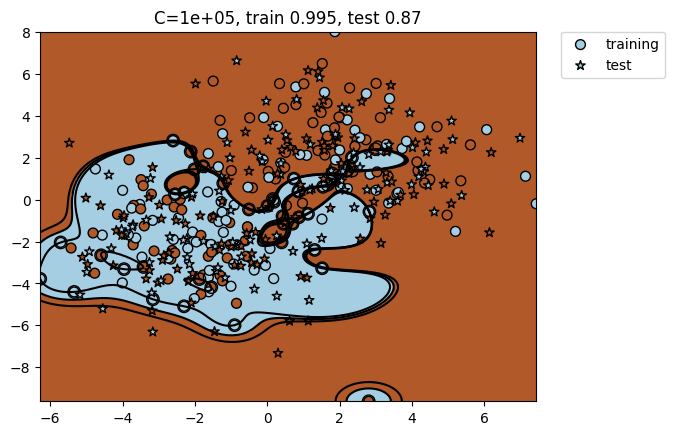

In [ ]:

from sklearn.svm import SVC

clf = SVC()
clf.kernel = 'rbf'
clf.gamma = 'auto'

X_train, y_train = make_blobs(n_samples=200, # 20個生成
              n_features=2, # 2次元
              centers=[(-2, -2), (2, 2)],    # クラスタ中心2個
              cluster_std=2, # クラスタの大きさ（標準偏差）
              # random_state=3   # 乱数種（再現用）
             )

X_test, y_test = make_blobs(n_samples=200, # 20個生成
      n_features=2, # 2次元
      centers=[(-2, -2), (2, 2)],    # クラスタ中心2個
      cluster_std=2, # クラスタの大きさ（標準偏差）
      # random_state=3   # 乱数種（再現用）
     )


for C in 10 ** np.arange(-1.0, 6.0):

    clf.C = C

    plt.scatter(X_train[:, 0], X_train[:, 1], marker='o', s=50, c=y, label="training", edgecolors='k')

    clf.fit(X_train, y_train)
    train_score = clf.score(X_train, y_train)

    plotSVMBoundary(X_train, clf, mesh=True)

    plt.scatter(X_test[:, 0], X_test[:, 1], marker='*', s=50, c=y, label="test", edgecolors='k')

    test_score = clf.score(X_test, y_test)

    plt.title("C={0:.0e}, train {1}, test {2}".format(C, train_score, test_score))

    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

    plt.show()

# 学習サンプル数が多いとき

## 9-1 LinearSVM

LinearSVMはデータサンプル数が多いときに有効

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from sklearn.datasets import load_breast_cancer
data = load_breast_cancer()
X = data.data
y = data.target

from sklearn.model_selection import ShuffleSplit
ss = ShuffleSplit(n_splits=1,
                  train_size=0.8,
                  test_size=0.2,
                  random_state=0)

train_index, test_index = next(ss.split(X, y))

X_train, X_test = X[train_index], X[test_index]
y_train, y_test = y[train_index], y[test_index]

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test  = scaler.transform(X_test)


In [ ]:
import time

In [ ]:
from sklearn.svm import SVC

clf = SVC(kernel='linear')


In [ ]:
clf.C = 1

st = time.time()
clf.fit(X_train, y_train)
print(1000 * (time.time() - st), "[ms]")

clf.score(X_test, y_test)

14.750957489013672 [ms]


0.9649122807017544

In [ ]:
clf.C = 1e20

st = time.time()
clf.fit(X_train, y_train)
print(1000 * (time.time() - st), "[ms]")

clf.score(X_test, y_test)

558.4166049957275 [ms]


0.956140350877193

In [ ]:
# Cパラメータを変えながらグリッドサーチする

from sklearn.model_selection import GridSearchCV

param = {'C': 10**np.arange(-15.0,21.0)}

gs = GridSearchCV(clf, param, verbose=1, return_train_score=True)
gs.fit(X_train, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


GridSearchCV(estimator=SVC(C=1e+20, kernel='linear'),
             param_grid={'C': array([1.e-15, 1.e-14, 1.e-13, 1.e-12, 1.e-11, 1.e-10, 1.e-09, 1.e-08,
       1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00,
       1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06, 1.e+07, 1.e+08,
       1.e+09, 1.e+10, 1.e+11, 1.e+12, 1.e+13, 1.e+14, 1.e+15, 1.e+16,
       1.e+17, 1.e+18, 1.e+19, 1.e+20])},
             return_train_score=True, verbose=1)

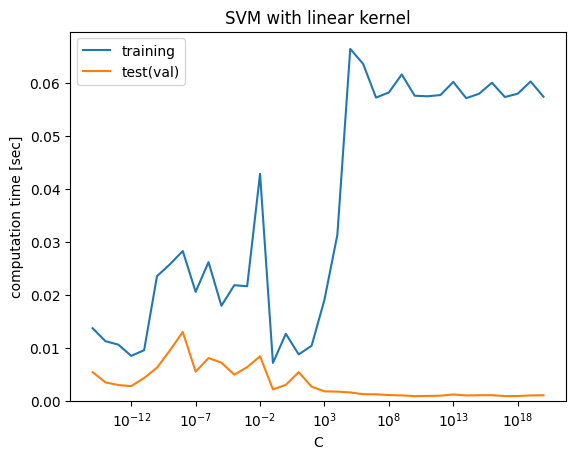

In [ ]:
# Cを変えながら学習時間を可視化する
# これが普通のSVMの学習時間となる
plt.plot(gs.cv_results_['param_C'].data,
         gs.cv_results_['mean_fit_time'],
         label="training")

plt.plot(gs.cv_results_['param_C'].data,
         gs.cv_results_['mean_score_time'],
         label="test(val)")

plt.ylim(0,)
plt.xscale("log")
plt.xlabel("C")
plt.ylabel("computation time [sec]")
plt.legend(loc="best");
plt.title("SVM with linear kernel");

In [ ]:
# サンプル数が多いときに有効なLinearSVCはどうなるか？
from sklearn.svm import LinearSVC

clf = LinearSVC()

In [ ]:
clf.C = 1

st = time.time()
clf.fit(X_train, y_train)
print(1000 * (time.time() - st), "[ms]")

clf.score(X_test, y_test)

6.844758987426758 [ms]


0.9649122807017544

In [ ]:
clf.C = 1e20

st = time.time()
clf.fit(X_train, y_train)
print(1000 * (time.time() - st), "[ms]")

clf.score(X_test, y_test)

14.034748077392578 [ms]


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


0.9736842105263158

In [ ]:
from sklearn.model_selection import GridSearchCV

param = {'C': 10**np.arange(-15.0,21.0)}

gs2 = GridSearchCV(clf, param, verbose=1, return_train_score=True)
gs2.fit(X_train, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  w

GridSearchCV(estimator=LinearSVC(C=1e+20),
             param_grid={'C': array([1.e-15, 1.e-14, 1.e-13, 1.e-12, 1.e-11, 1.e-10, 1.e-09, 1.e-08,
       1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00,
       1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06, 1.e+07, 1.e+08,
       1.e+09, 1.e+10, 1.e+11, 1.e+12, 1.e+13, 1.e+14, 1.e+15, 1.e+16,
       1.e+17, 1.e+18, 1.e+19, 1.e+20])},
             return_train_score=True, verbose=1)

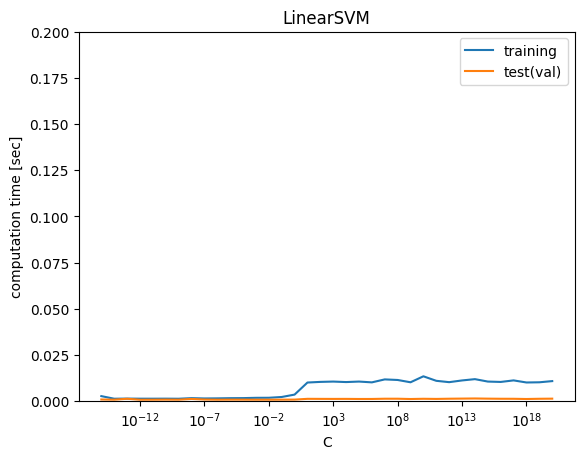

In [ ]:
# 格段に早いのが分かる
plt.plot(gs2.cv_results_['param_C'].data,
         gs2.cv_results_['mean_fit_time'],
         label="training")

plt.plot(gs2.cv_results_['param_C'].data,
         gs2.cv_results_['mean_score_time'],
         label="test(val)")

plt.ylim(0,0.2)
plt.xscale("log")
plt.xlabel("C")
plt.ylabel("computation time [sec]")
plt.legend(loc="best")
plt.title("LinearSVM");

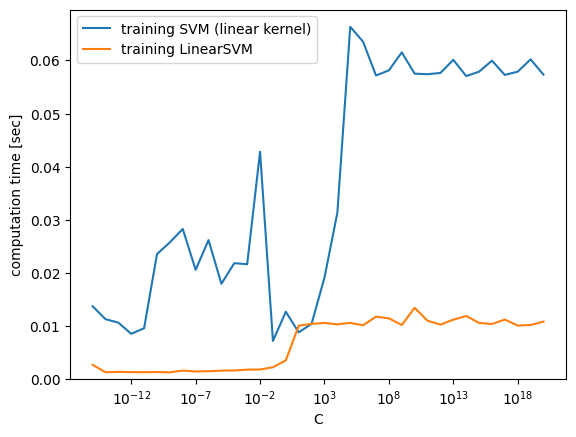

In [ ]:
# 学習時間比較
plt.plot(gs.cv_results_['param_C'].data,
         gs.cv_results_['mean_fit_time'],
         label="training SVM (linear kernel)")

plt.plot(gs2.cv_results_['param_C'].data,
         gs2.cv_results_['mean_fit_time'],
         label="training LinearSVM")

plt.ylim(0,)
plt.xscale("log")
plt.xlabel("C")
plt.ylabel("computation time [sec]")
plt.legend(loc="best");

In [ ]:
# 一連の流れをPipelineにも入れてみる

from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline

estimators = [('scaler', MinMaxScaler()),
              ('clf', LinearSVC())]    # スケーリングと線形SVMのPipeline

pipe = Pipeline(estimators)

In [ ]:
from sklearn.model_selection import GridSearchCV

param = {'clf__C': 10**np.arange(-15.0,21.0)}

gs = GridSearchCV(pipe, param, verbose=1, return_train_score=True)
gs.fit(X_train, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


GridSearchCV(estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('clf', LinearSVC())]),
             param_grid={'clf__C': array([1.e-15, 1.e-14, 1.e-13, 1.e-12, 1.e-11, 1.e-10, 1.e-09, 1.e-08,
       1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00,
       1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06, 1.e+07, 1.e+08,
       1.e+09, 1.e+10, 1.e+11, 1.e+12, 1.e+13, 1.e+14, 1.e+15, 1.e+16,
       1.e+17, 1.e+18, 1.e+19, 1.e+20])},
             return_train_score=True, verbose=1)

Text(0.5, 1.0, 'LinearSVM')

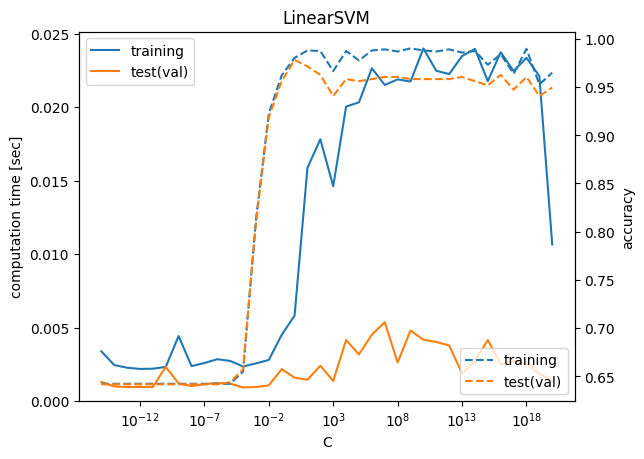

In [ ]:
plt.plot(gs.cv_results_['param_clf__C'].data,
         gs.cv_results_['mean_fit_time'],
         label="training")

plt.plot(gs.cv_results_['param_clf__C'].data,
         gs.cv_results_['mean_score_time'],
         label="test(val)")
plt.ylabel("computation time [sec]")
plt.ylim(0,)
plt.xscale("log")
plt.xlabel("C")
plt.legend(loc="upper left");

plt.twinx()

plt.plot(gs.cv_results_['param_clf__C'].data,
         gs.cv_results_['mean_train_score'],
         linestyle="--",
         label="training")

plt.plot(gs.cv_results_['param_clf__C'].data,
         gs.cv_results_['mean_test_score'],
         linestyle="--",
         label="test(val)")
plt.ylabel("accuracy")
plt.legend(loc="lower right");

plt.title("LinearSVM")

In [ ]:
# 線形SVMではなく、普通のSVMを確認する

from sklearn.preprocessing import MaxAbsScaler

estimators = [('scaler', MinMaxScaler()),
              ('clf', SVC(kernel='linear'))]   # kernel = linearのSVCを実行

pipe = Pipeline(estimators)

In [ ]:
from sklearn.model_selection import GridSearchCV

param = {'clf__C': 10**np.arange(-15.0,21.0)}

gs = GridSearchCV(pipe, param, verbose=1, return_train_score=True)
gs.fit(X_train, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


GridSearchCV(estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('clf', SVC(kernel='linear'))]),
             param_grid={'clf__C': array([1.e-15, 1.e-14, 1.e-13, 1.e-12, 1.e-11, 1.e-10, 1.e-09, 1.e-08,
       1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00,
       1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06, 1.e+07, 1.e+08,
       1.e+09, 1.e+10, 1.e+11, 1.e+12, 1.e+13, 1.e+14, 1.e+15, 1.e+16,
       1.e+17, 1.e+18, 1.e+19, 1.e+20])},
             return_train_score=True, verbose=1)

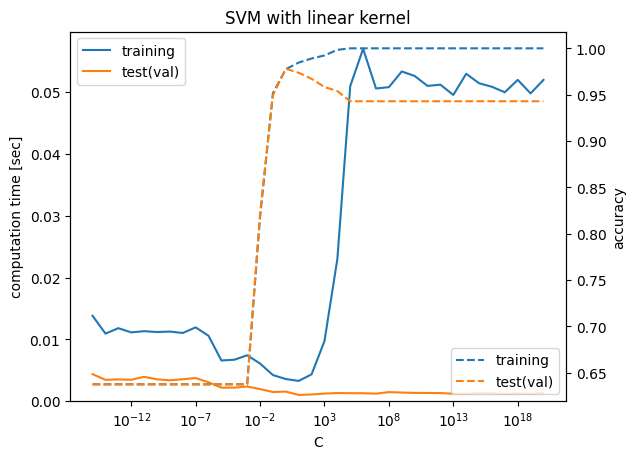

In [ ]:
plt.plot(gs.cv_results_['param_clf__C'].data,
         gs.cv_results_['mean_fit_time'],
         label="training")

plt.plot(gs.cv_results_['param_clf__C'].data,
         gs.cv_results_['mean_score_time'],
         label="test(val)")
plt.ylabel("computation time [sec]")
plt.ylim(0,)
plt.xscale("log")
plt.xlabel("C")
plt.legend(loc="upper left");

plt.twinx()

plt.plot(gs.cv_results_['param_clf__C'].data,
         gs.cv_results_['mean_train_score'],
         linestyle="--",
         label="training")

plt.plot(gs.cv_results_['param_clf__C'].data,
         gs.cv_results_['mean_test_score'],
         linestyle="--",
         label="test(val)")
plt.ylabel("accuracy")
plt.legend(loc="lower right");

plt.title("SVM with linear kernel");

## 9-2 確率勾配法

In [ ]:
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
import time

In [ ]:
# from sklearn.datasets import fetch_mldata
# mnist = fetch_mldata('MNIST original')
from sklearn.datasets import fetch_openml
mnist = fetch_openml('mnist_784', version=1)

# MNISTの場合，60000が学習，10000がテスト，と決まっている
# http://yann.lecun.com/exdb/mnist/

X_train, X_test = mnist.data[:60000]/255., mnist.data[60000:]/255.
y_train, y_test = mnist.target[:60000], mnist.target[60000:]

In [ ]:
X_train.shape, y_train.shape

((60000, 784), (60000,))

In [ ]:
#　確率勾配法：SGD
from sklearn.linear_model import SGDClassifier

In [ ]:
clf = SGDClassifier(loss='log') # Logistic Regression(ロジスティック回帰の早いバージョン)

In [ ]:
for thin in [100, 50, 10, 5, 4, 3, 2, 1]:
    st = time.time()
    clf.fit(X_train[::thin], y_train[::thin])
    et = time.time() - st
    score = clf.score(X_test[::thin], y_test[::thin])
    print("{0:.2f} sec, size {1}, accuracy {2}".format(et,
                                                       y_train[::thin].size,
                                                       score))

0.50 sec, size 600, accuracy 0.8
1.50 sec, size 1200, accuracy 0.815
14.31 sec, size 6000, accuracy 0.861
23.09 sec, size 12000, accuracy 0.8955
26.05 sec, size 15000, accuracy 0.8856
23.31 sec, size 20000, accuracy 0.9142171565686863
23.60 sec, size 30000, accuracy 0.9004
29.07 sec, size 60000, accuracy 0.9132


In [ ]:
clf = SGDClassifier(loss="hinge") # linear SVM

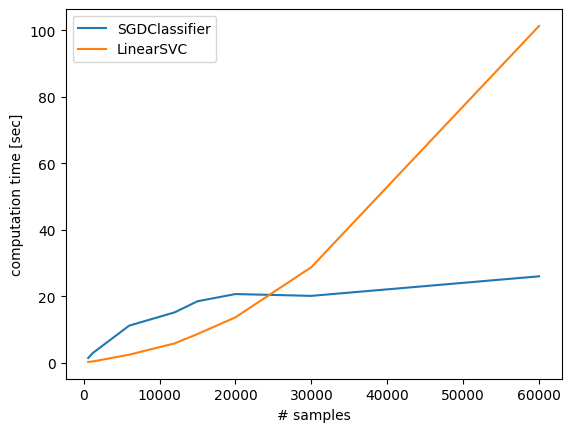

In [ ]:
# 確率勾配法とLinearSVCはどちらが速いのか？

from sklearn.svm import LinearSVC

for clf in [SGDClassifier(loss="hinge"),
            LinearSVC(dual=False)]:
    times = []
    sizes = []
    for thin in [100, 50, 10, 5, 4, 3, 2, 1]:
        st = time.time()
        clf.fit(X_train[::thin], y_train[::thin])
        times.append(time.time() - st)
        sizes.append(y_train[::thin].size)
    plt.plot(sizes, times, label=clf.__class__.__name__)

plt.legend(loc="best")
plt.ylabel("computation time [sec]")
plt.xlabel("# samples")
plt.show()

In [ ]:
# 確率勾配法（SVM）で学習時間を見る

C_range_exp = np.arange(-5.0, 15.0)
C_range = 10 ** C_range_exp

scores = []
comp_time = []

clf = SGDClassifier(loss="hinge") # SVM

for C in C_range:
    clf.alpha = X_train.shape[0] / C # n_sample/alpha = C http://scikit-learn.org/stable/modules/svm.html#svc

    st = time.time()
    clf.fit(X_train, y_train)
    et = time.time() - st

    comp_time.append(et)
    score = clf.score(X_test, y_test)
    scores.append(score)

    print(C, et, score)

1e-05 20.297935485839844 0.4659
0.0001 20.939348220825195 0.6784
0.001 18.470831871032715 0.4521
0.01 21.74118423461914 0.1759
0.1 20.891541004180908 0.1577
1.0 23.01639175415039 0.6206
10.0 19.825621128082275 0.0974
100.0 22.717522144317627 0.5962
1000.0 26.72200870513916 0.6972
10000.0 11.354966163635254 0.5357
100000.0 7.884504795074463 0.8099
1000000.0 8.598951578140259 0.8869
10000000.0 10.192642450332642 0.9081
100000000.0 15.175136804580688 0.917
1000000000.0 29.98652672767639 0.9156
10000000000.0 86.28744792938232 0.9049
100000000000.0 165.2731418609619 0.8846
1000000000000.0 211.03221726417542 0.8964
10000000000000.0 177.0253608226776 0.891
100000000000000.0 76.91641187667847 0.8812


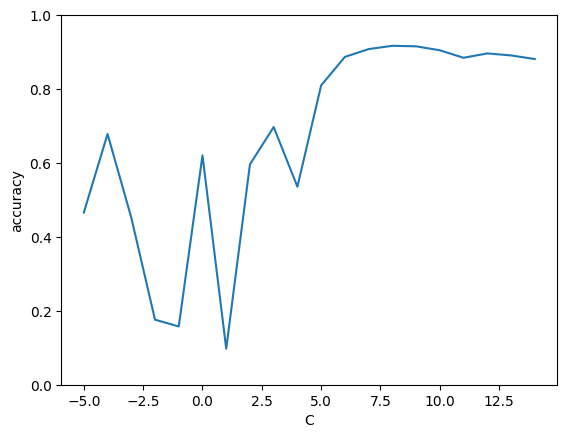

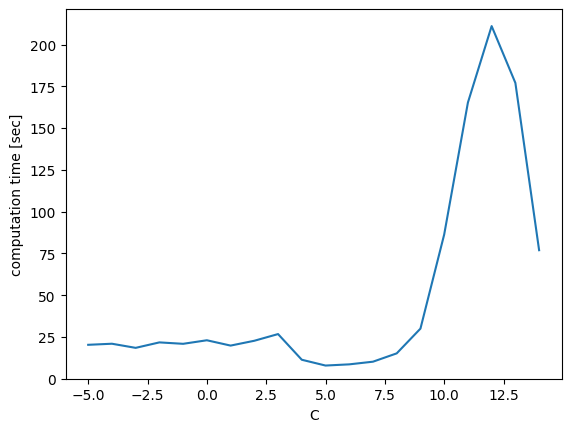

In [ ]:
scores = np.array(scores)
comp_time = np.array(comp_time)

plt.plot(C_range_exp, scores)
plt.ylabel("accuracy")
plt.xlabel("C");
plt.ylim(0,1)

plt.show()

plt.plot(C_range_exp, comp_time)
plt.ylim(0,)
plt.ylabel("computation time [sec]")
plt.xlabel("C");

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV


estimators = [('scaler', MinMaxScaler()),
              ('clf', SGDClassifier(loss="hinge"))]

pipe = Pipeline(estimators)

param = {'clf__alpha': (X_train.shape[0] * 2./3.) / (10**np.arange(-5.0, 10.0)) }

gs = GridSearchCV(pipe, param, n_jobs=-1, verbose=2, return_train_score=True)
gs.fit(X_train, y_train)

Fitting 5 folds for each of 15 candidates, totalling 75 fits


GridSearchCV(estimator=Pipeline(steps=[('scaler', MinMaxScaler()),
                                       ('clf', SGDClassifier())]),
             n_jobs=-1,
             param_grid={'clf__alpha': array([4.e+09, 4.e+08, 4.e+07, 4.e+06, 4.e+05, 4.e+04, 4.e+03, 4.e+02,
       4.e+01, 4.e+00, 4.e-01, 4.e-02, 4.e-03, 4.e-04, 4.e-05])},
             return_train_score=True, verbose=2)

Text(0.5, 1.0, 'SGDClassifier')

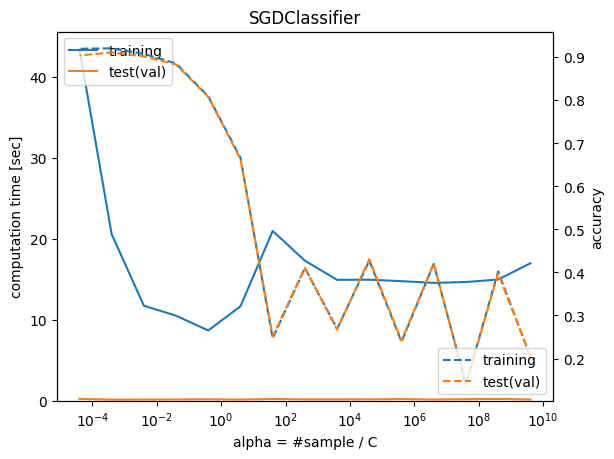

In [ ]:
plt.plot(gs.cv_results_['param_clf__alpha'].data,
         gs.cv_results_['mean_fit_time'],
         label="training")

plt.plot(gs.cv_results_['param_clf__alpha'].data,
         gs.cv_results_['mean_score_time'],
         label="test(val)")
plt.ylabel("computation time [sec]")
plt.ylim(0,)
plt.xscale("log")
plt.xlabel("alpha = #sample / C")
plt.legend(loc="upper left");

plt.twinx()

plt.plot(gs.cv_results_['param_clf__alpha'].data,
         gs.cv_results_['mean_train_score'],
         linestyle="--",
         label="training")

plt.plot(gs.cv_results_['param_clf__alpha'].data,
         gs.cv_results_['mean_test_score'],
         linestyle="--",
         label="test(val)")
plt.ylabel("accuracy")
plt.legend(loc="lower right");

plt.title("SGDClassifier")